In [ ]:
!pip install optuna plotly

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.9/395.9 kB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 247.0/247.0 kB 6.8 MB/s eta 0:00:00


In [ ]:
pip install scikeras

In [ ]:
!pip install -U albumentations

In [ ]:
pip install --upgrade wandb

In [ ]:
import wandb
print(wandb.__version__)

0.21.0


In [ ]:
import pandas as pd
import zipfile
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, roc_auc_score, precision_score, recall_score
import joblib
from tqdm import tqdm
import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances
import plotly.io as pio
from google.colab import drive
import albumentations as A
from IPython.display import display
import wandb

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input, Dropout, Flatten, GlobalAveragePooling2D, Reshape, multiply
from tensorflow.keras.optimizers import Adam, AdamW, RMSprop
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import backend as K
from tensorflow.keras.metrics import Precision, Recall, AUC
from tensorflow.keras.losses import CategoricalCrossentropy

import warnings

warnings.filterwarnings('ignore')

In [ ]:
!pip uninstall -y wandb
!pip install wandb==0.21.0

In [ ]:
import importlib
importlib.reload(wandb)

from wandb.integration.keras import WandbMetricsLogger, WandbModelCheckpoint

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget -O Kather_texture_2016_image_tiles_5000.zip "https://zenodo.org/record/53169/files/Kather_texture_2016_image_tiles_5000.zip?download=1"

with zipfile.ZipFile("Kather_texture_2016_image_tiles_5000.zip", 'r') as zip_ref:
    zip_ref.extractall("kather_dataset")

for root, dirs, files in os.walk("kather_dataset"):
    print(f"📁 {root}")
    for file in files[:5]:
        print(f"  └── {file}")
    print()


--2025-07-11 20:41:51--  https://zenodo.org/record/53169/files/Kather_texture_2016_image_tiles_5000.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.45.92, 188.185.48.194, 188.185.43.25, ...
Connecting to zenodo.org (zenodo.org)|188.185.45.92|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/53169/files/Kather_texture_2016_image_tiles_5000.zip [following]
--2025-07-11 20:41:52--  https://zenodo.org/records/53169/files/Kather_texture_2016_image_tiles_5000.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 258098431 (246M) [application/octet-stream]
Saving to: ‘Kather_texture_2016_image_tiles_5000.zip’

Kather_texture_2016 100%[===================>] 246.14M  19.3MB/s    in 16s     

2025-07-11 20:42:08 (15.5 MB/s) - ‘Kather_texture_2016_image_tiles_5000.zip’ saved [258098431/258098431]

📁 kather_dataset

📁 kather_dataset/Kather_texture_2016_image_tiles_5000

📁 kather_datase

In [ ]:
tf.keras.mixed_precision.set_global_policy('mixed_float16')

In [ ]:
image_paths = []
labels = []

base_dir = 'kather_dataset/Kather_texture_2016_image_tiles_5000'

for label_dir in os.listdir(base_dir):
    label_path = os.path.join(base_dir, label_dir)
    if os.path.isdir(label_path):
        for filename in os.listdir(label_path):
            if filename.endswith('.tif'):
                image_paths.append(os.path.join(label_path, filename))
                labels.append(label_dir)

df = pd.DataFrame({'path': image_paths, 'label': labels})
df = df.sort_values(by='path').reset_index(drop=True)

print("Class Distribution:")
print(df['label'].value_counts(normalize=True) * 100)

train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

print("\nTrain:\n", train_df['label'].value_counts(normalize=True) * 100)
print("\nTest:\n", test_df['label'].value_counts(normalize=True) * 100)

train_df.to_csv("train_split.csv", index=False)
test_df.to_csv("test_split.csv", index=False)


Class Distribution:
label
01_TUMOR      12.5
02_STROMA     12.5
03_COMPLEX    12.5
04_LYMPHO     12.5
05_DEBRIS     12.5
06_MUCOSA     12.5
07_ADIPOSE    12.5
08_EMPTY      12.5
Name: proportion, dtype: float64

Train:
 label
07_ADIPOSE    12.5
06_MUCOSA     12.5
01_TUMOR      12.5
05_DEBRIS     12.5
03_COMPLEX    12.5
02_STROMA     12.5
04_LYMPHO     12.5
08_EMPTY      12.5
Name: proportion, dtype: float64

Test:
 label
08_EMPTY      12.5
02_STROMA     12.5
01_TUMOR      12.5
03_COMPLEX    12.5
04_LYMPHO     12.5
07_ADIPOSE    12.5
06_MUCOSA     12.5
05_DEBRIS     12.5
Name: proportion, dtype: float64


# First EDA

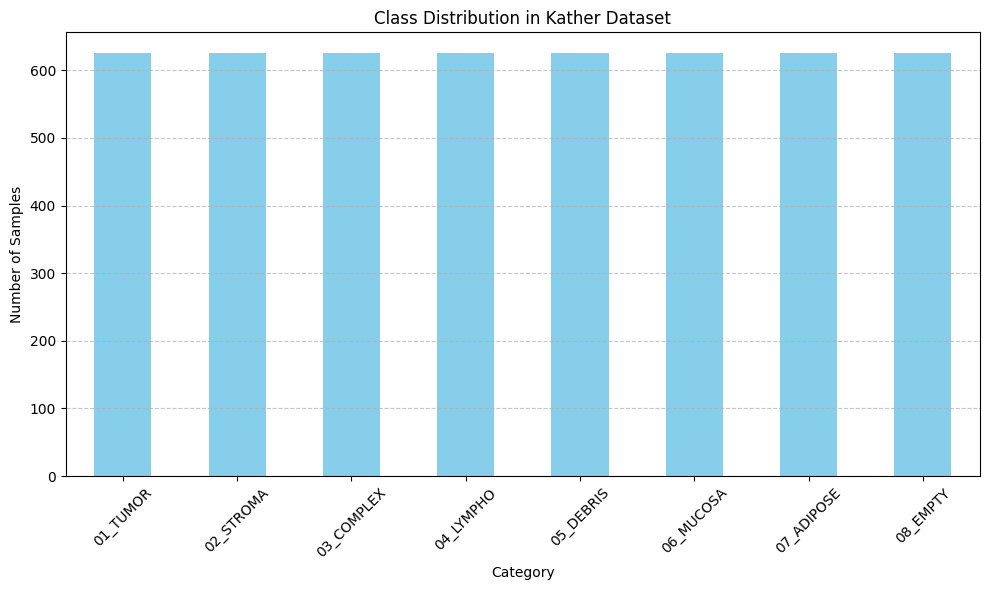

Each category contains 625 samples.


In [ ]:
label_counts = df['label'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
label_counts.plot(kind='bar', color='skyblue')
plt.title("Class Distribution in Kather Dataset")
plt.xlabel("Category")
plt.ylabel("Number of Samples")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("Each category contains", label_counts.values[0], "samples.")

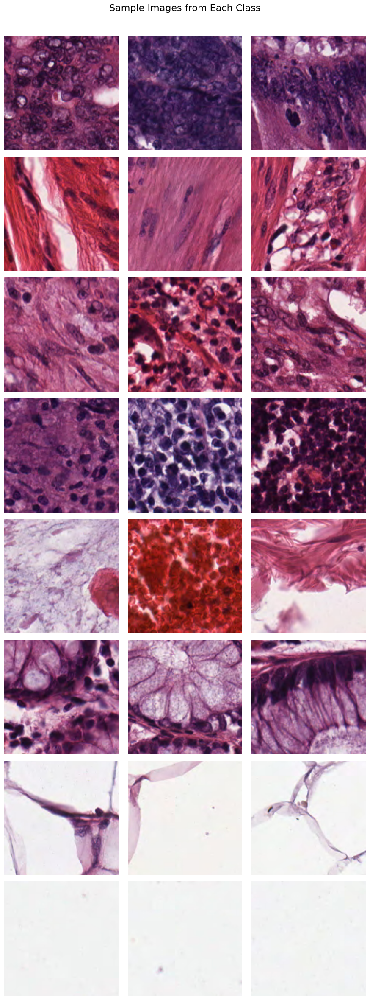

In [ ]:
samples_per_class = 3

grouped = df.groupby('label')['path'].apply(list)

fig, axes = plt.subplots(len(grouped), samples_per_class, figsize=(samples_per_class * 3, len(grouped) * 3))
fig.suptitle("Sample Images from Each Class", fontsize=16)

for row_idx, (label, paths) in enumerate(grouped.items()):
    for col_idx in range(samples_per_class):
        img = Image.open(paths[col_idx])
        ax = axes[row_idx, col_idx] if samples_per_class > 1 else axes[row_idx]
        ax.imshow(img)
        ax.axis('off')
        if col_idx == 0:
            ax.set_ylabel(label, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


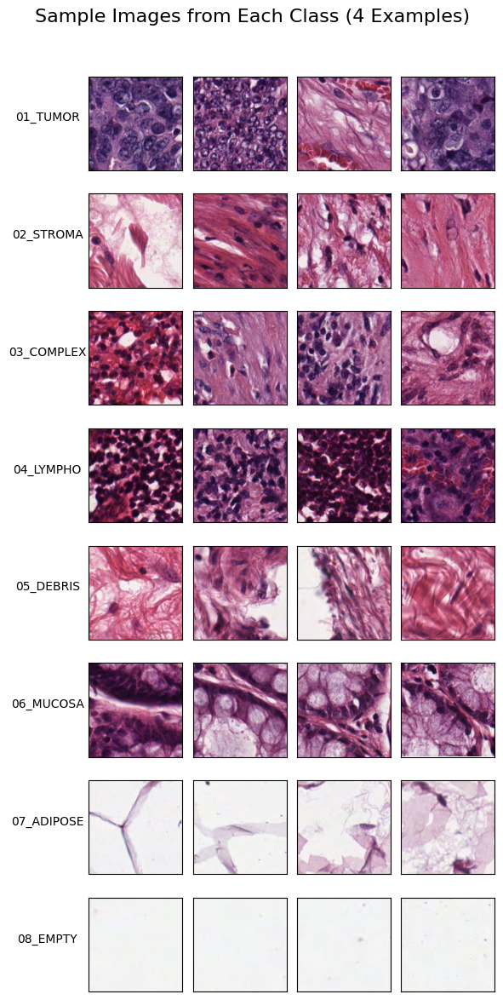

In [ ]:
SAMPLES_PER_CLASS = 4
grouped_df = train_df.groupby('label')

fig, axes = plt.subplots(len(grouped_df), SAMPLES_PER_CLASS, figsize=(SAMPLES_PER_CLASS * 1.5, len(grouped_df) * 1.5))
fig.suptitle('Sample Images from Each Class (4 Examples)', fontsize=16)

for row_idx, (label, group) in enumerate(grouped_df):
    sample_paths = group['path'].head(SAMPLES_PER_CLASS).tolist()

    axes[row_idx, 0].set_ylabel(label, rotation=0, size='medium', labelpad=35)

    for col_idx, img_path in enumerate(sample_paths):
        ax = axes[row_idx, col_idx]
        try:
            img = Image.open(img_path)
            ax.imshow(img)
        except FileNotFoundError:
            ax.text(0.5, 0.5, 'Image not found', ha='center', va='center')

        ax.set_xticks([])
        ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

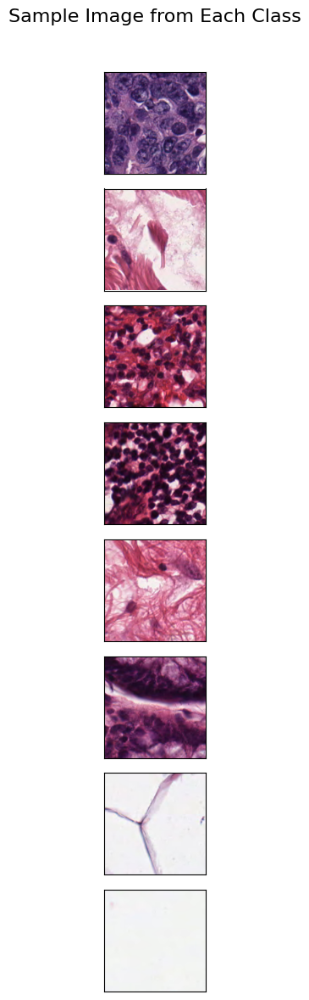

In [ ]:
SAMPLES_PER_CLASS = 1
grouped_df = train_df.groupby('label')

fig, axes = plt.subplots(len(grouped_df), SAMPLES_PER_CLASS, figsize=(SAMPLES_PER_CLASS * 1.5, len(grouped_df) * 1.5))
fig.suptitle('Sample Image from Each Class', fontsize=16)

for row_idx, (label, group) in enumerate(grouped_df):
    sample_path = group['path'].head(SAMPLES_PER_CLASS).iloc[0]
    ax = axes[row_idx]

    try:
        img = Image.open(sample_path)
        ax.imshow(img)
    except FileNotFoundError:
        ax.text(0.5, 0.5, 'Image not found', ha='center', va='center')

    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Loading images: 100%|██████████| 4000/4000 [00:04<00:00, 808.12it/s]


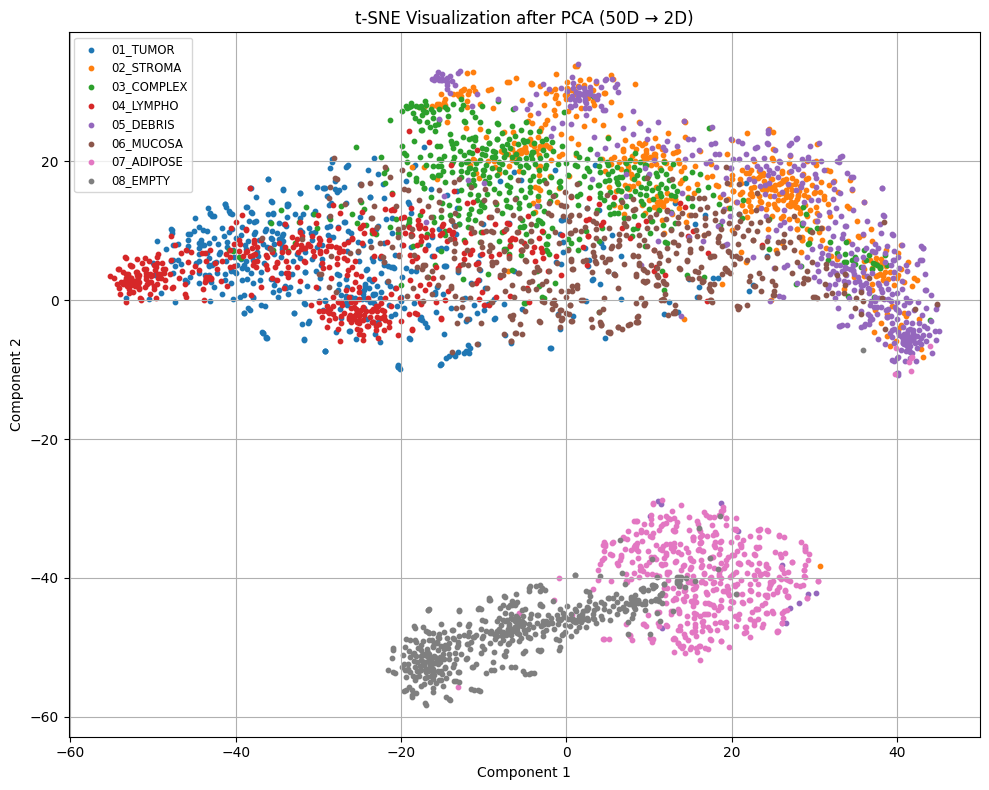

In [ ]:
def load_and_flatten(image_paths, size=(150, 150)):
    data = []
    for path in tqdm(image_paths, desc="Loading images"):
        img = Image.open(path).resize(size)
        img_array = np.asarray(img).astype(np.float32) / 255.0
        data.append(img_array.flatten())
    return np.array(data)

X_train_paths = train_df['path'].values
y_train_labels = train_df['label'].values

# Step 1: Flatten images
X_flat = load_and_flatten(X_train_paths)

# Step 2: PCA to 50 dimensions
pca = PCA(n_components=50, random_state=42)
X_pca = pca.fit_transform(X_flat)

# Step 3: t-SNE to 2D
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

# Step 4: 2D Scatter Plot
plt.figure(figsize=(10, 8))
for label in np.unique(y_train_labels):
    idx = y_train_labels == label
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=label, s=10)

plt.title("t-SNE Visualization after PCA (50D → 2D)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.legend(loc='best', fontsize='small')
plt.grid(True)
plt.tight_layout()
plt.show()


# Secondary EDA and Visualization

In [ ]:
# Flatten + Downsample

def extract_features_flatten(image_paths, size=(32, 32)):
    features = []
    for path in tqdm(image_paths, desc="Flatten + Downsample"):
        img = Image.open(path).resize(size)
        img_array = np.asarray(img).astype(np.float32) / 255.0
        features.append(img_array.flatten())
    return np.array(features)

X_flatten = extract_features_flatten(train_df['path'])

Flatten + Downsample: 100%|██████████| 4000/4000 [00:03<00:00, 1180.82it/s]


In [ ]:
# PCA

def extract_features_pca(image_paths, n_components=256):
    flat_images = []
    for path in tqdm(image_paths, desc="PCA - Flatten 150x150"):
        img = Image.open(path).resize((150, 150))
        img_array = np.asarray(img).astype(np.float32) / 255.0
        flat_images.append(img_array.flatten())
    X = np.array(flat_images)

    pca = PCA(n_components=n_components, random_state=42)
    X_pca = pca.fit_transform(X)
    return X_pca

X_pca = extract_features_pca(train_df['path'])

PCA - Flatten 150x150: 100%|██████████| 4000/4000 [00:03<00:00, 1200.03it/s]


In [ ]:
# VGG-16 Backbone

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

model = Model(inputs=base_model.input, outputs=base_model.output)

def extract_features_vgg(image_paths):
    features = []
    for path in tqdm(image_paths, desc="VGG16 Features (150x150)"):

        img = image.load_img(path, target_size=(150, 150))

        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = preprocess_input(img_array)

        vgg_output = model.predict(img_array, verbose=0)

        features.append(vgg_output.flatten())
    return np.array(features)

X_vgg = extract_features_vgg(train_df['path'])

print(f"\nFinished feature extraction.")
print(f"Shape of the new X_vgg matrix: {X_vgg.shape}")
print(f"Length of a single feature vector: {X_vgg.shape[1]}")


VGG16 Features (150x150): 100%|██████████| 4000/4000 [05:11<00:00, 12.85it/s]


Finished feature extraction.
Shape of the new X_vgg matrix: (4000, 8192)
Length of a single feature vector: 8192



=== Flatten + Downsample (32×32) (Statistics on 3072 features) ===
Mean of means: 0.5695
Std of means: 0.0732
Mean of stds: 0.2755
Std of stds: 0.0327


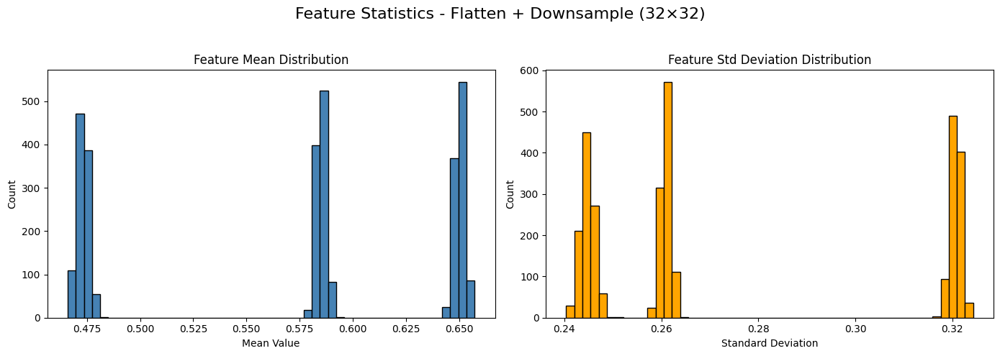


=== PCA (256 components) (Statistics on 256 features) ===
Mean of means: 0.0000
Std of means: 0.0001
Mean of stds: 2.1748
Std of stds: 3.8699


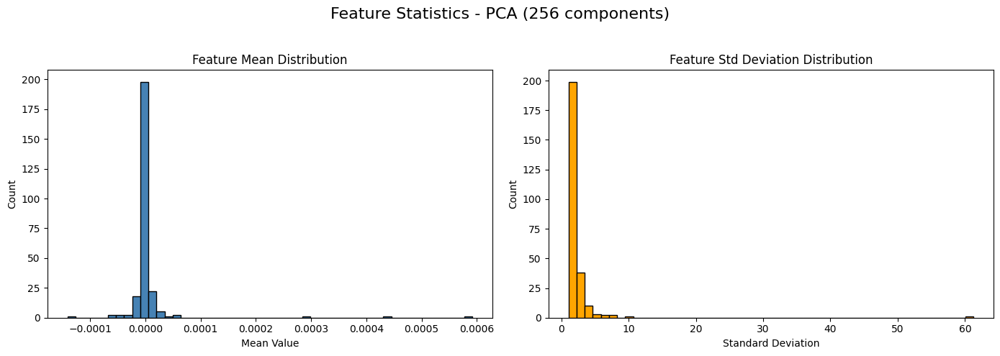


INFO for 'VGG16 Backbone (8192 features)': Filtered out 3795 features with zero or non-finite standard deviation.

=== VGG16 Backbone (8192 features) (Statistics on 4397 features) ===
Mean of means: 0.3740
Std of means: 0.2695
Mean of stds: 2.3516
Std of stds: 0.9736


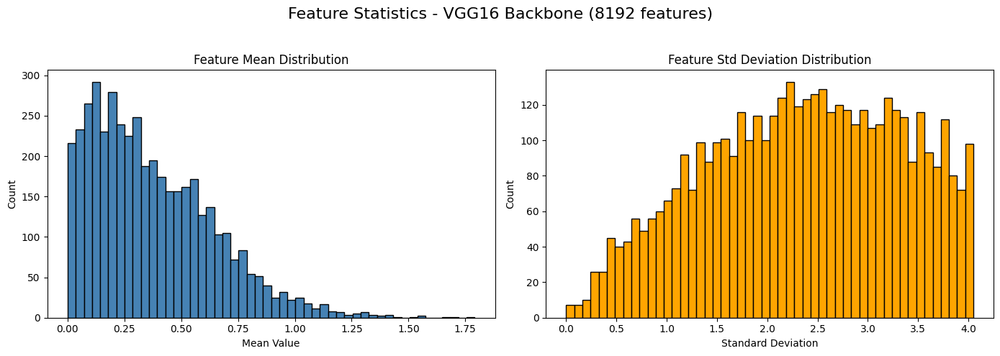

In [ ]:
def plot_feature_statistics(X, method_name):
    # Compute feature-wise mean and std
    feature_means = np.mean(X, axis=0)
    feature_stds = np.std(X, axis=0)

    good_indices = np.where((feature_stds > 0) & np.isfinite(feature_stds))[0]

    filtered_means = feature_means[good_indices]
    filtered_stds = feature_stds[good_indices]

    original_feature_count = X.shape[1]
    filtered_feature_count = len(good_indices)
    if original_feature_count != filtered_feature_count:
        print(f"\nINFO for '{method_name}': "
              f"Filtered out {original_feature_count - filtered_feature_count} "
              f"features with zero or non-finite standard deviation.")

    # Print statistics
    print(f"\n=== {method_name} (Statistics on {filtered_feature_count} features) ===")
    print(f"Mean of means: {np.mean(filtered_means):.4f}")
    print(f"Std of means: {np.std(filtered_means):.4f}")
    print(f"Mean of stds: {np.mean(filtered_stds):.4f}")
    print(f"Std of stds: {np.std(filtered_stds):.4f}")

    # Plot histograms
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"Feature Statistics - {method_name}", fontsize=16)

    axes[0].hist(filtered_means, bins=50, color='steelblue', edgecolor='black')
    axes[0].set_title("Feature Mean Distribution")
    axes[0].set_xlabel("Mean Value")
    axes[0].set_ylabel("Count")

    axes[1].hist(filtered_stds, bins=50, color='orange', edgecolor='black')
    axes[1].set_title("Feature Std Deviation Distribution")
    axes[1].set_xlabel("Standard Deviation")
    axes[1].set_ylabel("Count")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Flatten + Downsample
plot_feature_statistics(X_flatten, "Flatten + Downsample (32×32)")

# PCA
plot_feature_statistics(X_pca, "PCA (256 components)")

# VGG16
plot_feature_statistics(X_vgg, "VGG16 Backbone (8192 features)")


# Is normalization necessary?

Yes, feature normalization is necessary after the feature extraction stage. This is because the standard deviation varies significantly across features, especially in methods like PCA and VGG16. Normalization is important to ensure that all features contribute equally to the learning process and to prevent features with larger scales from dominating the model’s training.

In [ ]:
# Normalize Flatten features
scaler_flatten = StandardScaler()
X_flatten_scaled = scaler_flatten.fit_transform(X_flatten)

# Normalize PCA features
scaler_pca = StandardScaler()
X_pca_scaled = scaler_pca.fit_transform(X_pca)

# Normalize VGG16 features
scaler_vgg = StandardScaler()
X_vgg_scaled = scaler_vgg.fit_transform(X_vgg)


# Saving the scalers
joblib.dump(scaler_flatten, "scaler_flatten.pkl")
joblib.dump(scaler_pca, "scaler_pca.pkl")
joblib.dump(scaler_vgg, "scaler_vgg.pkl")

['scaler_vgg.pkl']

Running t-SNE for: Flatten + Downsample


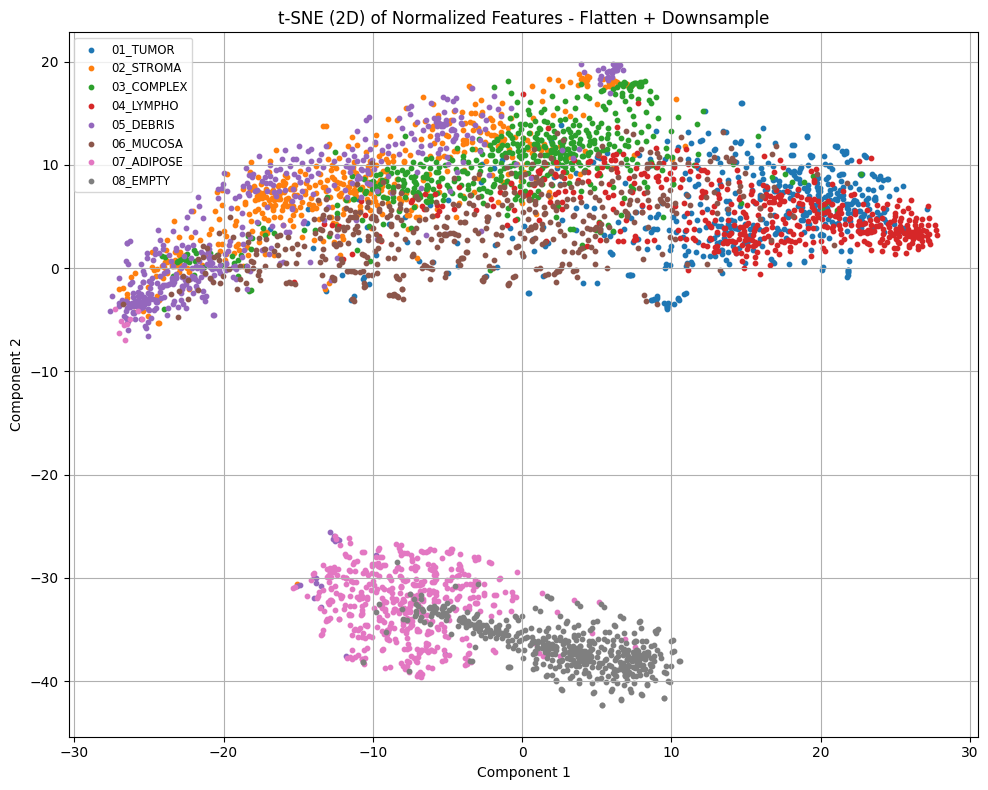

Running t-SNE for: PCA (256 components)


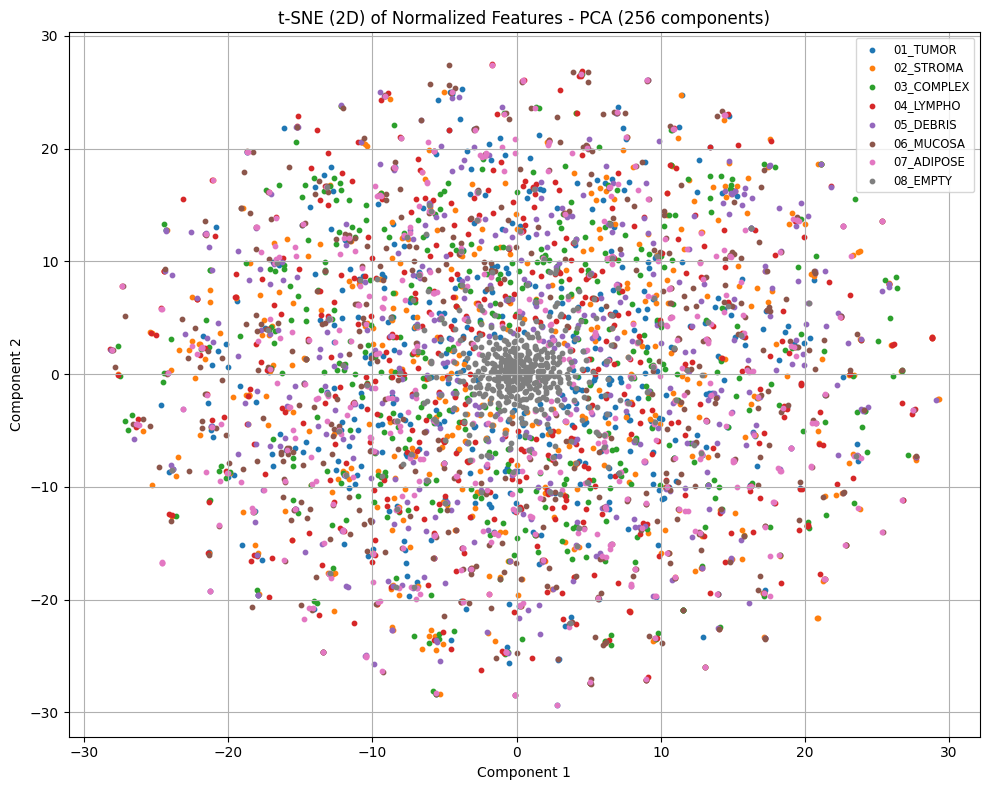

Running t-SNE for: VGG16 Backbone


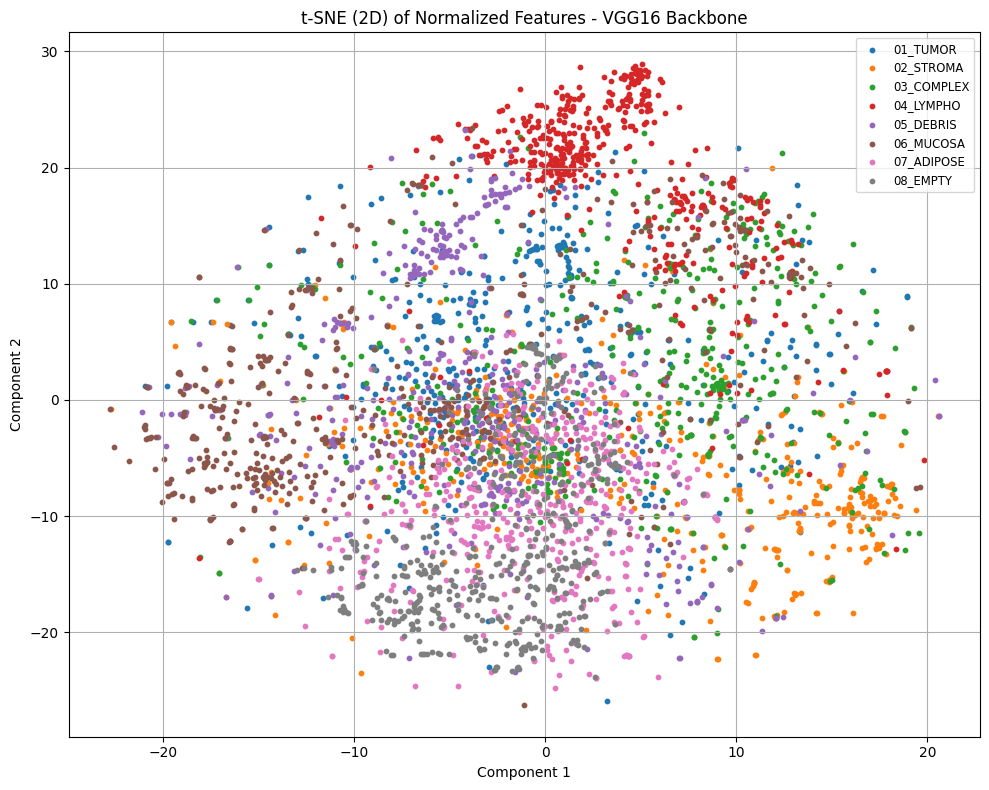

In [ ]:
def plot_tsne(X_scaled, labels, title):
    print(f"Running t-SNE for: {title}")
    tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(X_scaled)

    plt.figure(figsize=(10, 8))
    for label in np.unique(labels):
        idx = labels == label
        plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], label=label, s=10)

    plt.title(f"t-SNE (2D) of Normalized Features - {title}")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.legend(loc='best', fontsize='small')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Flatten + Downsample
plot_tsne(X_flatten_scaled, train_df['label'].values, "Flatten + Downsample")

# PCA
plot_tsne(X_pca_scaled, train_df['label'].values, "PCA (256 components)")

# VGG16
plot_tsne(X_vgg_scaled, train_df['label'].values, "VGG16 Backbone")

# Models - Experiments 1-9

In [ ]:
y_test_labels = test_df['label'].values

le = LabelEncoder()
y_train_enc = le.fit_transform(y_train_labels)
y_test_enc = le.transform(y_test_labels)
num_classes = len(le.classes_)

y_train_cat = to_categorical(y_train_enc, num_classes)
y_test_cat = to_categorical(y_test_enc, num_classes)

In [ ]:
def evaluate(model_name, y_train, y_train_pred, y_test, y_test_pred):
    acc_train = accuracy_score(y_train, y_train_pred)
    acc_test = accuracy_score(y_test, y_test_pred)
    f1_train = f1_score(y_train, y_train_pred, average='macro')
    f1_test = f1_score(y_test, y_test_pred, average='macro')
    overfit_gap = acc_train - acc_test
    cm = confusion_matrix(y_test, y_test_pred)

    print(f"\n {model_name}")
    print(f"Train Accuracy: {acc_train:.4f} | Test Accuracy: {acc_test:.4f}")
    print(f"Train F1 (Macro): {f1_train:.4f} | Test F1 (Macro): {f1_test:.4f}")
    print(f"Overfitting Gap: {overfit_gap:.4f}")
    print("Confusion Matrix:")
    print(cm)

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix - {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

In [ ]:
def build_nn(input_dim, num_classes):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(128, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
X_flatten_test = extract_features_flatten(test_df['path'])

X_pca_test = extract_features_pca(test_df['path'])

X_vgg_test = extract_features_vgg(test_df['path'])

VGG16 Features (150x150): 100%|██████████| 1000/1000 [01:19<00:00, 12.59it/s]


In [ ]:
X_flatten_test_scaled = scaler_flatten.transform(X_flatten_test)
X_pca_test_scaled     = scaler_pca.transform(X_pca_test)
X_vgg_test_scaled     = scaler_vgg.transform(X_vgg_test)


===== Feature Set: Flatten =====
SVM Support Vectors Info:
  - Number of support vectors for each class: [479 464 460 461 437 425 229 169]
  - Total support vectors: 3124
  - Shape of support vectors array: (3124, 3072)


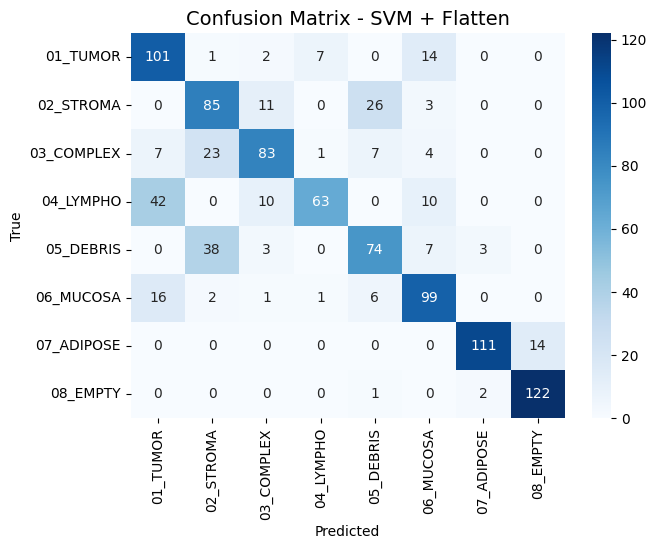


--- Training Softmax Regression (with convergence plot) ---
Softmax Model Coefficients Shape: (8, 3072)


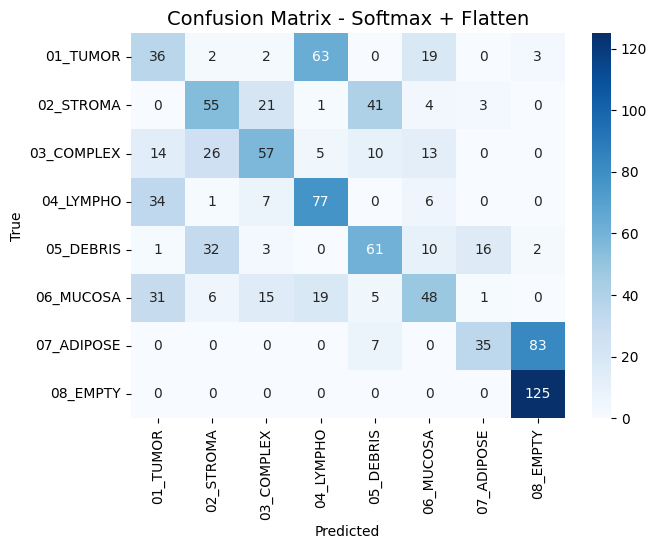

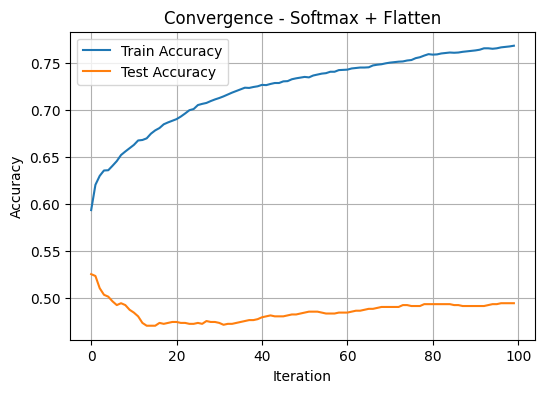


--- Training Neural Network ---
Model Summary for NN + Flatten:


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 128)            │       393,344 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 394,376 (1.50 MB)

 Trainable params: 394,376 (1.50 MB)

 Non-trainable params: 0 (0.00 B)

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


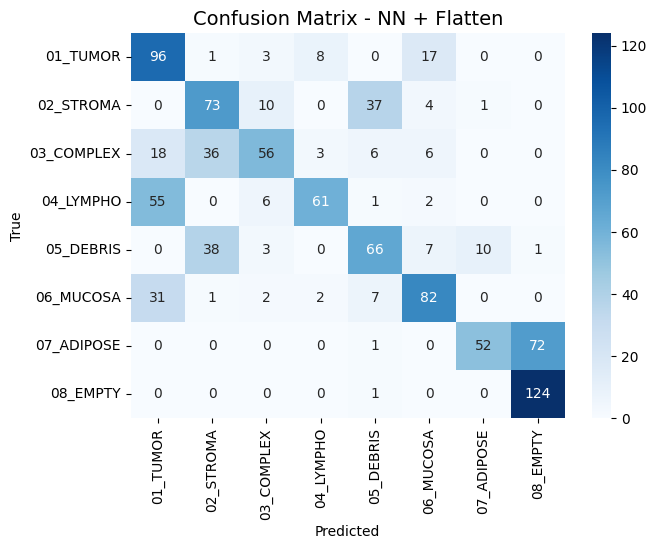

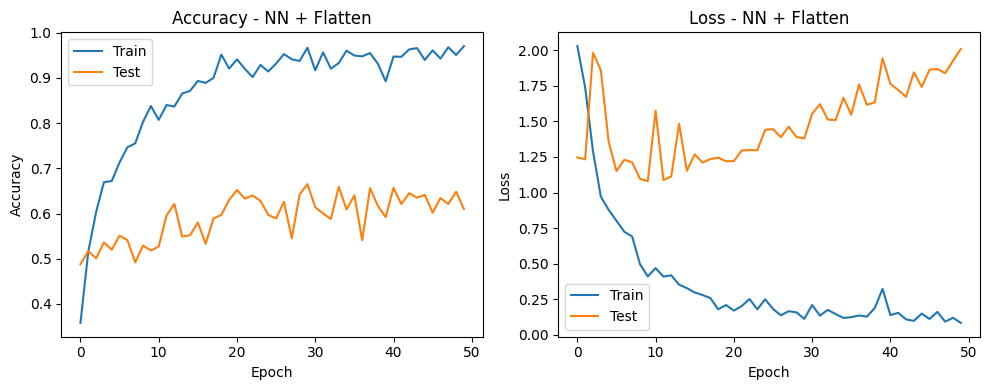


===== Feature Set: PCA =====
SVM Support Vectors Info:
  - Number of support vectors for each class: [495 485 500 500 500 500 401 157]
  - Total support vectors: 3538
  - Shape of support vectors array: (3538, 256)


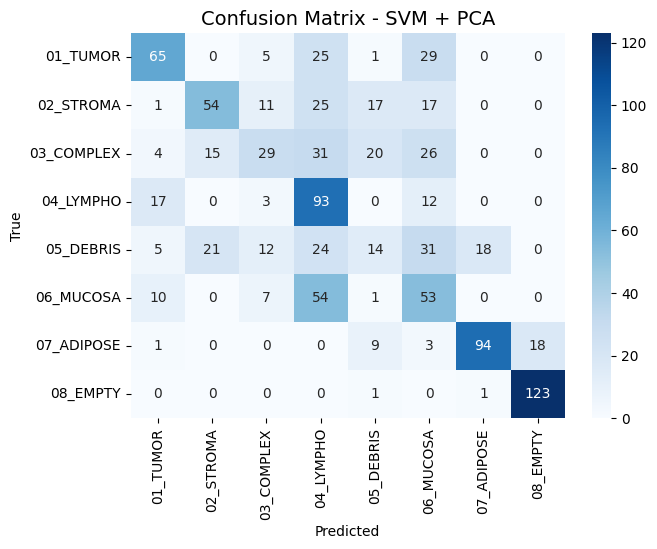


--- Training Softmax Regression (with convergence plot) ---
Softmax Model Coefficients Shape: (8, 256)


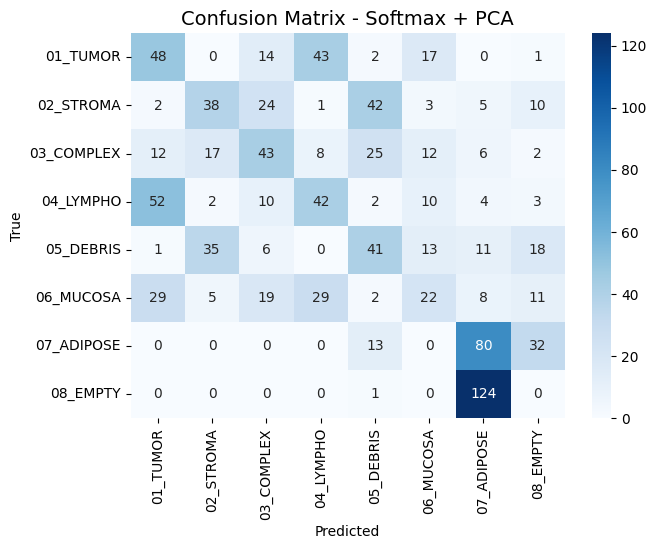

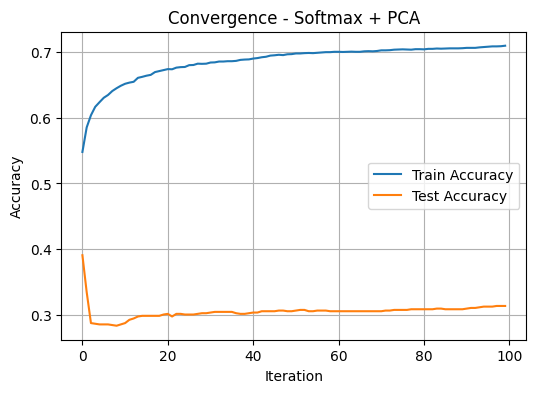


--- Training Neural Network ---
Model Summary for NN + PCA:


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,928 (132.53 KB)

 Trainable params: 33,928 (132.53 KB)

 Non-trainable params: 0 (0.00 B)

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


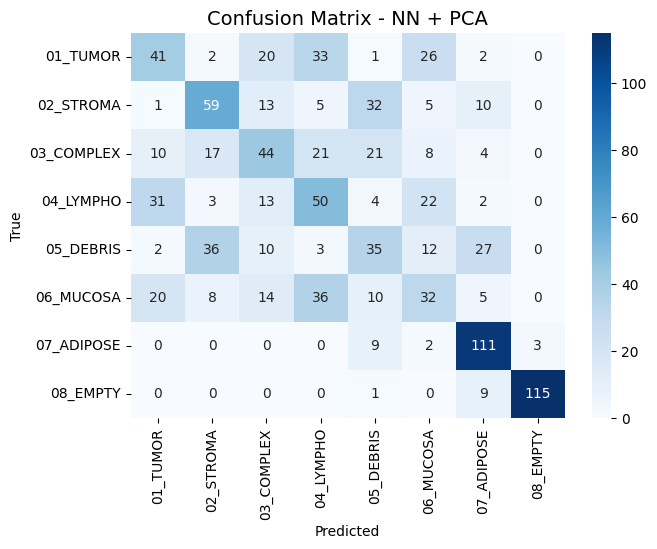

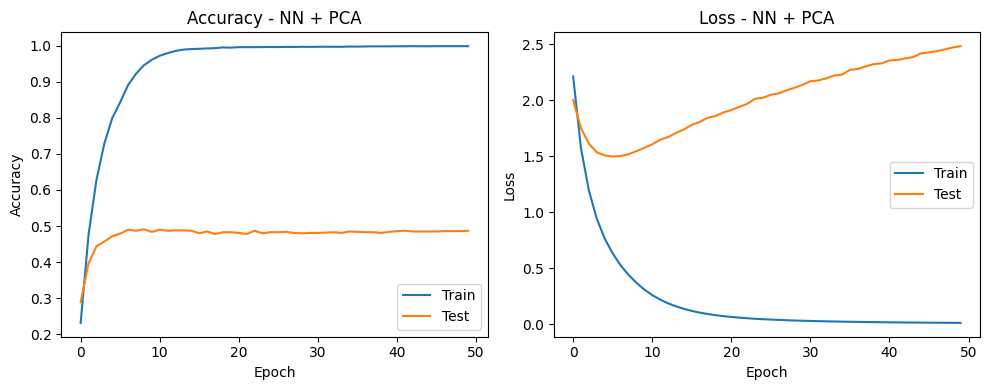


===== Feature Set: VGG16 =====
SVM Support Vectors Info:
  - Number of support vectors for each class: [490 464 481 305 497 453 456 107]
  - Total support vectors: 3253
  - Shape of support vectors array: (3253, 8192)


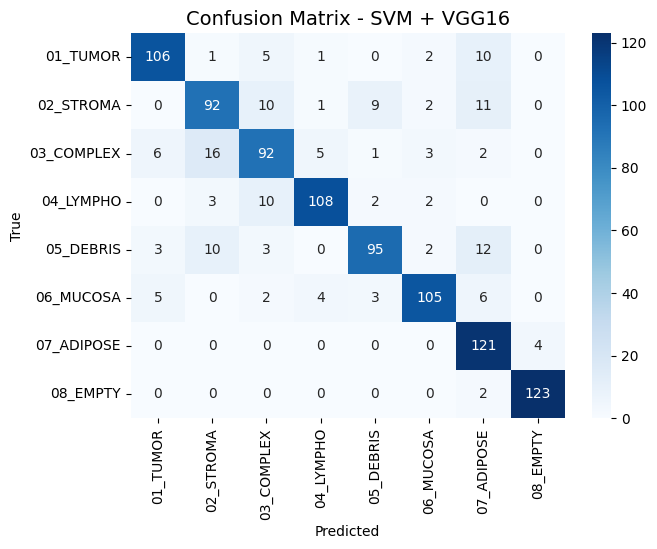


--- Training Softmax Regression (with convergence plot) ---
Softmax Model Coefficients Shape: (8, 8192)


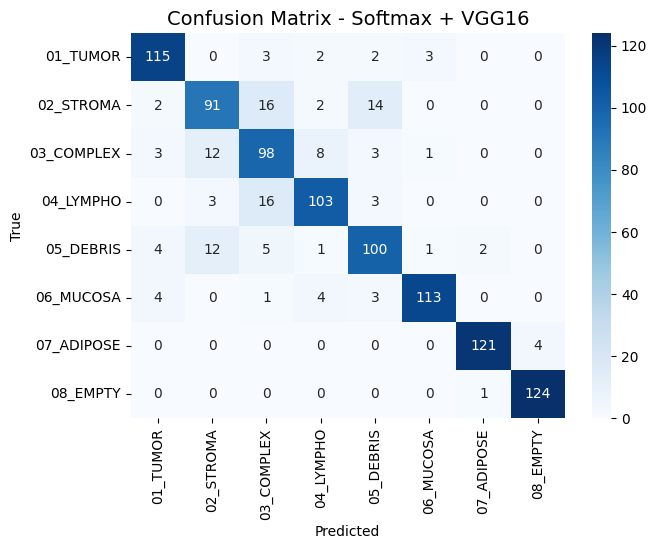

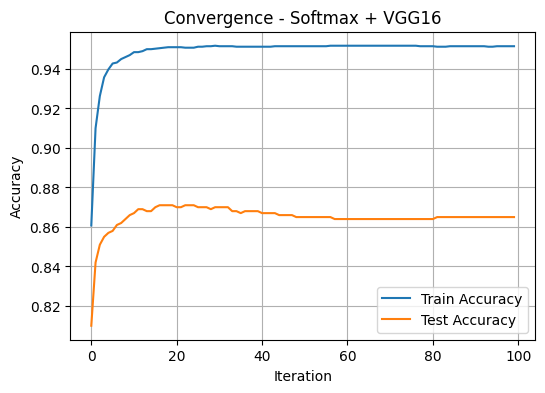


--- Training Neural Network ---
Model Summary for NN + VGG16:


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,049,736 (4.00 MB)

 Trainable params: 1,049,736 (4.00 MB)

 Non-trainable params: 0 (0.00 B)

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


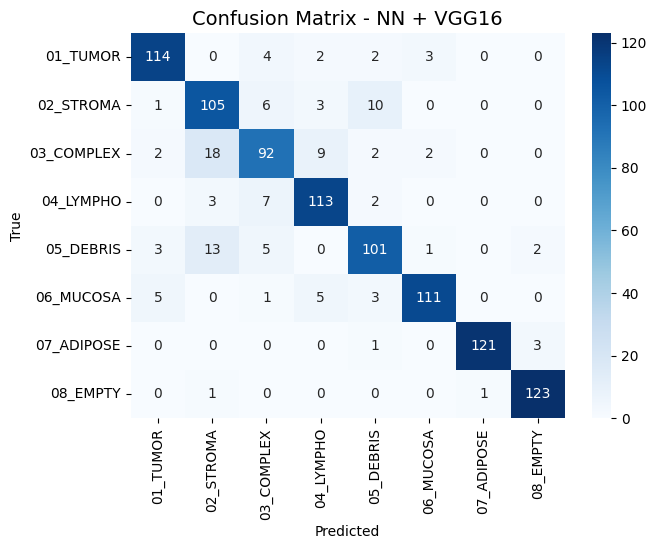

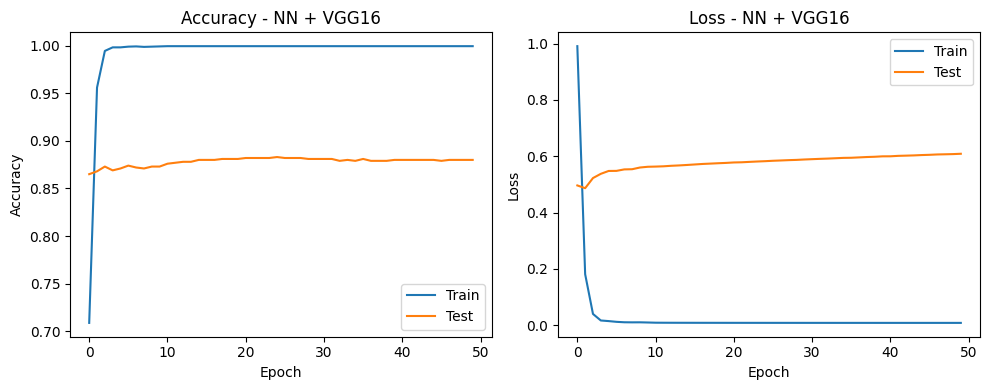

,Feature Set,Classifier,Train Accuracy,Test Accuracy,Train F1,Test F1,Overfitting Gap
0,Flatten,SVM,0.84625,0.738,0.845994,0.736447,0.10825
1,Flatten,Softmax,0.76850,0.494,0.765610,0.476993,0.27450
2,Flatten,Neural Network,0.94350,0.610,0.940821,0.602785,0.33350
3,PCA,SVM,0.95050,0.525,0.950381,0.511216,0.42550
4,PCA,Softmax,0.70900,0.314,0.706718,0.297185,0.39500
5,PCA,Neural Network,0.99850,0.487,0.998500,0.479006,0.51150
6,VGG16,SVM,0.97875,0.842,0.978820,0.841734,0.13675
7,VGG16,Softmax,0.95150,0.865,0.951600,0.865434,0.08650
8,VGG16,Neural Network,0.99950,0.880,0.999500,0.880135,0.11950


In [ ]:
results = []

feature_sets = {
    "Flatten": (X_flatten_scaled, X_flatten_test_scaled),
    "PCA":     (X_pca_scaled, X_pca_test_scaled),
    "VGG16":   (X_vgg_scaled, X_vgg_test_scaled)
}

def plot_confusion_matrix(y_true, y_pred, title, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title, fontsize=14)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

for name, (X_train, X_test) in feature_sets.items():
    print(f"\n===== Feature Set: {name} =====")

    # --- SVM ---
    svm = SVC(kernel='rbf', C=1.0, gamma='scale', random_state=42)
    svm.fit(X_train, y_train_enc)
    print(f"SVM Support Vectors Info:")
    print(f"  - Number of support vectors for each class: {svm.n_support_}")
    print(f"  - Total support vectors: {sum(svm.n_support_)}")
    print(f"  - Shape of support vectors array: {svm.support_vectors_.shape}")

    y_pred_train = svm.predict(X_train)
    y_pred_test = svm.predict(X_test)
    results.append({
        "Feature Set": name,
        "Classifier": "SVM",
        "Train Accuracy": accuracy_score(y_train_enc, y_pred_train),
        "Test Accuracy": accuracy_score(y_test_enc, y_pred_test),
        "Train F1": f1_score(y_train_enc, y_pred_train, average='macro'),
        "Test F1": f1_score(y_test_enc, y_pred_test, average='macro'),
        "Overfitting Gap": accuracy_score(y_train_enc, y_pred_train) - accuracy_score(y_test_enc, y_pred_test),
        "Confusion Matrix": confusion_matrix(y_test_enc, y_pred_test)
    })

    plot_confusion_matrix(y_test_enc, y_pred_test, f"Confusion Matrix - SVM + {name}", le.classes_)

    # --- Softmax ---
    print("\n--- Training Softmax Regression (with convergence plot) ---")
    softmax = LogisticRegression(solver='saga', max_iter=1, warm_start=True, random_state=42)

    n_iterations = 100
    train_scores, test_scores = [], []
    for i in range(n_iterations):
        softmax.fit(X_train, y_train_enc)
        train_scores.append(softmax.score(X_train, y_train_enc))
        test_scores.append(softmax.score(X_test, y_test_enc))

    print("Softmax Model Coefficients Shape:", softmax.coef_.shape)

    y_pred_train_softmax = softmax.predict(X_train)
    y_pred_test_softmax = softmax.predict(X_test)

    results.append({
        "Feature Set": name,
        "Classifier": "Softmax",
        "Train Accuracy": accuracy_score(y_train_enc, y_pred_train_softmax),
        "Test Accuracy": accuracy_score(y_test_enc, y_pred_test_softmax),
        "Train F1": f1_score(y_train_enc, y_pred_train_softmax, average='macro'),
        "Test F1": f1_score(y_test_enc, y_pred_test_softmax, average='macro'),
        "Overfitting Gap": accuracy_score(y_train_enc, y_pred_train_softmax) - accuracy_score(y_test_enc, y_pred_test_softmax),
        "Confusion Matrix": confusion_matrix(y_test_enc, y_pred_test_softmax)
    })

    plot_confusion_matrix(y_test_enc, y_pred_test_softmax, f"Confusion Matrix - Softmax + {name}", le.classes_)

    plt.figure(figsize=(6, 4))
    plt.plot(train_scores, label='Train Accuracy')
    plt.plot(test_scores, label='Test Accuracy')
    plt.title(f'Convergence - Softmax + {name}')
    plt.xlabel("Iteration")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- Neural Network ---
    print("\n--- Training Neural Network ---")
    model = build_nn(X_train.shape[1], num_classes)

    print(f"Model Summary for NN + {name}:")
    model.summary()
    history = model.fit(X_train, y_train_cat, validation_data=(X_test, y_test_cat),
                        epochs=50, batch_size=64, verbose=0)

    y_pred_train_nn = np.argmax(model.predict(X_train), axis=1)
    y_pred_test_nn = np.argmax(model.predict(X_test), axis=1)
    results.append({
        "Feature Set": name,
        "Classifier": "Neural Network",
        "Train Accuracy": accuracy_score(y_train_enc, y_pred_train_nn),
        "Test Accuracy": accuracy_score(y_test_enc, y_pred_test_nn),
        "Train F1": f1_score(y_train_enc, y_pred_train_nn, average='macro'),
        "Test F1": f1_score(y_test_enc, y_pred_test_nn, average='macro'),
        "Overfitting Gap": accuracy_score(y_train_enc, y_pred_train_nn) - accuracy_score(y_test_enc, y_pred_test_nn),
        "Confusion Matrix": confusion_matrix(y_test_enc, y_pred_test_nn)
    })
    plot_confusion_matrix(y_test_enc, y_pred_test_nn, f"Confusion Matrix - NN + {name}", le.classes_)

    plt.figure(figsize=(10, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Test')
    plt.title(f'Accuracy - NN + {name}')
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Test')
    plt.title(f'Loss - NN + {name}')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    plt.tight_layout()
    plt.show()

results_df = pd.DataFrame(results)

from IPython.display import display
display(results_df[['Feature Set', 'Classifier', 'Train Accuracy', 'Test Accuracy', 'Train F1', 'Test F1', 'Overfitting Gap']])

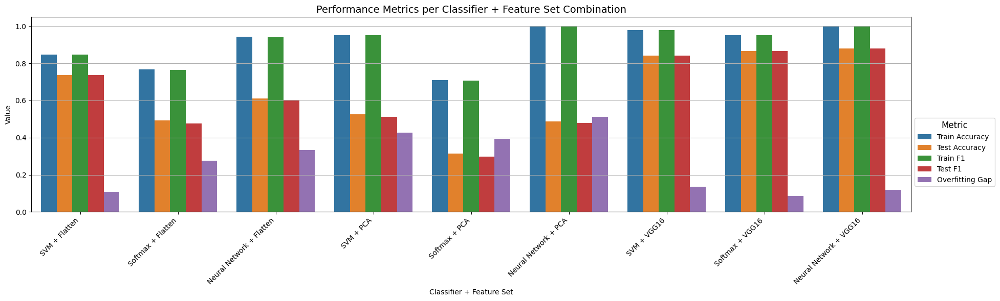

In [ ]:
melted_df = results_df.melt(
    id_vars=["Feature Set", "Classifier"],
    value_vars=["Train Accuracy", "Test Accuracy", "Train F1", "Test F1", "Overfitting Gap"],
    var_name="Metric",
    value_name="Value"
)

melted_df["Combination"] = melted_df["Classifier"] + " + " + melted_df["Feature Set"]

plt.figure(figsize=(18, 6))
sns.barplot(data=melted_df, x="Combination", y="Value", hue="Metric")

plt.title("Performance Metrics per Classifier + Feature Set Combination", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.xlabel("Classifier + Feature Set")
plt.ylabel("Value")
plt.grid(axis='y')
plt.tight_layout()
plt.legend(
    title="Metric",
    loc='upper left',
    bbox_to_anchor=(1, 0.5),
    fontsize=10,
    title_fontsize=12
)
plt.show()

## Model Improvement - Experiment 10

The following code until the end of the notebook includes several experiments with augmentations, fine tuning and several ML methods in a try to perfect the VGG16 + NN model.

# First Optuna Test - Regular Augmentation

First Optuna test, focused on deciding several hyperparameters such as: the number of unfrozen VGG16 layers, the size of the hidden layer, the dropout rate, learning rate, optimizer and activation function (only for the hidden layer, the classification layer was always activated with softmax).

The augmentation here is composed by a simple Keras ImageDataGeneration function.

Note: There is a KeyboardInterrupt error at the end of two optuna runs since there was a colab collapse at the midst of the optuna run and after restarting it from the point of the collapse - it tried to run for 60 trials again, so I had to interrupt it.

In [ ]:
def load_images_for_vgg(df, target_size=(150, 150)):
    images = []
    for path in tqdm(df['path'], desc=f"Loading {len(df)} images"):
        img = load_img(path, target_size=target_size)
        img_array = img_to_array(img)
        images.append(img_array)
    return preprocess_input(np.array(images, dtype=np.float32))

print("Loading and preprocessing training images...")
X_train_img = load_images_for_vgg(train_df)
print("Loading and preprocessing test images...")
X_test_img = load_images_for_vgg(test_df)

le = LabelEncoder()
y_train_enc = le.fit_transform(train_df['label'])
y_test_enc = le.transform(test_df['label'])
num_classes = len(le.classes_)


def objective(trial):
    input_shape = X_train_img.shape[1:]

    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    num_unfreeze = trial.suggest_categorical('num_unfreeze_layers', [0, 4, 7])

    if num_unfreeze > 0:
        for layer in base_model.layers[-num_unfreeze:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    x = Dense(trial.suggest_categorical('hidden_units', [256, 512, 1024]),
              activation=trial.suggest_categorical('activation', ['relu', 'tanh']))(x)
    x = Dropout(trial.suggest_float('dropout_rate', 0.2, 0.6))(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)

    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'AdamW', 'RMSprop'])
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 5e-4, log=True)

    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=learning_rate)
    elif optimizer_name == 'AdamW':
        optimizer = AdamW(learning_rate=learning_rate)
    else:
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    train_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    batch_size = trial.suggest_categorical('batch_size', [32, 64])

    early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True, verbose=0)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, min_lr=1e-7, verbose=0)

    model.fit(train_datagen.flow(X_train_img, y_train_enc, batch_size=batch_size),
              epochs=50,
              validation_data=(X_test_img, y_test_enc),
              callbacks=[early_stopping, lr_scheduler],
              verbose=0)

    y_pred_probs = model.predict(X_test_img)
    y_pred = np.argmax(y_pred_probs, axis=1)

    f1 = f1_score(y_test_enc, y_pred, average='macro')

    return f1


checkpoint_dir = '/content/drive/MyDrive/Colab_Checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
db_path = f"sqlite:///{checkpoint_dir}/kather_finetuning.db"
study_name = "vgg16-finetune-competition-v3"

study = optuna.create_study(
    direction='maximize',
    storage=db_path,
    study_name=study_name,
    load_if_exists=True
)

print(f"Starting/resuming study '{study_name}'. Number of past trials: {len(study.trials)}")
study.optimize(objective, n_trials=60)


print("\n--- OPTIMIZATION FINISHED ---")
print(f"Number of finished trials: {len(study.trials)}")

print("\nBest trial:")
trial = study.best_trial
print(f"  Value (Test F1 Macro): {trial.value:.4f}")
print("  Best Parameters: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

pio.renderers.default = "browser"

print("\nDisplaying optimization history plot...")
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

print("Displaying parameter importances plot...")
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()

Loading and preprocessing training images...


Loading 4000 images: 100%|██████████| 4000/4000 [00:02<00:00, 1363.31it/s]


Loading and preprocessing test images...


Loading 1000 images: 100%|██████████| 1000/1000 [00:00<00:00, 1478.14it/s]
[I 2025-06-26 20:05:02,088] Using an existing study with name 'vgg16-finetune-competition-v3' instead of creating a new one.


Starting/resuming study 'vgg16-finetune-competition-v3'. Number of past trials: 44


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step


[I 2025-06-26 20:17:22,824] Trial 44 finished with value: 0.9489031732648276 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.20505888960823485, 'optimizer': 'AdamW', 'learning_rate': 0.00022272540638309564, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-26 20:29:58,365] Trial 45 finished with value: 0.9331515082073609 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.20344058381739358, 'optimizer': 'AdamW', 'learning_rate': 0.0003087304379907313, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-26 20:43:46,416] Trial 46 finished with value: 0.8677005563326342 and parameters: {'num_unfreeze_layers': 0, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.30281101197059546, 'optimizer': 'Adam', 'learning_rate': 4.1173295175988924e-05, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step


[I 2025-06-26 20:46:50,776] Trial 47 finished with value: 0.21787287712287715 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'tanh', 'dropout_rate': 0.26587590169154174, 'optimizer': 'AdamW', 'learning_rate': 0.0004566998734628037, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-26 20:55:55,731] Trial 48 finished with value: 0.9361983026029186 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.4167840992113153, 'optimizer': 'AdamW', 'learning_rate': 5.523013089487609e-05, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-26 21:05:26,123] Trial 49 finished with value: 0.9351490411555217 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'relu', 'dropout_rate': 0.24260503880075243, 'optimizer': 'AdamW', 'learning_rate': 0.0002178377376945471, 'batch_size': 64}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-26 21:15:30,791] Trial 50 finished with value: 0.9303392244121957 and parameters: {'num_unfreeze_layers': 7, 'hidden_units': 512, 'activation': 'tanh', 'dropout_rate': 0.2943613174402436, 'optimizer': 'Adam', 'learning_rate': 3.475734580685434e-05, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-26 21:31:35,807] Trial 51 finished with value: 0.8721451815312989 and parameters: {'num_unfreeze_layers': 0, 'hidden_units': 1024, 'activation': 'relu', 'dropout_rate': 0.21016641218073862, 'optimizer': 'RMSprop', 'learning_rate': 1.4007288145008821e-05, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-26 21:40:01,829] Trial 52 finished with value: 0.9423412196020333 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.22975770524183176, 'optimizer': 'AdamW', 'learning_rate': 0.00018236384959755643, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-26 21:56:06,977] Trial 53 finished with value: 0.8816612846448745 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.23301786332643226, 'optimizer': 'AdamW', 'learning_rate': 0.00028199405305406877, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-26 22:02:00,697] Trial 54 finished with value: 0.9160817014005092 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.20418594383298697, 'optimizer': 'AdamW', 'learning_rate': 0.00021038929059949234, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-26 22:08:11,932] Trial 55 finished with value: 0.30032884997615833 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.2549353246965769, 'optimizer': 'AdamW', 'learning_rate': 0.00036019432330364437, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-26 22:16:19,301] Trial 56 finished with value: 0.9323808148542816 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.27728831054698566, 'optimizer': 'AdamW', 'learning_rate': 0.00013381140396113712, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-26 22:25:03,953] Trial 57 finished with value: 0.9390562285348468 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 512, 'activation': 'relu', 'dropout_rate': 0.22457945764026868, 'optimizer': 'AdamW', 'learning_rate': 9.424302970423268e-05, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-26 22:32:32,936] Trial 58 finished with value: 0.943823726577111 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'relu', 'dropout_rate': 0.23954017251443685, 'optimizer': 'AdamW', 'learning_rate': 0.00015949025759125055, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-26 22:43:12,875] Trial 59 finished with value: 0.9444091465049933 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'relu', 'dropout_rate': 0.32205013922779435, 'optimizer': 'AdamW', 'learning_rate': 0.00014614728498020302, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step


[I 2025-06-26 22:51:57,878] Trial 60 finished with value: 0.9285181322723777 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'relu', 'dropout_rate': 0.3308066383142336, 'optimizer': 'AdamW', 'learning_rate': 0.0001544144733932171, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-26 22:54:59,626] Trial 61 finished with value: 0.13518310885309429 and parameters: {'num_unfreeze_layers': 7, 'hidden_units': 256, 'activation': 'tanh', 'dropout_rate': 0.37527412207849903, 'optimizer': 'Adam', 'learning_rate': 0.00019623494210237337, 'batch_size': 32}. Best is trial 28 with value: 0.9503043449023848.
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
[W 2025-06-26 23:00:33,377] Trial 62 failed with parameters: {'num_unfreeze_layers': 4, 'hidden_units': 256, 'activation': 'relu', 'dropout_rate': 0.3138241477751492, 'optimizer': 'AdamW', 'learning_rate': 0.0002499299161567984, 'batch_size': 32} because of the following error: KeyboardInterrupt(

KeyboardInterrupt: 

In [ ]:
print("\n--- OPTIMIZATION FINISHED ---")
print(f"Number of finished trials: {len(study.trials)}")

print("\nBest trial:")
trial = study.best_trial
print(f"  Value (Test F1 Macro): {trial.value:.4f}")
print("  Best Parameters: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

pio.renderers.default = "colab"

print("\nDisplaying optimization history plot...")
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

print("Displaying parameter importances plot...")
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()


--- OPTIMIZATION FINISHED ---
Number of finished trials: 63

Best trial:
  Value (Test F1 Macro): 0.9503
  Best Parameters: 
    num_unfreeze_layers: 7
    hidden_units: 1024
    activation: relu
    dropout_rate: 0.5385197509774653
    optimizer: AdamW
    learning_rate: 5.4713850743422164e-05
    batch_size: 32

Displaying optimization history plot...


Displaying parameter importances plot...


In [ ]:
db_path = "sqlite:////content/drive/MyDrive/Colab_Checkpoints/kather_finetuning.db"
study_name_to_load = "vgg16-finetune-competition-v3"

print(f"Loading study '{study_name_to_load}' from database...")
loaded_study = optuna.load_study(
    study_name=study_name_to_load,
    storage=db_path
)
print("Study loaded successfully.")

results_df = loaded_study.trials_dataframe()

print(f"\nSuccessfully converted {len(results_df)} trials into a DataFrame.")
print("Displaying the first 5 rows of the results:")
display(results_df.head(62))

Loading study 'vgg16-finetune-competition-v3' from database...
Study loaded successfully.

Successfully converted 63 trials into a DataFrame.
Displaying the first 5 rows of the results:


,number,value,datetime_start,datetime_complete,duration,params_activation,params_batch_size,params_dropout_rate,params_hidden_units,params_learning_rate,params_num_unfreeze_layers,params_optimizer,state
0,0,0.482932,2025-06-26 12:31:56.393240,2025-06-26 12:48:14.838567,0 days 00:16:18.445327,relu,64,0.572304,1024,0.000191,4,AdamW,COMPLETE
1,1,0.592645,2025-06-26 12:48:14.876387,2025-06-26 12:52:55.343234,0 days 00:04:40.466847,tanh,64,0.566714,1024,0.000155,4,RMSprop,COMPLETE
2,2,0.889432,2025-06-26 12:52:55.373256,2025-06-26 13:05:46.564073,0 days 00:12:51.190817,relu,32,0.577300,512,0.000132,0,Adam,COMPLETE
3,3,0.871282,2025-06-26 13:05:46.594432,2025-06-26 13:16:31.246250,0 days 00:10:44.651818,tanh,64,0.583625,1024,0.000090,0,AdamW,COMPLETE
4,4,0.027778,2025-06-26 13:16:31.275917,2025-06-26 13:19:18.014601,0 days 00:02:46.738684,relu,32,0.272777,256,0.000371,7,Adam,COMPLETE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,57,0.939056,2025-06-26 22:16:19.311342,2025-06-26 22:25:03.931291,0 days 00:08:44.619949,relu,32,0.224579,512,0.000094,4,AdamW,COMPLETE
58,58,0.943824,2025-06-26 22:25:03.962113,2025-06-26 22:32:32.913815,0 days 00:07:28.951702,relu,32,0.239540,256,0.000159,4,AdamW,COMPLETE
59,59,0.944409,2025-06-26 22:32:32.945515,2025-06-26 22:43:12.854264,0 days 00:10:39.908749,relu,32,0.322050,256,0.000146,4,AdamW,COMPLETE
60,60,0.928518,2025-06-26 22:43:12.884659,2025-06-26 22:51:57.856684,0 days 00:08:44.972025,relu,32,0.330807,256,0.000154,4,AdamW,COMPLETE


In [ ]:
results_df.to_csv('trial_10_v1.csv')

In [ ]:
fig = optuna.visualization.plot_slice(study)
fig.show()

In [ ]:
fig = optuna.visualization.plot_contour(
    study,
    params=['num_unfreeze_layers', 'learning_rate']
)
fig.show()

In [ ]:
fig = optuna.visualization.plot_contour(
    study,
    params=['hidden_units', 'dropout_rate']
)
fig.show()

In [ ]:
fig = optuna.visualization.plot_parallel_coordinate(study)
fig.show()

# Second Optuna Run - Advanced Augmentation

In this Optuna run, we tried presenting the model with a new, more advanced augmentation method - Albumentations, and even fine tuning some of its variables like: the limitation of the image rotation angle (to both sides), how much to change the colors of the pictures and the probability of an elastic deformation being applied on the images.

Futhermore, we narrowed the search for the best hyperparameters for the Neural Network and the VGG model according to the first Optuna run.

In [ ]:
pio.renderers.default = "colab"

In [ ]:
def load_images_simple(df, target_size=(150, 150)):
    images = []
    for path in tqdm(df['path'], desc=f"Loading {len(df)} images"):
        img = load_img(path, target_size=target_size)
        img_array = img_to_array(img)
        images.append(img_array)
    return np.array(images)

X_train_img_uint8 = load_images_simple(train_df)
X_test_img_uint8 = load_images_simple(test_df)

le = LabelEncoder()
y_train_enc = le.fit_transform(train_df['label'])
y_test_enc = le.transform(test_df['label'])
num_classes = len(le.classes_)

Loading 1000 images: 100%|██████████| 1000/1000 [00:00<00:00, 1377.91it/s]


In [ ]:
y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

print("Original label for first sample:", y_train_enc[0])
print("One-hot encoded label for first sample:", y_train_one_hot[0])

Original label for first sample: 6
One-hot encoded label for first sample: [0. 0. 0. 0. 0. 0. 1. 0.]


In [ ]:
# New Augmentation Technique - Albumentations

def focal_loss_for_one_hot(gamma=2.0, alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * K.log(y_pred)
        loss = alpha * K.pow(1 - y_pred, gamma) * cross_entropy
        return K.sum(loss, axis=1)
    return focal_loss_fixed

def albumentations_generator_with_weights(X_data, y_one_hot_data, sample_weights, batch_size, aug_pipeline):
    indices = np.arange(len(X_data))
    while True:
        np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i : i + batch_size]
            if len(batch_indices) != batch_size:
                continue

            batch_x, batch_y, batch_sw = [], [], []
            for idx in batch_indices:
                image = X_data[idx]
                augmented = aug_pipeline(image=image.astype(np.uint8))
                augmented_image = augmented['image']

                batch_x.append(augmented_image)
                batch_y.append(y_one_hot_data[idx])
                batch_sw.append(sample_weights[idx])

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), np.array(batch_y), np.array(batch_sw)

In [ ]:
def objective_v3(trial):
    input_shape = (150, 150, 3)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    num_unfreeze = trial.suggest_categorical('num_unfreeze_layers', [4, 6, 8])
    if num_unfreeze > 0:
        for layer in base_model.layers[-num_unfreeze:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    num_hidden_layers = trial.suggest_categorical('num_hidden_layers', [1, 2])
    x = Dense(trial.suggest_categorical('hidden_units_1', [1024, 1536, 2048]),
              activation=trial.suggest_categorical('activation', ['relu', 'swish']))(x)
    x = Dropout(trial.suggest_float('dropout_rate_1', 0.3, 0.6))(x)
    if num_hidden_layers == 2:
        x = Dense(trial.suggest_categorical('hidden_units_2', [256, 512, 768]), activation='relu')(x)
        x = Dropout(trial.suggest_float('dropout_rate_2', 0.3, 0.5))(x)

    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'Lion'])
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1.5e-4, log=True)
    beta_1 = trial.suggest_float('beta_1', 0.85, 0.95)
    beta_2 = trial.suggest_float('beta_2', 0.99, 0.9999, log=True)

    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2)
    else:
        optimizer = tf.keras.optimizers.Lion(learning_rate=learning_rate, beta_1=beta_1, beta_2=beta_2)

    loss_name = trial.suggest_categorical('loss_function', ['crossentropy', 'focal_loss'])

    if loss_name == 'focal_loss':
        gamma = trial.suggest_float('focal_loss_gamma', 1.5, 3.0)
        loss_function = focal_loss_for_one_hot(gamma=gamma, alpha=0.25)
    else:
        smoothing_value = trial.suggest_float('label_smoothing', 0.0, 0.2)
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=smoothing_value)

    model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])

    rotation_limit = trial.suggest_int('rotation_limit', 15, 45)
    color_jitter_strength = trial.suggest_float('color_jitter_strength', 0.1, 0.4)
    elastic_transform_p = trial.suggest_float('elastic_transform_p', 0.2, 0.8)

    transform_pipeline = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=rotation_limit, p=0.7),
        A.ColorJitter(brightness=color_jitter_strength, contrast=color_jitter_strength, p=0.8),
        A.ElasticTransform(p=elastic_transform_p, alpha=120, sigma=120 * 0.05),
        A.GridDistortion(p=0.5),
        A.GaussNoise(p=0.2),
    ])

    problem_class_weight = trial.suggest_float('problem_class_weight', 1.5, 3.0)
    class_weight_dict = {i: 1.0 for i in range(num_classes)}
    idx_stroma = np.where(le.classes_ == '02_STROMA')[0][0]
    idx_complex = np.where(le.classes_ == '03_COMPLEX')[0][0]
    class_weight_dict[idx_stroma] = problem_class_weight
    class_weight_dict[idx_complex] = problem_class_weight
    sample_weights = np.array([class_weight_dict[label] for label in y_train_enc])

    batch_size = trial.suggest_categorical('batch_size', [16, 32])
    train_generator = albumentations_generator_with_weights(X_train_img_uint8, y_train_one_hot, sample_weights, batch_size, transform_pipeline)
    steps_per_epoch = len(X_train_img_uint8) // batch_size

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.3, patience=4)

    model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=100,
        validation_data=(preprocess_input(X_test_img_uint8.copy()), y_test_one_hot),
        callbacks=[early_stopping, lr_scheduler],
        verbose=0
    )

    y_pred_probs = model.predict(preprocess_input(X_test_img_uint8.copy()))
    y_pred = np.argmax(y_pred_probs, axis=1)
    f1 = f1_score(y_test_enc, y_pred, average='macro')

    return f1

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/Colab_Checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
db_path = f"sqlite:///{checkpoint_dir}/kather_finetuning.db"
study_name = "vgg16-advanced-aug-v5_3"

study = optuna.create_study(
    direction='maximize',
    storage=db_path,
    study_name=study_name,
    load_if_exists=True
)

print(f"Starting/resuming study '{study_name}'. Number of past trials: {len(study.trials)}")
study.optimize(objective_v3, n_trials=50)

[I 2025-06-28 10:29:15,310] Using an existing study with name 'vgg16-advanced-aug-v5_3' instead of creating a new one.


Starting/resuming study 'vgg16-advanced-aug-v5_3'. Number of past trials: 37
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step


[I 2025-06-28 10:44:03,609] Trial 37 finished with value: 0.8923176527066448 and parameters: {'num_unfreeze_layers': 8, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.3956434378220039, 'optimizer': 'Adam', 'learning_rate': 5.430244791098246e-05, 'beta_1': 0.8841099849864091, 'beta_2': 0.9979541675753393, 'loss_function': 'crossentropy', 'label_smoothing': 0.12121226443376978, 'rotation_limit': 28, 'color_jitter_strength': 0.14083528992036082, 'elastic_transform_p': 0.39697444963039286, 'problem_class_weight': 2.288398565926833, 'batch_size': 32}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step


[I 2025-06-28 10:46:58,913] Trial 38 finished with value: 0.6630384444504382 and parameters: {'num_unfreeze_layers': 4, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.44030561184697037, 'optimizer': 'Lion', 'learning_rate': 4.126075497998689e-05, 'beta_1': 0.9008486434195926, 'beta_2': 0.9998856404699142, 'loss_function': 'crossentropy', 'label_smoothing': 0.10053838079266057, 'rotation_limit': 25, 'color_jitter_strength': 0.11236181922803308, 'elastic_transform_p': 0.40708350576807784, 'problem_class_weight': 2.216752899477711, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step


[I 2025-06-28 10:58:21,124] Trial 39 finished with value: 0.9290370193064913 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 2048, 'activation': 'relu', 'dropout_rate_1': 0.4041783735221125, 'optimizer': 'Adam', 'learning_rate': 3.680295941104284e-05, 'beta_1': 0.8745765371000815, 'beta_2': 0.9960524654534463, 'loss_function': 'crossentropy', 'label_smoothing': 0.16007298673195397, 'rotation_limit': 36, 'color_jitter_strength': 0.26015588730725026, 'elastic_transform_p': 0.33375704221878594, 'problem_class_weight': 2.3749860034212333, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-28 11:04:48,523] Trial 40 finished with value: 0.8991369644177509 and parameters: {'num_unfreeze_layers': 4, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.32662531595715094, 'optimizer': 'Adam', 'learning_rate': 5.5129839618913776e-05, 'beta_1': 0.9016191590105181, 'beta_2': 0.9974381536981756, 'loss_function': 'focal_loss', 'focal_loss_gamma': 2.3449105665238656, 'rotation_limit': 18, 'color_jitter_strength': 0.2244345809968803, 'elastic_transform_p': 0.4791019349474532, 'problem_class_weight': 1.617896522269562, 'batch_size': 32}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-28 11:06:40,999] Trial 41 finished with value: 0.043195455439700964 and parameters: {'num_unfreeze_layers': 8, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.5771224931626807, 'optimizer': 'Lion', 'learning_rate': 3.3392900924594226e-05, 'beta_1': 0.913735353192208, 'beta_2': 0.9936107879925581, 'loss_function': 'crossentropy', 'label_smoothing': 0.18109418229480864, 'rotation_limit': 33, 'color_jitter_strength': 0.15217509742062899, 'elastic_transform_p': 0.20764279571580851, 'problem_class_weight': 1.503881135715151, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 11:19:58,075] Trial 42 finished with value: 0.9320900612571437 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.37843812124789833, 'optimizer': 'Adam', 'learning_rate': 1.90815902940484e-05, 'beta_1': 0.9402877194369521, 'beta_2': 0.9948259352498211, 'loss_function': 'crossentropy', 'label_smoothing': 0.1632554528919284, 'rotation_limit': 29, 'color_jitter_strength': 0.1727672122748684, 'elastic_transform_p': 0.36526401347010523, 'problem_class_weight': 2.037834678370883, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-28 11:28:14,494] Trial 43 finished with value: 0.9296837814123672 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.35724500931193764, 'optimizer': 'Adam', 'learning_rate': 1.8846259850766805e-05, 'beta_1': 0.9375315386364036, 'beta_2': 0.9953345923881881, 'loss_function': 'crossentropy', 'label_smoothing': 0.14309917819736268, 'rotation_limit': 29, 'color_jitter_strength': 0.1735067578348115, 'elastic_transform_p': 0.270840550490659, 'problem_class_weight': 2.0291260174739763, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 11:37:49,200] Trial 44 finished with value: 0.9205750813391734 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.4174604123501234, 'optimizer': 'Adam', 'learning_rate': 1.3576529124027281e-05, 'beta_1': 0.8967354829387751, 'beta_2': 0.992002278377031, 'loss_function': 'crossentropy', 'label_smoothing': 0.16800465826035652, 'rotation_limit': 26, 'color_jitter_strength': 0.1179457794817262, 'elastic_transform_p': 0.3625687378268349, 'problem_class_weight': 1.7934620482253163, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 11:46:00,314] Trial 45 finished with value: 0.9268921057412296 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.39449378884460384, 'optimizer': 'Adam', 'learning_rate': 2.1190231474431408e-05, 'beta_1': 0.944152322298575, 'beta_2': 0.9938870050737175, 'loss_function': 'crossentropy', 'label_smoothing': 0.03524476249888038, 'rotation_limit': 30, 'color_jitter_strength': 0.13735640648169486, 'elastic_transform_p': 0.3652446595627248, 'problem_class_weight': 2.3075211157546844, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step


[I 2025-06-28 11:56:33,041] Trial 46 finished with value: 0.9122464043976787 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536, 'activation': 'swish', 'dropout_rate_1': 0.37391541729593814, 'optimizer': 'Adam', 'learning_rate': 1.0264252756161382e-05, 'beta_1': 0.8905804269104348, 'beta_2': 0.9928560625473858, 'loss_function': 'crossentropy', 'label_smoothing': 0.07975071094619406, 'rotation_limit': 39, 'color_jitter_strength': 0.1999085451486979, 'elastic_transform_p': 0.41146272761654584, 'problem_class_weight': 2.1763718967543837, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


[I 2025-06-28 12:16:37,053] Trial 47 finished with value: 0.9190410644650766 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 2048, 'activation': 'relu', 'dropout_rate_1': 0.3519836214236803, 'optimizer': 'Adam', 'learning_rate': 2.7470842751644413e-05, 'beta_1': 0.9099262663041298, 'beta_2': 0.9958673039400019, 'loss_function': 'crossentropy', 'label_smoothing': 0.15519499013036694, 'rotation_limit': 27, 'color_jitter_strength': 0.1582035214790626, 'elastic_transform_p': 0.5291325376161304, 'problem_class_weight': 1.8741406429276886, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 12:24:40,339] Trial 48 finished with value: 0.91591025790893 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536, 'activation': 'swish', 'dropout_rate_1': 0.4819795937535245, 'optimizer': 'Adam', 'learning_rate': 3.240447102821632e-05, 'beta_1': 0.943894471985239, 'beta_2': 0.9951252653227306, 'loss_function': 'focal_loss', 'focal_loss_gamma': 1.8163346121852215, 'rotation_limit': 32, 'color_jitter_strength': 0.1824149926628572, 'elastic_transform_p': 0.4642470574793005, 'problem_class_weight': 2.066563536506789, 'batch_size': 32}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 12:31:42,415] Trial 49 finished with value: 0.9118965040981407 and parameters: {'num_unfreeze_layers': 4, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.3990817686223017, 'optimizer': 'Adam', 'learning_rate': 2.326021534976952e-05, 'beta_1': 0.8660398359024817, 'beta_2': 0.9966311544157769, 'loss_function': 'crossentropy', 'label_smoothing': 0.13309007139410697, 'rotation_limit': 42, 'color_jitter_strength': 0.1039171936201963, 'elastic_transform_p': 0.2800954925472079, 'problem_class_weight': 2.448480710243313, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.


32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 12:42:30,297] Trial 50 finished with value: 0.9219536442515243 and parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536, 'activation': 'swish', 'dropout_rate_1': 0.3248868478415264, 'optimizer': 'Adam', 'learning_rate': 1.520576641617235e-05, 'beta_1': 0.9171573539244967, 'beta_2': 0.9943993159261539, 'loss_function': 'crossentropy', 'label_smoothing': 0.18423290110688476, 'rotation_limit': 34, 'color_jitter_strength': 0.19538723242308434, 'elastic_transform_p': 0.3819142206713072, 'problem_class_weight': 2.0784134220618866, 'batch_size': 16}. Best is trial 14 with value: 0.9387948984007037.
[W 2025-06-28 12:50:39,199] Trial 51 failed with parameters: {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.36986228580109054, 'optimizer': 'Adam', 'learning_rate': 4.6753371462651984e-05, 'beta_1': 0.9028925052279317, 'beta_2': 0.9937198648303658, 'loss_function': 'crossentropy', '

KeyboardInterrupt: 

In [ ]:
print("\n--- OPTIMIZATION FINISHED ---")
print(f"Number of finished trials: {len(study.trials)}")

print("\nBest trial:")
trial = study.best_trial
print(f"  Value (Test F1 Macro): {trial.value:.4f}")
print("  Best Parameters: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

print("\nDisplaying optimization history plot...")
fig1 = plot_optimization_history(study)
fig1.show()

print("Displaying parameter importances plot...")
fig2 = plot_param_importances(study)
fig2.show()

print("\nSaving full study results to CSV...")
results_df = study.trials_dataframe()
csv_file_path = f'/content/drive/MyDrive/Colab_Checkpoints/{study_name}_results.csv'
results_df.to_csv(csv_file_path, index=False, encoding='utf-8-sig')
print(f"Results saved to: {csv_file_path}")


--- OPTIMIZATION FINISHED ---
Number of finished trials: 52

Best trial:
  Value (Test F1 Macro): 0.9388
  Best Parameters: 
    num_unfreeze_layers: 6
    num_hidden_layers: 1
    hidden_units_1: 1536
    activation: swish
    dropout_rate_1: 0.3629426949095229
    optimizer: Adam
    learning_rate: 5.169084193194763e-05
    beta_1: 0.9483939213454068
    beta_2: 0.9929361933002159
    loss_function: crossentropy
    label_smoothing: 0.17138911996057973
    rotation_limit: 28
    color_jitter_strength: 0.23760458155697461
    elastic_transform_p: 0.46913802772985935
    problem_class_weight: 2.1269311986890838
    batch_size: 16

Displaying optimization history plot...


Displaying parameter importances plot...



Saving full study results to CSV...
Results saved to: /content/drive/MyDrive/Colab_Checkpoints/vgg16-advanced-aug-v5_3_results.csv


In [ ]:
db_path = "sqlite:////content/drive/MyDrive/Colab_Checkpoints/kather_finetuning.db"
study_name_to_load = "vgg16-advanced-aug-v5_3"

print(f"Loading study '{study_name_to_load}' from database...")
loaded_study = optuna.load_study(
    study_name=study_name_to_load,
    storage=db_path
)
print("Study loaded successfully.")

results_df = loaded_study.trials_dataframe()

print(f"\nSuccessfully converted {len(results_df)} trials into a DataFrame.")
print("Displaying the first 5 rows of the results:")
display(results_df.head(62))

Loading study 'vgg16-advanced-aug-v5_3' from database...
Study loaded successfully.

Successfully converted 52 trials into a DataFrame.
Displaying the first 5 rows of the results:


,number,value,datetime_start,datetime_complete,duration,params_activation,params_batch_size,params_beta_1,params_beta_2,params_color_jitter_strength,...,params_hidden_units_2,params_label_smoothing,params_learning_rate,params_loss_function,params_num_hidden_layers,params_num_unfreeze_layers,params_optimizer,params_problem_class_weight,params_rotation_limit,state
0,0,0.027802,2025-06-28 00:19:45.815383,2025-06-28 00:22:42.266787,0 days 00:02:56.451404,relu,16,0.893736,0.990449,0.353461,...,256.0,NaN,0.000099,focal_loss,2,8,Adam,2.344039,18,COMPLETE
1,1,0.461634,2025-06-28 00:22:42.373055,2025-06-28 00:24:55.857769,0 days 00:02:13.484714,swish,32,0.920933,0.998583,0.104033,...,NaN,0.040411,0.000035,crossentropy,1,8,Lion,1.836399,27,COMPLETE
2,2,0.353323,2025-06-28 00:24:55.899605,2025-06-28 00:27:27.233926,0 days 00:02:31.334321,swish,32,0.879285,0.995413,0.120855,...,NaN,0.055239,0.000032,crossentropy,1,4,Lion,1.786450,16,COMPLETE
3,3,0.917999,2025-06-28 00:27:27.275956,2025-06-28 00:34:43.145848,0 days 00:07:15.869892,swish,16,0.893366,0.992291,0.364840,...,NaN,0.089569,0.000147,crossentropy,1,6,Adam,2.347849,21,COMPLETE
4,4,0.908766,2025-06-28 00:34:43.185579,2025-06-28 00:42:53.040768,0 days 00:08:09.855189,swish,32,0.861678,0.995659,0.165515,...,NaN,0.008494,0.000130,crossentropy,1,8,Adam,1.557302,34,COMPLETE
5,5,0.323415,2025-06-28 00:42:53.084702,2025-06-28 00:58:44.819617,0 days 00:15:51.734915,relu,32,0.870068,0.994038,0.383419,...,NaN,0.071244,0.000020,crossentropy,1,4,Lion,2.055055,30,COMPLETE
6,6,0.883561,2025-06-28 00:58:44.864182,2025-06-28 01:07:29.173155,0 days 00:08:44.308973,relu,16,0.876112,0.999147,0.303284,...,NaN,NaN,0.000015,focal_loss,1,4,Adam,1.823117,42,COMPLETE
7,7,0.907028,2025-06-28 01:07:29.214536,2025-06-28 01:22:21.102137,0 days 00:14:51.887601,swish,16,0.922842,0.999078,0.204331,...,768.0,0.188357,0.000012,crossentropy,2,4,Adam,2.843794,39,COMPLETE
8,8,0.187474,2025-06-28 01:22:21.133498,2025-06-28 01:25:25.923985,0 days 00:03:04.790487,swish,32,0.915967,0.998503,0.361204,...,256.0,NaN,0.000012,focal_loss,2,8,Lion,2.856142,44,COMPLETE
9,9,0.027778,2025-06-28 01:25:25.955415,2025-06-28 01:27:25.936592,0 days 00:01:59.981177,relu,16,0.933373,0.996974,0.103152,...,NaN,NaN,0.000125,focal_loss,1,6,Adam,1.846094,43,COMPLETE


In [ ]:
fig = optuna.visualization.plot_slice(study)
fig.show()

In [ ]:
results_df.to_csv('third_trial.csv')

# Ensamble Model
After running 2 different studies with different parameters, we've decided to try and take the 5 most interesting and different results and unite them into one ensemble model. Before that, we'll run each one seperately to see all its metrics and confusion matrix

In [ ]:
X_train_img_uint8 = load_images_simple(train_df)
X_test_img_uint8 = load_images_simple(test_df)

le = LabelEncoder()
y_train_enc = le.fit_transform(train_df['label'])
y_test_enc = le.transform(test_df['label'])
num_classes = len(le.classes_)

y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

Loading 1000 images: 100%|██████████| 1000/1000 [00:00<00:00, 1393.32it/s]


In [ ]:
advanced_v1_aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.7),
    A.ColorJitter(brightness=0.2, contrast=0.2, p=0.8),
    A.ElasticTransform(p=0.5),
])

def create_dynamic_advanced_v2_pipeline(params):
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=params['rotation_limit'], p=0.7),
        A.ColorJitter(brightness=params['color_jitter_strength'], contrast=params['color_jitter_strength'], p=0.8),
        A.ElasticTransform(p=params['elastic_transform_p'], alpha=120, sigma=120 * 0.05),
        A.GridDistortion(p=0.5),
        A.GaussNoise(p=0.2)
    ])

def albumentations_generator_with_weights(X_data, y_one_hot_data, sample_weights, batch_size, aug_pipeline):
    indices = np.arange(len(X_data))
    while True:
        np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i : i + batch_size]
            if len(batch_indices) != batch_size:
                continue

            batch_x, batch_y, batch_sw = [], [], []
            for idx in batch_indices:
                image = X_data[idx]
                augmented = aug_pipeline(image=image.astype(np.uint8))
                augmented_image = augmented['image']

                batch_x.append(augmented_image)
                batch_y.append(y_one_hot_data[idx])
                batch_sw.append(sample_weights[idx])

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), np.array(batch_y), np.array(batch_sw)

In [ ]:
ensemble_recipes = [
    {'name': 'Model_1_Run1_Best', 'params': {'num_unfreeze_layers': 7, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'relu', 'dropout_rate_1': 0.538519750977465, 'optimizer': 'AdamW', 'learning_rate': 5.47e-05, 'batch_size': 32, 'beta_1': 0.9, 'beta_2': 0.999}, 'augmentation_type': 'simple'},
    {'name': 'Model_2_Run2_Best', 'params': {'num_unfreeze_layers': 6, 'num_hidden_layers': 2, 'hidden_units_1': 1024, 'activation': 'relu', 'dropout_rate_1': 0.460129532000666, 'dropout_rate_2': 0.407780467610547, 'optimizer': 'Adam', 'learning_rate': 8.68e-05, 'batch_size': 16, 'hidden_units_2': 512, 'beta_1': 0.9, 'beta_2': 0.999, 'problem_class_weight': 1.78129380259225}, 'augmentation_type': 'advanced_v1'},
    {'name': 'Model_3_Run3_Best', 'params': {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536, 'activation': 'swish', 'dropout_rate_1': 0.362942694909522, 'optimizer': 'Adam', 'learning_rate': 5.17e-05, 'batch_size': 16, 'beta_1': 0.948393921345406, 'beta_2': 0.992936193300215, 'label_smoothing': 0.171389119960579, 'rotation_limit': 28, 'color_jitter_strength': 0.237604581556974, 'elastic_transform_p': 0.469138027729859, 'problem_class_weight': 2.12693119868908}, 'augmentation_type': 'advanced_v2'},
    {'name': 'Model_4_Run3_Second', 'params': {'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.396166391247034, 'optimizer': 'Adam', 'learning_rate': 4.02e-05, 'batch_size': 16, 'beta_1': 0.900485033373974, 'beta_2': 0.997768984288725, 'label_smoothing': 0.161113391044981, 'rotation_limit': 29, 'color_jitter_strength': 0.143872019040702, 'elastic_transform_p': 0.403219580195922, 'problem_class_weight': 2.24108117099947}, 'augmentation_type': 'advanced_v2'},
    {'name': 'Model_5_Run3_Third', 'params': {'num_unfreeze_layers': 6, 'num_hidden_layers': 2, 'hidden_units_1': 1024, 'activation': 'swish', 'dropout_rate_1': 0.387302737096516, 'dropout_rate_2': 0.462962030576372, 'optimizer': 'Adam', 'learning_rate': 2.79e-05, 'batch_size': 16, 'beta_1': 0.909424509922296, 'beta_2': 0.994550342425551, 'label_smoothing': 0.154145210152907, 'rotation_limit': 37, 'color_jitter_strength': 0.17035434857265, 'elastic_transform_p': 0.409276244166618, 'problem_class_weight': 1.62887932169492, 'hidden_units_2': 768}, 'augmentation_type': 'advanced_v2'}
]



========================= Training Ensemble Model 1/5: Model_1_Run1_Best =========================
Using 'simple' augmentation (Keras ImageDataGenerator)
Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 28s 180ms/step - accuracy: 0.2195 - loss: 7.3238 - val_accuracy: 0.4920 - val_loss: 1.3046 - learning_rate: 5.4700e-05
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 167ms/step - accuracy: 0.4837 - loss: 1.3133 - val_accuracy: 0.8130 - val_loss: 0.5254 - learning_rate: 5.4700e-05
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - accuracy: 0.7531 - loss: 0.6964 - val_accuracy: 0.8660 - val_loss: 0.3858 - learning_rate: 5.4700e-05
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - accuracy: 0.8337 - loss: 0.4826 - val_accuracy: 0.8390 - val_loss: 0.4657 - learning_rate: 5.4700e-05
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - accuracy: 0.8527 - loss: 0.3972 - val_accuracy: 0.8490 - val_loss: 0.4447 - learning_rate: 5.4700e-05
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s

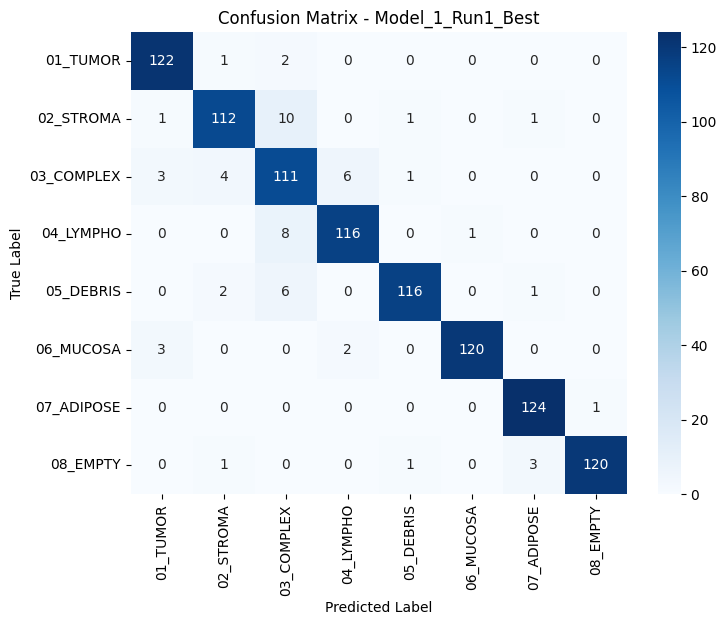


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_0_Model_1_Run1_Best.keras


========================= Training Ensemble Model 2/5: Model_2_Run2_Best =========================
Using 'advanced_v1' augmentation (Fixed Albumentations)
Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 33s 111ms/step - accuracy: 0.1937 - loss: 6.4203 - val_accuracy: 0.3470 - val_loss: 1.5953 - learning_rate: 8.6800e-05
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 89ms/step - accuracy: 0.3414 - loss: 2.0308 - val_accuracy: 0.3690 - val_loss: 1.4204 - learning_rate: 8.6800e-05
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.3822 - loss: 1.8436 - val_accuracy: 0.4090 - val_loss: 1.3625 - learning_rate: 8.6800e-05
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.3804 - loss: 1.7697 - val_accuracy: 0.4860 - val_loss: 1.2290 - learning_rate: 8.6800e-05
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 22s 87ms/step - accuracy: 0.4684 - loss: 1.5494 - val_accuracy: 0.6010 -

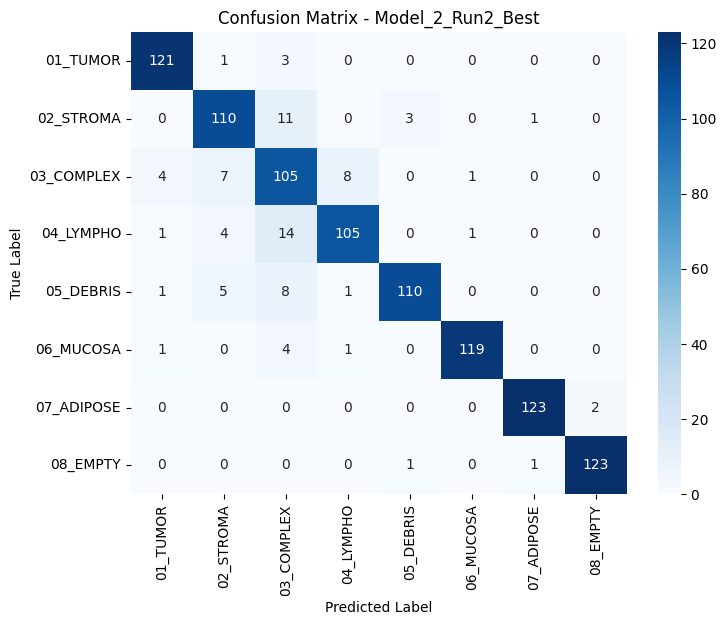


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_1_Model_2_Run2_Best.keras


========================= Training Ensemble Model 3/5: Model_3_Run3_Best =========================
Using 'advanced_v2' augmentation (Dynamic Albumentations)
Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.2546 - loss: 6.3114 - val_accuracy: 0.5850 - val_loss: 1.4999 - learning_rate: 5.1700e-05
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.5446 - loss: 1.9750 - val_accuracy: 0.7080 - val_loss: 1.2755 - learning_rate: 5.1700e-05
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.6752 - loss: 1.7093 - val_accuracy: 0.7650 - val_loss: 1.1906 - learning_rate: 5.1700e-05
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.7219 - loss: 1.6145 - val_accuracy: 0.7870 - val_loss: 1.1211 - learning_rate: 5.1700e-05
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.7864 - loss: 1.4837 - val_accuracy: 0.8250 

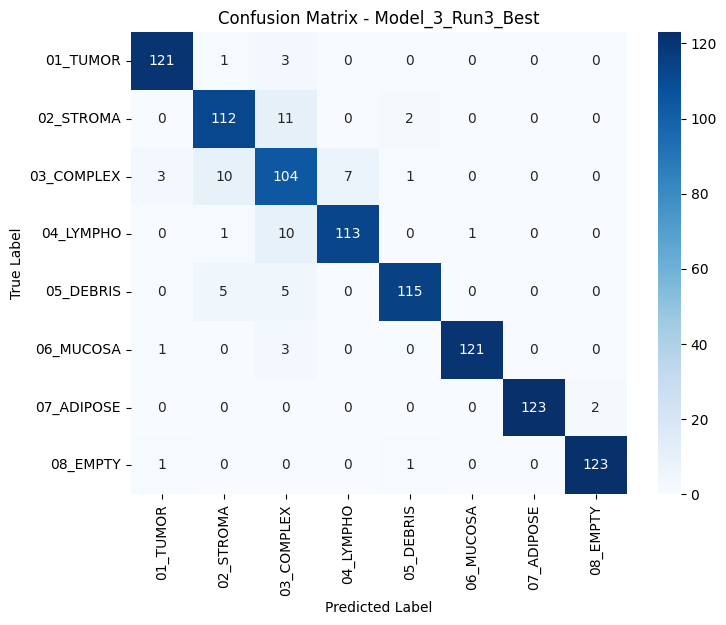


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_2_Model_3_Run3_Best.keras


========================= Training Ensemble Model 4/5: Model_4_Run3_Second =========================
Using 'advanced_v2' augmentation (Dynamic Albumentations)
Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - accuracy: 0.2073 - loss: 7.1390 - val_accuracy: 0.4360 - val_loss: 1.6128 - learning_rate: 4.0200e-05
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step - accuracy: 0.4759 - loss: 2.0509 - val_accuracy: 0.6980 - val_loss: 1.3023 - learning_rate: 4.0200e-05
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.6581 - loss: 1.7651 - val_accuracy: 0.7680 - val_loss: 1.1689 - learning_rate: 4.0200e-05
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.7007 - loss: 1.6470 - val_accuracy: 0.7810 - val_loss: 1.1019 - learning_rate: 4.0200e-05
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.7606 - loss: 1.5240 - val_accuracy: 0.766

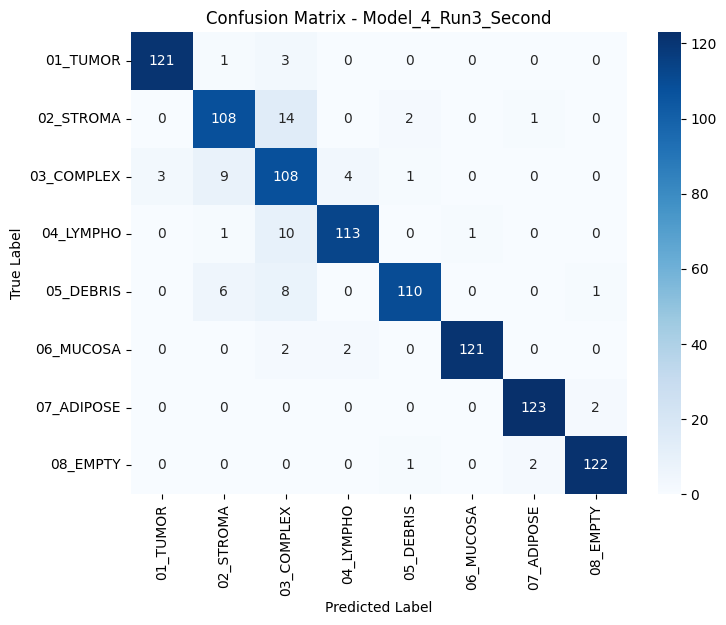


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_3_Model_4_Run3_Second.keras


========================= Training Ensemble Model 5/5: Model_5_Run3_Third =========================
Using 'advanced_v2' augmentation (Dynamic Albumentations)
Epoch 1/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step - accuracy: 0.1788 - loss: 7.0515 - val_accuracy: 0.3840 - val_loss: 1.7568 - learning_rate: 2.7900e-05
Epoch 2/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.3591 - loss: 2.0841 - val_accuracy: 0.5390 - val_loss: 1.4760 - learning_rate: 2.7900e-05
Epoch 3/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 50ms/step - accuracy: 0.5074 - loss: 1.8066 - val_accuracy: 0.6530 - val_loss: 1.3229 - learning_rate: 2.7900e-05
Epoch 4/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.6280 - loss: 1.6122 - val_accuracy: 0.6840 - val_loss: 1.3003 - learning_rate: 2.7900e-05
Epoch 5/100
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.6643 - loss: 1.5518 - val_accuracy: 0.76

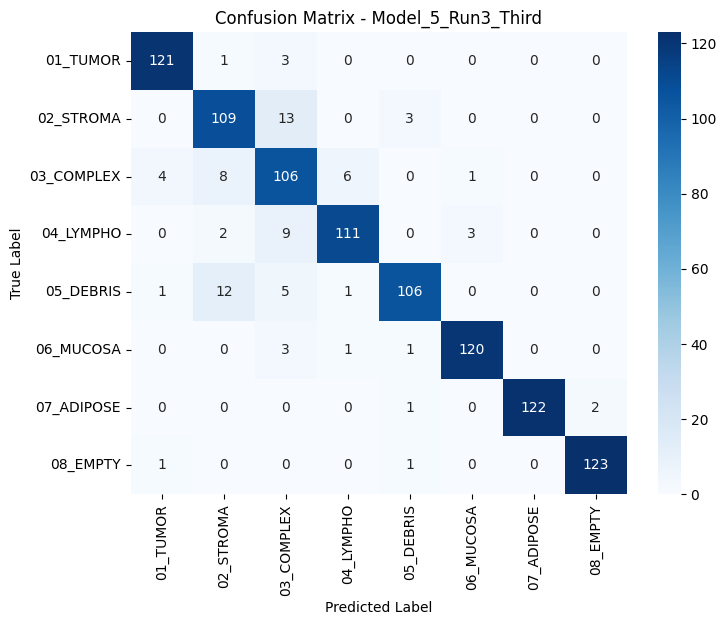


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_4_Model_5_Run3_Third.keras


In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'
os.makedirs(ensemble_dir, exist_ok=True)
input_shape = (150, 150, 3)
all_histories = {}

for i, recipe in enumerate(ensemble_recipes):
    print(f"\n\n{'='*25} Training Ensemble Model {i+1}/5: {recipe['name']} {'='*25}")

    params = recipe['params']

    tf.keras.utils.set_random_seed(42 + i)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False
    if params.get('num_unfreeze_layers', 0) > 0:
        for layer in base_model.layers[-params['num_unfreeze_layers']:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    x = Dense(params['hidden_units_1'], activation=params['activation'])(x)
    x = Dropout(params['dropout_rate_1'])(x)
    if params.get('num_hidden_layers', 1) == 2:
        x = Dense(params['hidden_units_2'], activation='relu')(x)
        x = Dropout(params.get('dropout_rate_2', 0.5))(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    if params.get('optimizer') == 'Adam':
        optimizer = Adam(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))
    else:
        optimizer = AdamW(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, min_lr=1e-7)

    keras_simple_datagen = ImageDataGenerator(
            rotation_range=20, width_shift_range=0.2, height_shift_range=0.2,
            shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest',
            preprocessing_function=preprocess_input
        )

    if recipe['augmentation_type'] == 'simple':
        print("Using 'simple' augmentation (Keras ImageDataGenerator)")
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        train_generator = keras_simple_datagen.flow(X_train_img_uint8, y_train_enc, batch_size=params['batch_size'])
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_enc)

    elif recipe['augmentation_type'] == 'advanced_v1':
        print("Using 'advanced_v1' augmentation (Fixed Albumentations)")
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=params.get('label_smoothing', 0.0))
        model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])
        active_pipeline = advanced_v1_aug_pipeline
        sample_weights = np.array([params.get('problem_class_weight', 1.0) if y in [np.where(le.classes_ == '02_STROMA')[0][0], np.where(le.classes_ == '03_COMPLEX')[0][0]] else 1.0 for y in y_train_enc])
        train_generator = albumentations_generator_with_weights(X_train_img_uint8, y_train_one_hot, sample_weights, params['batch_size'], active_pipeline)
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_one_hot)

    else:
        print("Using 'advanced_v2' augmentation (Dynamic Albumentations)")
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=params.get('label_smoothing', 0.0))
        model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])
        active_pipeline = create_dynamic_advanced_v2_pipeline(params)
        sample_weights = np.array([params.get('problem_class_weight', 1.0) if y in [np.where(le.classes_ == '02_STROMA')[0][0], np.where(le.classes_ == '03_COMPLEX')[0][0]] else 1.0 for y in y_train_enc])
        train_generator = albumentations_generator_with_weights(X_train_img_uint8, y_train_one_hot, sample_weights, params['batch_size'], active_pipeline)
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_one_hot)

    steps_per_epoch = len(X_train_img_uint8) // params['batch_size']
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=100,
        validation_data=validation_data,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    all_histories[recipe['name']] = history

    print(f"\n--- PERFORMANCE REPORT FOR: {recipe['name']} ---")
    y_pred_probs = model.predict(preprocess_input(X_test_img_uint8.copy()))
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred_labels, target_names=le.classes_))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test_enc, y_pred_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f'Confusion Matrix - {recipe["name"]}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    model_path = os.path.join(ensemble_dir, f"model_{i}_{recipe['name']}.keras")
    model.save(model_path)
    print(f"\nModel saved to {model_path}")

Found 5 models to ensemble. Loading...
All models loaded successfully.

--- Generating predictions from each ensemble model ---
Predicting with model 1...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
Predicting with model 2...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
Predicting with model 3...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step
Predicting with model 4...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step
Predicting with model 5...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

Averaging predictions...


--- FINAL ENSEMBLE PERFORMANCE REPORT ---
Final Ensemble F1 Score (Macro): 0.9383

1. Ensemble Classification Report:
              precision    recall  f1-score   support

    01_TUMOR       0.98      0.97      0.97       125
   02_STROMA       0.91      0.89      0.90       125
  03_COMPLEX       0.76      0.89      0.82       125
   04_LYMPHO       0.93      0.90      0.91       125
   05_DEBRIS       0.98      0.92      0.95       125
   06_MUCOSA       0.99      0.97      0.98       125
  07_ADIPOSE

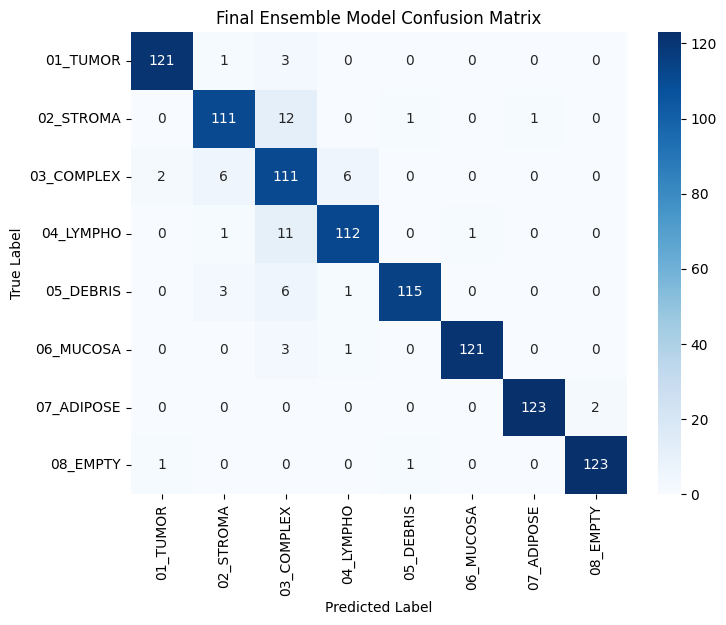

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'

model_files = sorted([f for f in os.listdir(ensemble_dir) if f.endswith('.keras')])
model_paths = [os.path.join(ensemble_dir, f) for f in model_files]

if not model_paths:
    print("Error: No saved models found in the directory. Please run the training loop first.")
else:
    print(f"Found {len(model_paths)} models to ensemble. Loading...")
    loaded_models = [load_model(path) for path in model_paths]
    print("All models loaded successfully.")

    preprocessed_test_images = preprocess_input(X_test_img_uint8.copy())

    all_predictions = []
    print("\n--- Generating predictions from each ensemble model ---")
    for i, model in enumerate(loaded_models):
        print(f"Predicting with model {i+1}...")
        y_pred_probs = model.predict(preprocessed_test_images)
        all_predictions.append(y_pred_probs)

    print("\nAveraging predictions...")
    ensembled_probs = np.mean(all_predictions, axis=0)
    ensembled_labels = np.argmax(ensembled_probs, axis=1)

    print("\n\n--- FINAL ENSEMBLE PERFORMANCE REPORT ---")

    final_f1_score = f1_score(y_test_enc, ensembled_labels, average='macro')
    print(f"Final Ensemble F1 Score (Macro): {final_f1_score:.4f}")

    print("\n1. Ensemble Classification Report:")
    print(classification_report(y_test_enc, ensembled_labels, target_names=le.classes_))

    print("\n2. Ensemble Confusion Matrix:")
    cm = confusion_matrix(y_test_enc, ensembled_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title('Final Ensemble Model Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Third Optuna Trial - Strategy Battle

After running the Ensemble model and still getting the same issues with classes 2, 3 and 4 - We'll try a different approach. Letting Optuna to choose between 3 approaches:

1. The current "champion" approach - giving optuna a chance to select the simple approach which got the 0.95 F1 Score.
2. Focal Loss - A loss function which alters the weights on certain pictures that the model is having trouble with.
3. Focused Augmentation - taking the 2, 3 and 4 classes and applying radical augmentation on them, trying to make the model recognize the minor differences between them.

In [ ]:
pio.renderers.default = "colab"

In [ ]:
le = LabelEncoder()
y_train_enc = le.fit_transform(train_df['label'])
y_test_enc = le.transform(test_df['label'])
num_classes = len(le.classes_)

y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

In [ ]:
def focal_loss_for_one_hot(gamma=2.0, alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * K.log(y_pred)
        loss = alpha * K.pow(1 - y_pred, gamma) * cross_entropy
        return K.sum(loss, axis=1)
    return focal_loss_fixed

regular_aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=25, p=0.7),
    A.ColorJitter(brightness=0.25, contrast=0.25, p=0.8)
])

heavy_aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=35, p=0.8),
    A.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, p=0.8),
    A.ElasticTransform(p=0.6, alpha=120, sigma=120 * 0.05),
    A.GridDistortion(p=0.6),
    A.GaussNoise(p=0.3),
])

def advanced_generator(X_data, y_one_hot_data, batch_size, strategy, problem_indices):
    indices = np.arange(len(X_data))
    while True:
        np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i : i + batch_size]
            if len(batch_indices) != batch_size:
                continue

            batch_x, batch_y = [], []
            for idx in batch_indices:
                image = X_data[idx]
                label_int = np.argmax(y_one_hot_data[idx])

                if strategy == 'targeted_augmentations' and label_int in problem_indices:
                    augmented = heavy_aug_pipeline(image=image.astype(np.uint8))
                else:
                    augmented = regular_aug_pipeline(image=image.astype(np.uint8))

                augmented_image = augmented['image']
                batch_x.append(augmented_image)
                batch_y.append(y_one_hot_data[idx])

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), np.array(batch_y)

In [ ]:
def objective_strategy_selection(trial):
    input_shape = (150, 150, 3)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False

    num_unfreeze = trial.suggest_categorical('num_unfreeze_layers', [4, 6])
    if num_unfreeze > 0:
        for layer in base_model.layers[-num_unfreeze:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    x = Dense(trial.suggest_categorical('hidden_units', [1024, 1536]), activation='relu')(x)
    x = Dropout(trial.suggest_float('dropout_rate', 0.3, 0.6))(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    optimizer = AdamW(learning_rate=trial.suggest_float('learning_rate', 2e-5, 2e-4, log=True))

    strategy = trial.suggest_categorical('strategy', ['crossentropy', 'focal_loss', 'targeted_augmentations'])

    if strategy == 'focal_loss':
        gamma = trial.suggest_float('focal_loss_gamma', 1.5, 3.0)
        loss_function = focal_loss_for_one_hot(gamma=gamma, alpha=0.25)
    else:
        smoothing_value = trial.suggest_float('label_smoothing', 0.0, 0.2)
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=smoothing_value)

    model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])

    problem_indices = [np.where(le.classes_ == '02_STROMA')[0][0], np.where(le.classes_ == '03_COMPLEX')[0][0], np.where(le.classes_ == '04_LYMPHO')[0][0]]
    batch_size = trial.suggest_categorical('batch_size', [16, 32])
    train_generator = advanced_generator(X_train_img_uint8, y_train_one_hot, batch_size, strategy, problem_indices)

    steps_per_epoch = len(X_train_img_uint8) // batch_size
    early_stopping = EarlyStopping(monitor='val_loss', patience=12, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, min_lr=1e-7)

    model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=100,
        validation_data=(preprocess_input(X_test_img_uint8.copy()), y_test_one_hot),
        callbacks=[early_stopping, lr_scheduler],
        verbose=0
    )

    y_pred_probs = model.predict(preprocess_input(X_test_img_uint8.copy()))
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    f1 = f1_score(y_test_enc, y_pred_labels, average='macro')
    cm = confusion_matrix(y_test_enc, y_pred_labels)

    print(f"\n--- Trial {trial.number} Finished ---")
    print(f"Strategy: {strategy}, F1 Score: {f1:.4f}")
    print("Confusion Matrix:")
    print(cm)

    report = classification_report(y_test_enc, y_pred_labels, target_names=['C2', 'C3', 'C4'], labels=problem_indices, output_dict=True)
    trial.set_user_attr("recall_class_2", report['C2']['recall'])
    trial.set_user_attr("recall_class_3", report['C3']['recall'])
    trial.set_user_attr("recall_class_4", report['C4']['recall'])

    return f1

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/Colab_Checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
sampler = optuna.samplers.TPESampler(n_startup_trials=20)

study_name = "strategy-selection-v1"
db_path = f"sqlite:///{checkpoint_dir}/kather_finetuning.db"

study = optuna.create_study(
    direction='maximize',
    storage=db_path,
    study_name=study_name,
    sampler=sampler,
    load_if_exists=True
)

print(f"Starting new study: '{study_name}'. Number of past trials: {len(study.trials)}")
study.optimize(objective_strategy_selection, n_trials=60)

[I 2025-06-28 18:43:46,599] Using an existing study with name 'strategy-selection-v1' instead of creating a new one.


Starting new study: 'strategy-selection-v1'. Number of past trials: 13
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step


[I 2025-06-28 18:47:05,067] Trial 13 finished with value: 0.9276725589251653 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4129848136572558, 'learning_rate': 2.6216029439286293e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.007585475146440613, 'batch_size': 16}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 13 Finished ---
Strategy: crossentropy, F1 Score: 0.9277
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  0 106  14   1   3   0   1   0]
 [  2   8 105   8   2   0   0   0]
 [  1   0   8 116   0   0   0   0]
 [  1   4   4   1 115   0   0   0]
 [  2   0   1   3   0 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   1 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 18:50:17,716] Trial 14 finished with value: 0.8832449639895085 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.5659570356456284, 'learning_rate': 2.9993478356335658e-05, 'strategy': 'focal_loss', 'focal_loss_gamma': 2.7983167611901685, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 14 Finished ---
Strategy: focal_loss, F1 Score: 0.8832
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  0 100  11   0  13   1   0   0]
 [  4  15  96   7   2   1   0   0]
 [  0   0  21 103   0   1   0   0]
 [  2  11   5   1 104   0   2   0]
 [  2   0   4   3   0 116   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   4 120]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 19:00:30,006] Trial 15 finished with value: 0.9282690256886741 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4400272271916277, 'learning_rate': 3.450647775358134e-05, 'strategy': 'targeted_augmentations', 'label_smoothing': 0.14675737200980107, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 15 Finished ---
Strategy: targeted_augmentations, F1 Score: 0.9283
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  0 105  14   0   5   0   1   0]
 [  4   6 106   7   0   2   0   0]
 [  0   1   6 114   0   4   0   0]
 [  0   4   3   1 117   0   0   0]
 [  1   0   1   3   0 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 19:05:10,866] Trial 16 finished with value: 0.9124924256813166 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1536, 'dropout_rate': 0.41163683607360807, 'learning_rate': 3.8767053473958995e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.1922059834158374, 'batch_size': 16}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 16 Finished ---
Strategy: crossentropy, F1 Score: 0.9125
Confusion Matrix:
[[115   0   8   0   2   0   0   0]
 [  1 105  15   0   4   0   0   0]
 [  3  10 105   5   1   1   0   0]
 [  0   0  15 110   0   0   0   0]
 [  0   6   7   0 112   0   0   0]
 [  1   0   4   0   1 119   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-28 19:19:21,123] Trial 17 finished with value: 0.9053294104157634 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.5837397761117096, 'learning_rate': 6.998174795929723e-05, 'strategy': 'targeted_augmentations', 'label_smoothing': 0.19127676594193532, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 17 Finished ---
Strategy: targeted_augmentations, F1 Score: 0.9053
Confusion Matrix:
[[120   0   3   1   1   0   0   0]
 [  2 100  11   0  12   0   0   0]
 [  9   9  98   6   2   1   0   0]
 [  0   0  11 111   0   3   0   0]
 [  0   3   8   0 114   0   0   0]
 [  0   0   2   3   1 119   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   2   0   2 121]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-28 19:22:34,221] Trial 18 finished with value: 0.918447502139732 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.35309245707557335, 'learning_rate': 7.426040985427133e-05, 'strategy': 'focal_loss', 'focal_loss_gamma': 1.5278769435920079, 'batch_size': 16}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 18 Finished ---
Strategy: focal_loss, F1 Score: 0.9184
Confusion Matrix:
[[119   0   5   0   1   0   0   0]
 [  0 110  10   0   4   0   1   0]
 [  3   6 101  12   2   1   0   0]
 [  0   0   9 115   0   1   0   0]
 [  1  11   4   1 107   0   1   0]
 [  0   0   2   2   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   1   0   0   0   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-28 19:25:41,427] Trial 19 finished with value: 0.9162672394224614 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1024, 'dropout_rate': 0.408012484315769, 'learning_rate': 3.4870220769274054e-05, 'strategy': 'focal_loss', 'focal_loss_gamma': 1.7595681467892867, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 19 Finished ---
Strategy: focal_loss, F1 Score: 0.9163
Confusion Matrix:
[[117   1   6   0   0   1   0   0]
 [  0 109  10   0   5   1   0   0]
 [  4  15  92   9   3   2   0   0]
 [  0   0  10 115   0   0   0   0]
 [  0   3   4   1 117   0   0   0]
 [  0   0   4   0   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 19:35:21,685] Trial 20 finished with value: 0.902541375227586 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.5227606866418459, 'learning_rate': 3.979810621636429e-05, 'strategy': 'targeted_augmentations', 'label_smoothing': 0.04542910478190068, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 20 Finished ---
Strategy: targeted_augmentations, F1 Score: 0.9025
Confusion Matrix:
[[121   0   4   0   0   0   0   0]
 [  1 101  14   0   9   0   0   0]
 [  8   6 101   4   3   3   0   0]
 [  2   0  14 103   0   6   0   0]
 [  0   6   5   1 112   0   1   0]
 [  0   0   4   1   1 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   0   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 19:40:19,998] Trial 21 finished with value: 0.8822471383834163 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4948921960768925, 'learning_rate': 2.0136047505184104e-05, 'strategy': 'targeted_augmentations', 'label_smoothing': 0.003831504455656387, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 21 Finished ---
Strategy: targeted_augmentations, F1 Score: 0.8822
Confusion Matrix:
[[118   0   5   0   2   0   0   0]
 [  1  99  11   0  12   2   0   0]
 [ 12   9  88  10   3   3   0   0]
 [  0   1  20 100   0   4   0   0]
 [  0   7   7   0 111   0   0   0]
 [  1   0   3   0   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   1   0   0   1   0   1 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-28 19:43:30,874] Trial 22 finished with value: 0.8813978838196791 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.5312528005003615, 'learning_rate': 5.718526064917533e-05, 'strategy': 'focal_loss', 'focal_loss_gamma': 2.691681605791961, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 22 Finished ---
Strategy: focal_loss, F1 Score: 0.8814
Confusion Matrix:
[[119   1   5   0   0   0   0   0]
 [  1  99  11   0  13   1   0   0]
 [  6  15  87  12   3   2   0   0]
 [  0   0  21 102   0   2   0   0]
 [  0   8   4   0 113   0   0   0]
 [  3   0   3   1   1 117   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   0   0   3 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 19:50:16,980] Trial 23 finished with value: 0.8955764025451709 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.5555254399003426, 'learning_rate': 0.00018892276337177313, 'strategy': 'targeted_augmentations', 'label_smoothing': 0.08553976969602274, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 23 Finished ---
Strategy: targeted_augmentations, F1 Score: 0.8956
Confusion Matrix:
[[117   1   4   2   0   1   0   0]
 [  0 102  12   0  10   0   1   0]
 [  9  12  87  11   4   2   0   0]
 [  0   2  14 109   0   0   0   0]
 [  0   3   4   0 118   0   0   0]
 [  2   0   1   4   0 118   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 19:55:02,060] Trial 24 finished with value: 0.9283044167028159 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4390499327324467, 'learning_rate': 0.00010527953179835921, 'strategy': 'crossentropy', 'label_smoothing': 0.05262924055387156, 'batch_size': 32}. Best is trial 3 with value: 0.9300633590574858.



--- Trial 24 Finished ---
Strategy: crossentropy, F1 Score: 0.9283
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  1 106  12   1   3   1   1   0]
 [  2   8 103  10   2   0   0   0]
 [  0   2   6 117   0   0   0   0]
 [  0   3   4   1 116   0   1   0]
 [  0   0   2   2   1 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   2   0   1 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 19:59:02,375] Trial 25 finished with value: 0.9302489314689308 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.43675621588709884, 'learning_rate': 0.00010836634444352179, 'strategy': 'crossentropy', 'label_smoothing': 0.06181020528802114, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 25 Finished ---
Strategy: crossentropy, F1 Score: 0.9302
Confusion Matrix:
[[120   1   3   0   0   1   0   0]
 [  1 108  10   0   5   0   1   0]
 [  2   9 104   8   1   1   0   0]
 [  0   1   6 118   0   0   0   0]
 [  0   4   3   1 116   0   1   0]
 [  2   0   3   2   0 118   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   2   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:04:08,827] Trial 26 finished with value: 0.9252529479404143 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4854630495775795, 'learning_rate': 0.00010357849151020556, 'strategy': 'crossentropy', 'label_smoothing': 0.0647016658717881, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 26 Finished ---
Strategy: crossentropy, F1 Score: 0.9253
Confusion Matrix:
[[122   1   2   0   0   0   0   0]
 [  1 109  11   1   2   0   1   0]
 [  4  10  99   9   2   1   0   0]
 [  1   1   7 116   0   0   0   0]
 [  0   6   4   0 115   0   0   0]
 [  1   0   3   2   0 119   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   2   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:07:44,623] Trial 27 finished with value: 0.9298930679116113 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.3132321380588048, 'learning_rate': 9.821909490170306e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.04743005799507688, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 27 Finished ---
Strategy: crossentropy, F1 Score: 0.9299
Confusion Matrix:
[[119   0   5   0   1   0   0   0]
 [  0 110  12   0   2   0   1   0]
 [  3   7 108   5   1   1   0   0]
 [  0   2   9 111   0   3   0   0]
 [  0   3   5   1 116   0   0   0]
 [  2   0   2   2   0 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   1 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:12:23,553] Trial 28 finished with value: 0.9196816045470091 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.3066669961882724, 'learning_rate': 0.0001721594331608785, 'strategy': 'crossentropy', 'label_smoothing': 0.03481926656280904, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 28 Finished ---
Strategy: crossentropy, F1 Score: 0.9197
Confusion Matrix:
[[118   1   6   0   0   0   0   0]
 [  0 108  13   0   3   0   1   0]
 [  4   6 103   9   2   1   0   0]
 [  0   0   7 117   0   1   0   0]
 [  0   9   6   1 108   0   0   1]
 [  1   0   1   2   1 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   1 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 20:16:36,903] Trial 29 finished with value: 0.9265541637469588 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.3118904208432711, 'learning_rate': 9.290008453541295e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.0721441925012876, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 29 Finished ---
Strategy: crossentropy, F1 Score: 0.9266
Confusion Matrix:
[[119   1   5   0   0   0   0   0]
 [  1 108  11   1   3   0   1   0]
 [  2   7 105   9   1   1   0   0]
 [  0   1   7 113   0   4   0   0]
 [  0   5   5   0 114   0   1   0]
 [  0   0   2   2   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:22:39,444] Trial 30 finished with value: 0.9241036455039977 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.3676463046254532, 'learning_rate': 0.00014001916456623782, 'strategy': 'crossentropy', 'label_smoothing': 0.10905891052014105, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 30 Finished ---
Strategy: crossentropy, F1 Score: 0.9241
Confusion Matrix:
[[118   1   5   1   0   0   0   0]
 [  0 106  17   0   1   1   0   0]
 [  5   5 110   4   1   0   0   0]
 [  1   0  12 110   0   2   0   0]
 [  0   4   7   0 113   0   0   1]
 [  1   0   5   0   0 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 20:26:41,978] Trial 31 finished with value: 0.9214062198531505 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1536, 'dropout_rate': 0.3349231964491776, 'learning_rate': 9.181546864088e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.036605145299715515, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 31 Finished ---
Strategy: crossentropy, F1 Score: 0.9214
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  0 108  14   1   2   0   0   0]
 [  6  11  98   6   4   0   0   0]
 [  0   1   9 113   0   2   0   0]
 [  0   4   3   1 117   0   0   0]
 [  0   0   2   2   1 120   0   0]
 [  0   0   0   0   2   0 121   2]
 [  0   0   0   0   1   0   1 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:30:15,145] Trial 32 finished with value: 0.922610719437563 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.5038499197219851, 'learning_rate': 0.00013368934084080427, 'strategy': 'crossentropy', 'label_smoothing': 0.07286924622825607, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 32 Finished ---
Strategy: crossentropy, F1 Score: 0.9226
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  1 107  12   1   2   2   0   0]
 [  4   9 105   4   1   2   0   0]
 [  1   0   8 114   0   2   0   0]
 [  0   8   4   0 113   0   0   0]
 [  2   0   3   1   1 118   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   0   0   3 121]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:34:08,120] Trial 33 finished with value: 0.9210356836539145 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4749366471950313, 'learning_rate': 0.00015939302360523173, 'strategy': 'crossentropy', 'label_smoothing': 0.028619581103640976, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 33 Finished ---
Strategy: crossentropy, F1 Score: 0.9210
Confusion Matrix:
[[122   1   2   0   0   0   0   0]
 [  0 104  14   1   6   0   0   0]
 [  4  10 103   7   1   0   0   0]
 [  0   2   2 117   1   3   0   0]
 [  0   9   4   0 110   0   1   1]
 [  0   0   2   2   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   0   0   4 121]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 20:37:56,979] Trial 34 finished with value: 0.9297850119497936 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.45112198579129437, 'learning_rate': 0.00010303204104604437, 'strategy': 'crossentropy', 'label_smoothing': 0.05442264465852048, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 34 Finished ---
Strategy: crossentropy, F1 Score: 0.9298
Confusion Matrix:
[[121   0   4   0   0   0   0   0]
 [  1 109  12   1   2   0   0   0]
 [  2   4 106  10   3   0   0   0]
 [  1   0   9 113   0   2   0   0]
 [  0   6   5   0 114   0   0   0]
 [  1   0   2   2   0 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   0   0   1 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:42:07,929] Trial 35 finished with value: 0.9297070234976699 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.5473892135302378, 'learning_rate': 0.00010603151536371983, 'strategy': 'crossentropy', 'label_smoothing': 0.05957938556461451, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 35 Finished ---
Strategy: crossentropy, F1 Score: 0.9297
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  0 106  13   1   5   0   0   0]
 [  3  10 103   7   0   2   0   0]
 [  0   0  10 115   0   0   0   0]
 [  0   2   5   0 118   0   0   0]
 [  0   0   2   1   0 122   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   2   0   1 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:45:35,667] Trial 36 finished with value: 0.9230527158291614 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4630746994852495, 'learning_rate': 8.870155784895203e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.08372018848980915, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 36 Finished ---
Strategy: crossentropy, F1 Score: 0.9231
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  0 109  11   0   4   1   0   0]
 [  2  11 103   9   0   0   0   0]
 [  1   0  12 112   0   0   0   0]
 [  0   6   4   1 114   0   0   0]
 [  1   0   4   2   1 117   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   0   0   1 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step


[I 2025-06-28 20:48:55,744] Trial 37 finished with value: 0.9138339184395234 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.3882812938352277, 'learning_rate': 5.148624039835121e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.05168690651685524, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 37 Finished ---
Strategy: crossentropy, F1 Score: 0.9138
Confusion Matrix:
[[119   1   5   0   0   0   0   0]
 [  1 105  14   1   4   0   0   0]
 [  3  13  99   9   1   0   0   0]
 [  1   0   7 116   0   1   0   0]
 [  0   6   4   2 113   0   0   0]
 [  1   0   4   2   1 117   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   2 121]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 20:52:52,528] Trial 38 finished with value: 0.9227291569996743 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.5972528509990929, 'learning_rate': 0.00011892940115520239, 'strategy': 'crossentropy', 'label_smoothing': 0.025828890079029804, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 38 Finished ---
Strategy: crossentropy, F1 Score: 0.9227
Confusion Matrix:
[[120   1   2   1   1   0   0   0]
 [  1 107  14   0   3   0   0   0]
 [  3   8 101   7   4   2   0   0]
 [  0   0  11 113   0   1   0   0]
 [  0   4   5   0 115   0   0   1]
 [  0   0   3   1   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 20:56:27,969] Trial 39 finished with value: 0.9191824061297318 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1024, 'dropout_rate': 0.5091434355964464, 'learning_rate': 0.0001463174014635784, 'strategy': 'crossentropy', 'label_smoothing': 0.07229051248927758, 'batch_size': 32}. Best is trial 25 with value: 0.9302489314689308.



--- Trial 39 Finished ---
Strategy: crossentropy, F1 Score: 0.9192
Confusion Matrix:
[[119   1   4   0   1   0   0   0]
 [  0 105  16   0   3   0   1   0]
 [  2   9 102   9   2   1   0   0]
 [  0   0  10 114   0   1   0   0]
 [  0   3   5   1 114   0   1   1]
 [  0   0   4   2   2 117   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   0 124]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 21:01:38,464] Trial 40 finished with value: 0.9320894550792104 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4241833597993397, 'learning_rate': 8.525784456897133e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.04425494877897812, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 40 Finished ---
Strategy: crossentropy, F1 Score: 0.9321
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  1 109  14   0   1   0   0   0]
 [  4   5 106   6   2   2   0   0]
 [  0   0  10 115   0   0   0   0]
 [  0   3   5   0 117   0   0   0]
 [  1   0   2   2   0 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   1   0   0   1   0   2 121]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 21:06:18,939] Trial 41 finished with value: 0.9265962020960496 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.393700973014799, 'learning_rate': 8.240232940280923e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.08613780102205269, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 41 Finished ---
Strategy: crossentropy, F1 Score: 0.9266
Confusion Matrix:
[[119   2   4   0   0   0   0   0]
 [  0 107  11   0   6   0   1   0]
 [  2   9 104   8   1   1   0   0]
 [  0   0   9 116   0   0   0   0]
 [  0   6   4   1 113   0   1   0]
 [  0   0   2   0   1 122   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   0   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 21:09:26,410] Trial 42 finished with value: 0.92115396407071 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.42926088985596206, 'learning_rate': 0.00011920872041473491, 'strategy': 'crossentropy', 'label_smoothing': 0.09560309645110768, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 42 Finished ---
Strategy: crossentropy, F1 Score: 0.9212
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  0 105  15   0   3   1   1   0]
 [  4   9 106   4   1   1   0   0]
 [  1   1  10 111   0   2   0   0]
 [  0   5   6   0 113   0   0   1]
 [  1   0   3   2   0 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   2   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step


[I 2025-06-28 21:14:13,789] Trial 43 finished with value: 0.929765259420619 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1024, 'dropout_rate': 0.3694049136022173, 'learning_rate': 8.01973186188055e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.04223061237683841, 'batch_size': 16}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 43 Finished ---
Strategy: crossentropy, F1 Score: 0.9298
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  1 108  12   0   2   2   0   0]
 [  4   6 108   6   1   0   0   0]
 [  0   1  10 112   0   2   0   0]
 [  0   7   3   1 114   0   0   0]
 [  0   0   2   2   1 120   0   0]
 [  0   0   0   0   0   0 124   1]
 [  0   0   0   0   2   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step


[I 2025-06-28 21:17:51,453] Trial 44 finished with value: 0.9287435471584609 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.4552223827547483, 'learning_rate': 0.0001001942619322482, 'strategy': 'crossentropy', 'label_smoothing': 0.05781110271357297, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 44 Finished ---
Strategy: crossentropy, F1 Score: 0.9287
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  1 110  11   0   2   1   0   0]
 [  3   8 104   8   1   1   0   0]
 [  0   2   9 113   0   1   0   0]
 [  0   4   5   0 116   0   0   0]
 [  2   0   2   1   1 119   0   0]
 [  0   0   0   0   0   0 123   2]
 [  1   0   0   0   1   0   0 123]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 21:21:21,452] Trial 45 finished with value: 0.9285700870954299 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.42422072680233597, 'learning_rate': 0.00011523506005057033, 'strategy': 'crossentropy', 'label_smoothing': 0.01914997941485652, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 45 Finished ---
Strategy: crossentropy, F1 Score: 0.9286
Confusion Matrix:
[[120   1   4   0   0   0   0   0]
 [  0 107  14   0   3   0   1   0]
 [  3  10 103   5   1   3   0   0]
 [  0   2   8 115   0   0   0   0]
 [  0   2   3   0 120   0   0   0]
 [  1   0   2   2   0 120   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   2   0   3 120]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step


[I 2025-06-28 21:25:00,976] Trial 46 finished with value: 0.9180561292531725 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.46909288304657165, 'learning_rate': 6.457912169035e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.04816220957837726, 'batch_size': 32}. Best is trial 40 with value: 0.9320894550792104.



--- Trial 46 Finished ---
Strategy: crossentropy, F1 Score: 0.9181
Confusion Matrix:
[[119   1   5   0   0   0   0   0]
 [  1 108  12   0   3   0   1   0]
 [  3  15  98   7   1   1   0   0]
 [  0   0  10 114   0   1   0   0]
 [  1   2   6   0 116   0   0   0]
 [  1   0   4   2   1 117   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   1   0   0   0   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step


[I 2025-06-28 21:29:11,865] Trial 47 finished with value: 0.932637692842007 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.446102114452589, 'learning_rate': 8.446024351997171e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.10605723435413633, 'batch_size': 32}. Best is trial 47 with value: 0.932637692842007.



--- Trial 47 Finished ---
Strategy: crossentropy, F1 Score: 0.9326
Confusion Matrix:
[[120   1   3   0   0   1   0   0]
 [  0 109  12   0   4   0   0   0]
 [  2  10 107   5   0   1   0   0]
 [  0   1   7 116   0   1   0   0]
 [  1   7   3   1 113   0   0   0]
 [  0   0   2   1   0 122   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 21:34:40,302] Trial 48 finished with value: 0.9346480657267866 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1536, 'dropout_rate': 0.44455182264109927, 'learning_rate': 8.907567154691608e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.12424078989143478, 'batch_size': 32}. Best is trial 48 with value: 0.9346480657267866.



--- Trial 48 Finished ---
Strategy: crossentropy, F1 Score: 0.9346
Confusion Matrix:
[[121   1   3   0   0   0   0   0]
 [  1 112   9   0   3   0   0   0]
 [  4   7 107   6   1   0   0   0]
 [  0   1  10 113   0   1   0   0]
 [  0   6   4   0 115   0   0   0]
 [  1   0   2   1   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   2 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


[I 2025-06-28 21:40:29,691] Trial 49 finished with value: 0.9224225307758784 and parameters: {'num_unfreeze_layers': 4, 'hidden_units': 1536, 'dropout_rate': 0.42340161942343524, 'learning_rate': 8.25264112586204e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.12298058058556695, 'batch_size': 16}. Best is trial 48 with value: 0.9346480657267866.



--- Trial 49 Finished ---
Strategy: crossentropy, F1 Score: 0.9224
Confusion Matrix:
[[120   0   4   0   1   0   0   0]
 [  0 110  10   0   5   0   0   0]
 [  3  11  99   6   5   1   0   0]
 [  1   1  10 112   0   1   0   0]
 [  0   2   4   1 117   0   1   0]
 [  0   0   3   2   0 120   0   0]
 [  0   0   0   0   1   0 122   2]
 [  0   0   0   0   0   0   3 122]]
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step


[I 2025-06-28 21:45:05,005] Trial 50 finished with value: 0.9326036773806532 and parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1024, 'dropout_rate': 0.44392564994874667, 'learning_rate': 7.028231807670932e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.12362948798316287, 'batch_size': 32}. Best is trial 48 with value: 0.9346480657267866.



--- Trial 50 Finished ---
Strategy: crossentropy, F1 Score: 0.9326
Confusion Matrix:
[[121   0   4   0   0   0   0   0]
 [  1 109  10   1   2   1   1   0]
 [  3   8 106   7   1   0   0   0]
 [  0   0   8 114   0   3   0   0]
 [  0   5   5   0 115   0   0   0]
 [  0   0   3   1   0 121   0   0]
 [  0   0   0   0   0   0 123   2]
 [  0   0   0   0   1   0   1 123]]


[W 2025-06-28 21:45:20,347] Trial 51 failed with parameters: {'num_unfreeze_layers': 6, 'hidden_units': 1024, 'dropout_rate': 0.44209934032751347, 'learning_rate': 5.386424506956946e-05, 'strategy': 'crossentropy', 'label_smoothing': 0.1285683602313824, 'batch_size': 32} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/optuna/study/_optimize.py", line 201, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "/tmp/ipython-input-21-3865429240.py", line 39, in objective_strategy_selection
    model.fit(
  File "/usr/local/lib/python3.11/dist-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
    return fn(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/trainer.py", line 371, in fit
    logs = self.train_function(iterator)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File 

KeyboardInterrupt: 

# Ensemble V2

Selecting specific models from this Optuna trial according to their success rate with the problematic classes, trying to patch them together to get the best out of all the classes.

In [ ]:
le = LabelEncoder()
y_train_enc = le.fit_transform(train_df['label'])
y_test_enc = le.transform(test_df['label'])
num_classes = len(le.classes_)

y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

In [ ]:
advanced_v1_aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=20, p=0.7),
    A.ColorJitter(brightness=0.2, contrast=0.2, p=0.8),
    A.ElasticTransform(p=0.5),
])

def create_dynamic_advanced_v2_pipeline(params):
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Rotate(limit=params['rotation_limit'], p=0.7),
        A.ColorJitter(brightness=params['color_jitter_strength'], contrast=params['color_jitter_strength'], p=0.8),
        A.ElasticTransform(p=params['elastic_transform_p'], alpha=120, sigma=120 * 0.05),
        A.GridDistortion(p=0.5),
        A.GaussNoise(p=0.2)
    ])

def albumentations_generator_with_weights(X_data, y_one_hot_data, sample_weights, batch_size, aug_pipeline):
    indices = np.arange(len(X_data))
    while True:
        np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i : i + batch_size]
            if len(batch_indices) != batch_size:
                continue

            batch_x, batch_y, batch_sw = [], [], []
            for idx in batch_indices:
                image = X_data[idx]
                augmented = aug_pipeline(image=image.astype(np.uint8))
                augmented_image = augmented['image']

                batch_x.append(augmented_image)
                batch_y.append(y_one_hot_data[idx])
                batch_sw.append(sample_weights[idx])

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), np.array(batch_y), np.array(batch_sw)

In [ ]:
ensemble_recipes = [
    {'name': 'Model_1_Run1_Best', 'params': {'num_unfreeze_layers': 7, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'relu', 'dropout_rate_1': 0.538519750977465, 'optimizer': 'AdamW', 'learning_rate': 5.47e-05, 'batch_size': 32, 'beta_1': 0.9, 'beta_2': 0.999}, 'augmentation_type': 'simple'},
    {
        'name': 'Model_2_Class_2_Specialist_(Trial_48)',
        'params': {
            'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536,
            'activation': 'relu', 'dropout_rate_1': 0.44455182264109927, 'optimizer': 'AdamW',
            'learning_rate': 8.907567e-05, 'batch_size': 32, 'label_smoothing': 0.12424078989143478
        },
        'augmentation_type': 'advanced_v1'
    },
    {
        'name': 'Model_3_Class_4_Specialist_(Trial_25)',
        'params': {
            'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536,
            'activation': 'relu', 'dropout_rate_1': 0.43675621588709884, 'optimizer': 'AdamW',
            'learning_rate': 1.0836634435218e-04, 'batch_size': 32, 'label_smoothing': 0.06181020528802114
        },
        'augmentation_type': 'advanced_v1'
    },
    {
        'name': 'Model_4_Class_3_Specialist_(Trial_30)',
        'params': {
            'num_unfreeze_layers': 6, 'num_hidden_layers': 1, 'hidden_units_1': 1536,
            'activation': 'relu', 'dropout_rate_1': 0.3676463046254532, 'optimizer': 'AdamW',
            'learning_rate': 1.4002e-04, 'batch_size': 32, 'label_smoothing': 0.10905891052014105
        },
        'augmentation_type': 'advanced_v1'
    }
]



========================= Training Ensemble Model 1/5: Model_1_Run1_Best =========================
Using 'simple' augmentation (Keras ImageDataGenerator)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 29s 175ms/step - accuracy: 0.2101 - loss: 7.4663 - val_accuracy: 0.5630 - val_loss: 1.1635 - learning_rate: 5.4700e-05
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - accuracy: 0.5506 - loss: 1.1670 - val_accuracy: 0.7850 - val_loss: 0.6229 - learning_rate: 5.4700e-05
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - accuracy: 0.7409 - loss: 0.7280 - val_accuracy: 0.8590 - val_loss: 0.4687 - learning_rate: 5.4700e-05
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - accuracy: 0.8225 - loss: 0.4958 - val_accuracy: 0.8700 - val_loss: 0.4014 - learning_rate: 5.4700e-05
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - accuracy: 0.8492 - loss: 0.4263 - val_accuracy: 0.8430 - val_loss: 0.4622 - learning_rate: 5.4700e-05
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - accuracy: 0.8702 - loss: 0.3728 - val_accuracy: 0.8850 - val_loss: 0.3243 - learning_rate: 5.4700e-05
Epoch 7/100
125/125 ━━━━━━━━━━━━━━━━━━━━

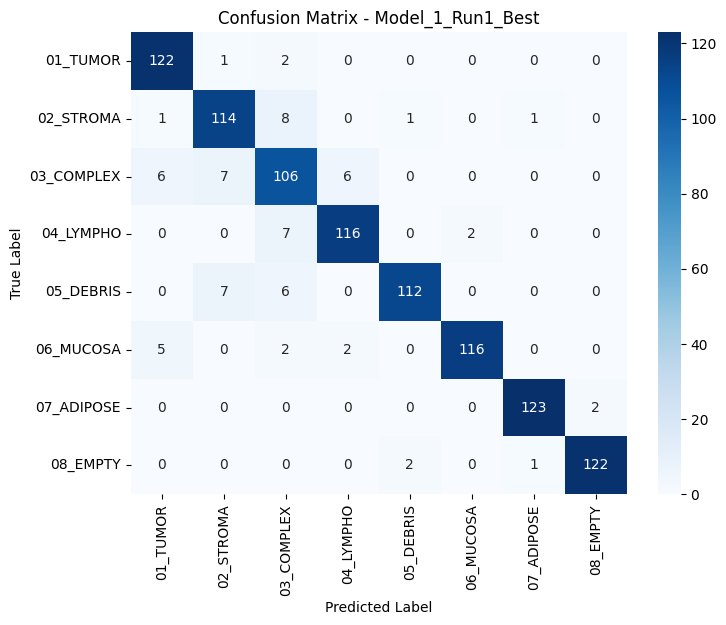


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_0_Model_1_Run1_Best.keras


========================= Training Ensemble Model 2/5: Model_2_Class_2_Specialist_(Trial_48) =========================
Using 'advanced_v1' augmentation (Fixed Albumentations)
Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.2417 - loss: 6.1507 - val_accuracy: 0.5220 - val_loss: 1.5020 - learning_rate: 8.9076e-05
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 180ms/step - accuracy: 0.5751 - loss: 1.4350 - val_accuracy: 0.7560 - val_loss: 1.1073 - learning_rate: 8.9076e-05
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - accuracy: 0.7279 - loss: 1.1417 - val_accuracy: 0.8040 - val_loss: 0.9964 - learning_rate: 8.9076e-05
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 176ms/step - accuracy: 0.8200 - loss: 0.9896 - val_accuracy: 0.8380 - val_loss: 0.9131 - learning_rate: 8.9076e-05
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - accuracy: 0.8478 - loss: 0.9133 

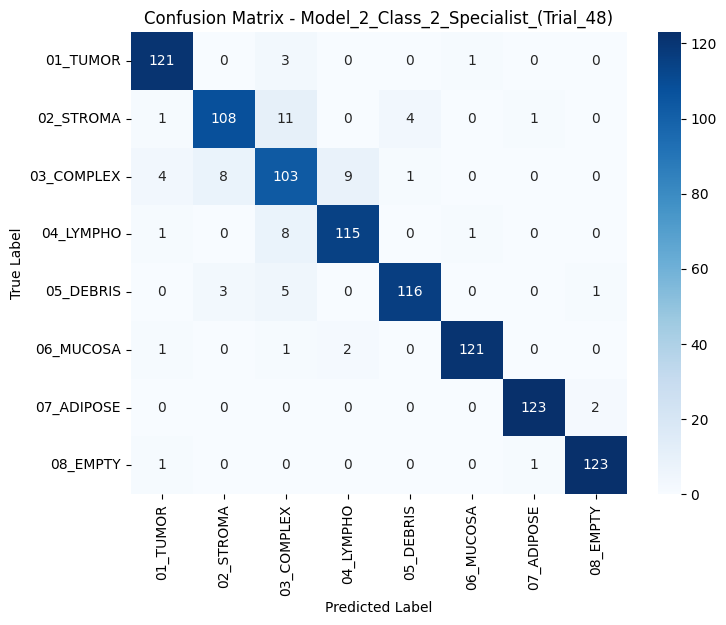


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_1_Model_2_Class_2_Specialist_(Trial_48).keras


========================= Training Ensemble Model 3/5: Model_3_Class_4_Specialist_(Trial_25) =========================
Using 'advanced_v1' augmentation (Fixed Albumentations)
Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 29s 191ms/step - accuracy: 0.2887 - loss: 5.8570 - val_accuracy: 0.5590 - val_loss: 1.2885 - learning_rate: 1.0837e-04
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - accuracy: 0.5839 - loss: 1.2767 - val_accuracy: 0.7660 - val_loss: 0.9067 - learning_rate: 1.0837e-04
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - accuracy: 0.7285 - loss: 0.9525 - val_accuracy: 0.8190 - val_loss: 0.7643 - learning_rate: 1.0837e-04
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - accuracy: 0.8147 - loss: 0.8068 - val_accuracy: 0.8380 - val_loss: 0.7202 - learning_rate: 1.0837e-04
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - accuracy: 0.

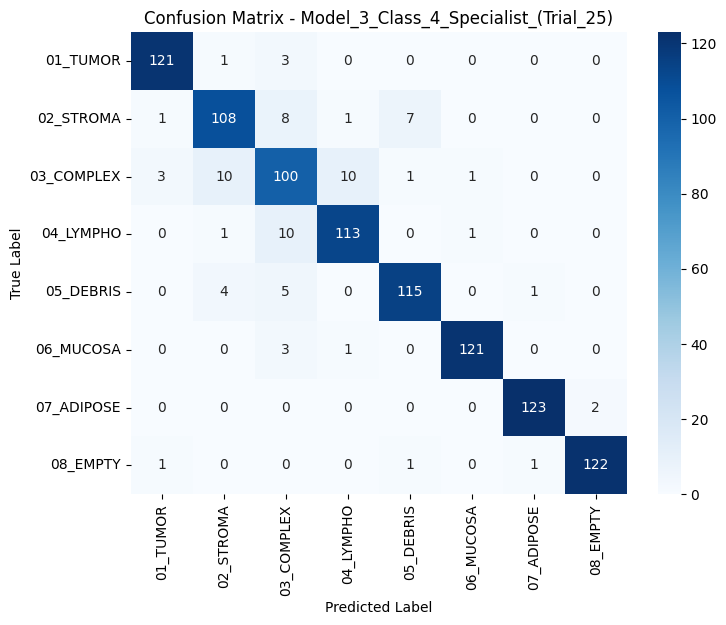


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_2_Model_3_Class_4_Specialist_(Trial_25).keras


========================= Training Ensemble Model 4/5: Model_4_Class_3_Specialist_(Trial_30) =========================
Using 'advanced_v1' augmentation (Fixed Albumentations)
Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 30s 196ms/step - accuracy: 0.2405 - loss: 5.3918 - val_accuracy: 0.4340 - val_loss: 1.6169 - learning_rate: 1.4002e-04
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 173ms/step - accuracy: 0.4894 - loss: 1.4907 - val_accuracy: 0.6230 - val_loss: 1.2900 - learning_rate: 1.4002e-04
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 174ms/step - accuracy: 0.6496 - loss: 1.2447 - val_accuracy: 0.7510 - val_loss: 1.0335 - learning_rate: 1.4002e-04
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 177ms/step - accuracy: 0.7848 - loss: 1.0206 - val_accuracy: 0.8390 - val_loss: 0.9026 - learning_rate: 1.4002e-04
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 175ms/step - accuracy: 0.

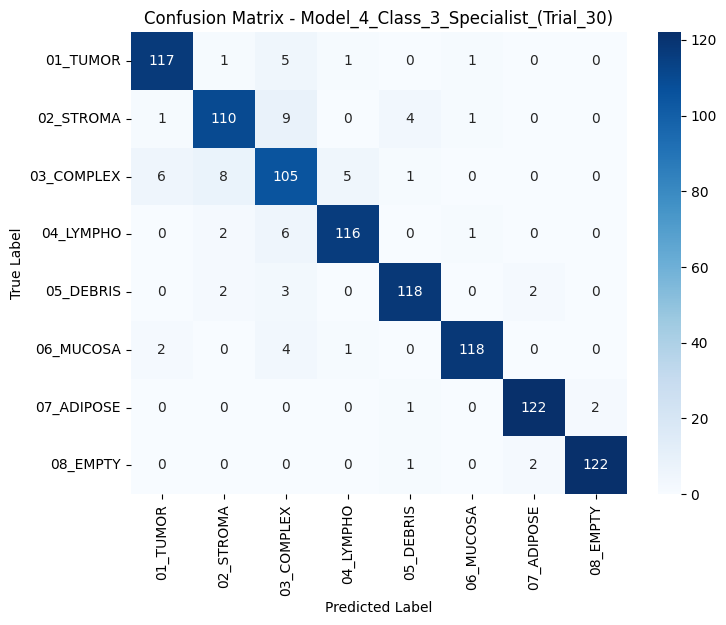


Model saved to /content/drive/MyDrive/Ensemble_Models_Final/model_3_Model_4_Class_3_Specialist_(Trial_30).keras


In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'
os.makedirs(ensemble_dir, exist_ok=True)
input_shape = (150, 150, 3)
all_histories = {}

for i, recipe in enumerate(ensemble_recipes):
    print(f"\n\n{'='*25} Training Ensemble Model {i+1}/4: {recipe['name']} {'='*25}")

    params = recipe['params']

    tf.keras.utils.set_random_seed(42 + i)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False
    if params.get('num_unfreeze_layers', 0) > 0:
        for layer in base_model.layers[-params['num_unfreeze_layers']:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    x = Dense(params['hidden_units_1'], activation=params['activation'])(x)
    x = Dropout(params['dropout_rate_1'])(x)
    if params.get('num_hidden_layers', 1) == 2:
        x = Dense(params['hidden_units_2'], activation='relu')(x)
        x = Dropout(params.get('dropout_rate_2', 0.5))(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    if params.get('optimizer') == 'Adam':
        optimizer = Adam(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))
    else:
        optimizer = AdamW(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=4, min_lr=1e-7)

    keras_simple_datagen = ImageDataGenerator(
            rotation_range=20, width_shift_range=0.2, height_shift_range=0.2,
            shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest',
            preprocessing_function=preprocess_input
        )

    if recipe['augmentation_type'] == 'simple':
        print("Using 'simple' augmentation (Keras ImageDataGenerator)")
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        train_generator = keras_simple_datagen.flow(X_train_img_uint8, y_train_enc, batch_size=params['batch_size'])
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_enc)

    elif recipe['augmentation_type'] == 'advanced_v1':
        print("Using 'advanced_v1' augmentation (Fixed Albumentations)")
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=params.get('label_smoothing', 0.0))
        model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])
        active_pipeline = advanced_v1_aug_pipeline
        sample_weights = np.array([params.get('problem_class_weight', 1.0) if y in [np.where(le.classes_ == '02_STROMA')[0][0], np.where(le.classes_ == '03_COMPLEX')[0][0]] else 1.0 for y in y_train_enc])
        train_generator = albumentations_generator_with_weights(X_train_img_uint8, y_train_one_hot, sample_weights, params['batch_size'], active_pipeline)
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_one_hot)

    else:
        print("Using 'advanced_v2' augmentation (Dynamic Albumentations)")
        loss_function = tf.keras.losses.CategoricalCrossentropy(label_smoothing=params.get('label_smoothing', 0.0))
        model.compile(optimizer=optimizer, loss=loss_function, metrics=['accuracy'])
        active_pipeline = create_dynamic_advanced_v2_pipeline(params)
        sample_weights = np.array([params.get('problem_class_weight', 1.0) if y in [np.where(le.classes_ == '02_STROMA')[0][0], np.where(le.classes_ == '03_COMPLEX')[0][0]] else 1.0 for y in y_train_enc])
        train_generator = albumentations_generator_with_weights(X_train_img_uint8, y_train_one_hot, sample_weights, params['batch_size'], active_pipeline)
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_one_hot)

    steps_per_epoch = len(X_train_img_uint8) // params['batch_size']
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=100,
        validation_data=validation_data,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    all_histories[recipe['name']] = history

    print(f"\n--- PERFORMANCE REPORT FOR: {recipe['name']} ---")
    y_pred_probs = model.predict(preprocess_input(X_test_img_uint8.copy()))
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred_labels, target_names=le.classes_))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test_enc, y_pred_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f'Confusion Matrix - {recipe["name"]}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    model_path = os.path.join(ensemble_dir, f"model_{i}_{recipe['name']}.keras")
    model.save(model_path)
    print(f"\nModel saved to {model_path}")

Attempting to load 4 specific models for the ensemble...
Successfully loaded: model_0_Model_1_Run1_Best.keras
Successfully loaded: model_1_Model_2_Class_2_Specialist_(Trial_48).keras
Successfully loaded: model_2_Model_3_Class_4_Specialist_(Trial_25).keras
Successfully loaded: model_3_Model_4_Class_3_Specialist_(Trial_30).keras

--- Generating predictions from all 4 ensemble models ---
Predicting with model 1...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step
Predicting with model 2...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step
Predicting with model 3...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step
Predicting with model 4...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step

Averaging predictions...


--- FINAL ENSEMBLE PERFORMANCE REPORT ---
Final Ensemble F1 Score (Macro): 0.9465

Ensemble Classification Report:
              precision    recall  f1-score   support

    01_TUMOR       0.97      0.97      0.97       125
   02_STROMA       0.93      0.91      0.92       125
  03_COMPLEX       0.82      0.89     

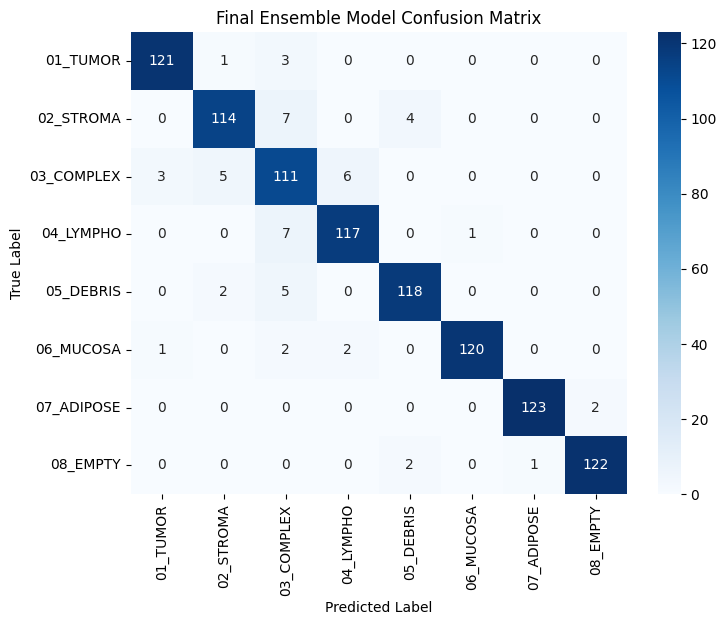

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'

specific_model_filenames = [
    'model_0_Model_1_Run1_Best.keras',
    'model_1_Model_2_Class_2_Specialist_(Trial_48).keras',
    'model_2_Model_3_Class_4_Specialist_(Trial_25).keras',
    'model_3_Model_4_Class_3_Specialist_(Trial_30).keras'
]

model_paths = [os.path.join(ensemble_dir, fname) for fname in specific_model_filenames]

print(f"Attempting to load {len(model_paths)} specific models for the ensemble...")
loaded_models = []
for path in model_paths:
    try:
        model = load_model(path)
        loaded_models.append(model)
        print(f"Successfully loaded: {os.path.basename(path)}")
    except Exception as e:
        print(f"Error loading model {os.path.basename(path)}: {e}")

if len(loaded_models) == len(model_paths):
    preprocessed_test_images = preprocess_input(X_test_img_uint8.copy())
    all_predictions = []

    print(f"\n--- Generating predictions from all {len(loaded_models)} ensemble models ---")
    for i, model in enumerate(loaded_models):
        print(f"Predicting with model {i+1}...")
        y_pred_probs = model.predict(preprocessed_test_images)
        all_predictions.append(y_pred_probs)

    print("\nAveraging predictions...")
    ensembled_probs = np.mean(all_predictions, axis=0)
    ensembled_labels = np.argmax(ensembled_probs, axis=1)

    print("\n\n--- FINAL ENSEMBLE PERFORMANCE REPORT ---")
    final_f1_score = f1_score(y_test_enc, ensembled_labels, average='macro')
    print(f"Final Ensemble F1 Score (Macro): {final_f1_score:.4f}")

    print("\nEnsemble Classification Report:")
    print(classification_report(y_test_enc, ensembled_labels, target_names=le.classes_))

    print("\nEnsemble Confusion Matrix:")
    cm = confusion_matrix(y_test_enc, ensembled_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title('Final Ensemble Model Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
else:
    print("\nEnsemble process aborted due to errors in loading models.")

# With TTA

Adding Test-Time Augmentation on the last Ensemble model.

Attempting to load 4 specific models for the ensemble...
Successfully loaded: model_0_Model_1_Run1_Best.keras
Successfully loaded: model_1_Model_2_Class_2_Specialist_(Trial_48).keras
Successfully loaded: model_2_Model_3_Class_4_Specialist_(Trial_25).keras
Successfully loaded: model_3_Model_4_Class_3_Specialist_(Trial_30).keras

--- Applying TTA and Ensembling on the test set ---


Processing images with TTA: 100%|██████████| 1000/1000 [05:09<00:00,  3.23it/s]




--- FINAL TTA-ENSEMBLE PERFORMANCE REPORT ---
Final TTA-Ensemble F1 Score (Macro): 0.94469

TTA-Ensemble Classification Report:
              precision    recall  f1-score   support

    01_TUMOR       0.98      0.97      0.97       125
   02_STROMA       0.96      0.90      0.93       125
  03_COMPLEX       0.80      0.87      0.84       125
   04_LYMPHO       0.91      0.93      0.92       125
   05_DEBRIS       0.94      0.94      0.94       125
   06_MUCOSA       0.99      0.97      0.98       125
  07_ADIPOSE       1.00      0.98      0.99       125
    08_EMPTY       0.98      0.98      0.98       125

    accuracy                           0.94      1000
   macro avg       0.95      0.94      0.94      1000
weighted avg       0.95      0.94      0.94      1000


TTA-Ensemble Confusion Matrix:


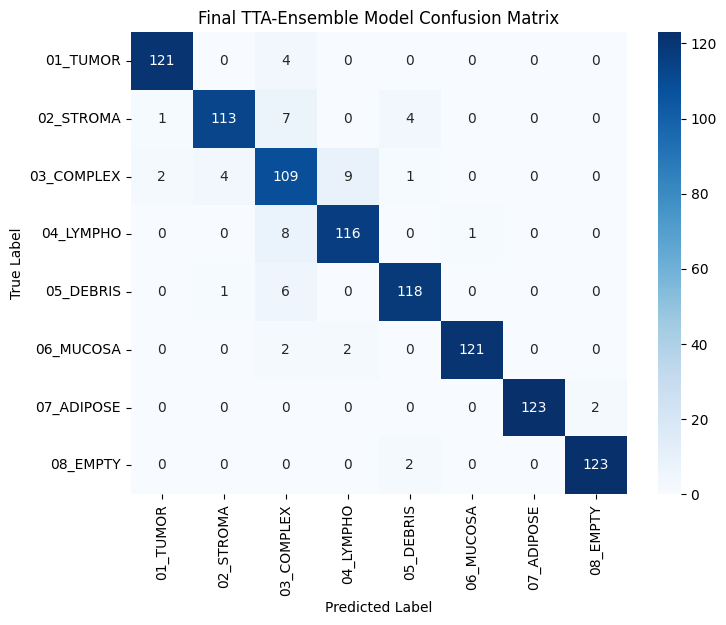

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'

specific_model_filenames = [
    'model_0_Model_1_Run1_Best.keras',
    'model_1_Model_2_Class_2_Specialist_(Trial_48).keras',
    'model_2_Model_3_Class_4_Specialist_(Trial_25).keras',
    'model_3_Model_4_Class_3_Specialist_(Trial_30).keras'
]

model_paths = [os.path.join(ensemble_dir, fname) for fname in specific_model_filenames]

print(f"Attempting to load {len(model_paths)} specific models for the ensemble...")
loaded_models = []
for path in model_paths:
    try:
        model = load_model(path)
        loaded_models.append(model)
        print(f"Successfully loaded: {os.path.basename(path)}")
    except Exception as e:
        print(f"Error loading model {os.path.basename(path)}: {e}")

if len(loaded_models) == len(model_paths):
    final_ensembled_tta_probs = []
    print("\n--- Applying TTA and Ensembling on the test set ---")

    for test_image_uint8 in tqdm(X_test_img_uint8, desc="Processing images with TTA"):

        augmentations = [
            test_image_uint8,
            np.fliplr(test_image_uint8)
        ]

        tta_batch = np.array(augmentations, dtype=np.float32)
        tta_batch_preprocessed = preprocess_input(tta_batch)

        all_model_preds_for_image = []
        for model in loaded_models:
            preds_for_tta_batch = model.predict(tta_batch_preprocessed, verbose=0)
            all_model_preds_for_image.append(preds_for_tta_batch)

        avg_probs_for_image = np.mean(all_model_preds_for_image, axis=(0, 1))

        final_ensembled_tta_probs.append(avg_probs_for_image)

    final_ensembled_tta_probs = np.array(final_ensembled_tta_probs)
    ensembled_tta_labels = np.argmax(final_ensembled_tta_probs, axis=1)

    print("\n\n--- FINAL TTA-ENSEMBLE PERFORMANCE REPORT ---")

    final_f1_score = f1_score(y_test_enc, ensembled_tta_labels, average='macro')
    print(f"Final TTA-Ensemble F1 Score (Macro): {final_f1_score:.5f}")

    print("\nTTA-Ensemble Classification Report:")
    print(classification_report(y_test_enc, ensembled_tta_labels, target_names=le.classes_))

    print("\nTTA-Ensemble Confusion Matrix:")
    cm = confusion_matrix(y_test_enc, ensembled_tta_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title('Final TTA-Ensemble Model Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
else:
    print("\nEnsemble process aborted due to errors in loading models.")

# Hierarchy Model

In [ ]:
X_train_img_uint8 = load_images_simple(train_df)
X_test_img_uint8 = load_images_simple(test_df)

y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

Loading 1000 images: 100%|██████████| 1000/1000 [00:00<00:00, 1738.89it/s]


In [ ]:
idx_stroma = np.where(le.classes_ == '02_STROMA')[0][0]
idx_complex = np.where(le.classes_ == '03_COMPLEX')[0][0]
specialist_positive_classes = [idx_stroma, idx_complex]

idx_tumor = np.where(le.classes_ == '01_TUMOR')[0][0]
idx_lympho = np.where(le.classes_ == '04_LYMPHO')[0][0]
idx_debris = np.where(le.classes_ == '05_DEBRIS')[0][0]
hard_negative_indices = [idx_tumor, idx_lympho, idx_debris]

is_positive_mask = np.isin(y_train_enc, specialist_positive_classes)
X_specialist_positives = X_train_img_uint8[is_positive_mask]
y_specialist_positives = y_train_enc[is_positive_mask]

is_hard_negative_mask = np.isin(y_train_enc, hard_negative_indices)
X_hard_negatives = X_train_img_uint8[is_hard_negative_mask]
num_samples_to_add = len(y_specialist_positives)
random_negative_indices = np.random.choice(np.arange(len(X_hard_negatives)), size=num_samples_to_add, replace=False)
X_other = X_hard_negatives[random_negative_indices]

X_specialist_train = np.concatenate([X_specialist_positives, X_other], axis=0)

y_remap = {idx_stroma: 0, idx_complex: 1}
y_specialist_train = np.concatenate([
    [y_remap[y] for y in y_specialist_positives],
    np.full(num_samples_to_add, 2)
])
y_specialist_train_one_hot = to_categorical(y_specialist_train, num_classes=3)

print(f"Created a robust specialist training set with {len(X_specialist_train)} images.")
print(f"Distribution: STROMA(0): {np.sum(y_specialist_train==0)}, COMPLEX(1): {np.sum(y_specialist_train==1)}, OTHER(2): {np.sum(y_specialist_train==2)}")

Created a robust specialist training set with 2000 images.
Distribution: STROMA(0): 500, COMPLEX(1): 500, OTHER(2): 1000


In [ ]:
print("Building and training the single robust specialist sub-model...")

specialist_datagen = ImageDataGenerator(rotation_range=15, horizontal_flip=True, preprocessing_function=preprocess_input)
specialist_train_generator = specialist_datagen.flow(X_specialist_train, y_specialist_train_one_hot, batch_size=16, shuffle=True)

input_shape = (150, 150, 3)
base_model_spec = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
base_model_spec.trainable = False
for layer in base_model_spec.layers[-4:]: layer.trainable = True

x = Flatten()(base_model_spec.output)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
specialist_output = Dense(3, activation='softmax', dtype='float32')(x)
specialist_model = Model(inputs=base_model_spec.input, outputs=specialist_output)

specialist_model.compile(
    optimizer=Adam(learning_rate=2e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall'), tf.keras.metrics.AUC(name='auc')]
)

early_stopping_spec = EarlyStopping(monitor='loss', patience=8, restore_best_weights=True)
lr_scheduler_spec = ReduceLROnPlateau(monitor='loss', factor=0.2, patience=3, min_lr=1e-7)

specialist_model.fit(
    specialist_train_generator,
    steps_per_epoch=len(X_specialist_train) // 16,
    epochs=80,
    callbacks=[early_stopping_spec, lr_scheduler_spec],
    verbose=1
)

specialist_model_path = '/content/drive/MyDrive/Ensemble_Models_Final/class_2_3_specialist_model.keras'
specialist_model.save(specialist_model_path)
print(f"\nRobust specialist model training complete and saved to: {specialist_model_path}")

y_pred_probs = specialist_model.predict(preprocess_input(X_specialist_train.copy()))
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_specialist_train_one_hot, axis=1)
print("Confusion Matrix for Specialist Model:")
print(confusion_matrix(y_true, y_pred))


Building and training the single robust specialist sub-model...
Epoch 1/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - accuracy: 0.4307 - auc: 0.5993 - loss: 5.0230 - precision: 0.4353 - recall: 0.4212 - learning_rate: 2.0000e-05
Epoch 2/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - accuracy: 0.6000 - auc: 0.8011 - loss: 0.9449 - precision: 0.6389 - recall: 0.5582 - learning_rate: 2.0000e-05
Epoch 3/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.6980 - auc: 0.8820 - loss: 0.6596 - precision: 0.7687 - recall: 0.6237 - learning_rate: 2.0000e-05
Epoch 4/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - accuracy: 0.7241 - auc: 0.9020 - loss: 0.6081 - precision: 0.7991 - recall: 0.6696 - learning_rate: 2.0000e-05
Epoch 5/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 103ms/step - accuracy: 0.7711 - auc: 0.9269 - loss: 0.5188 - precision: 0.8227 - recall: 0.7236 - learning_rate: 2.0000e-05
Epoch 6/80
125/125 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - accuracy: 0.8129 - auc: 0.9447 - loss: 0.457

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'
model_files = sorted([f for f in os.listdir(ensemble_dir) if f.endswith('.keras') and 'specialist' not in f])
print(model_files)
model_paths = [os.path.join(ensemble_dir, fname) for fname in model_files]

specialist_model_path = '/content/drive/MyDrive/Ensemble_Models_Final/specialist_model_v2.keras'
print("Loading the single robust specialist model...")
specialist_model = load_model(specialist_model_path)

for model_path in model_paths:
    model_name = os.path.basename(model_path)
    print(f"\n\n{'='*25} Running Hierarchical Test for: {model_name} {'='*25}")

    main_model = load_model(model_path)

    print("Performing hierarchical prediction...")
    main_pred_probs = main_model.predict(preprocess_input(X_test_img_uint8.copy()))
    main_pred_labels = np.argmax(main_pred_probs, axis=1)

    final_predictions = main_pred_labels.copy()
    confidence_threshold = 0.90

    is_main_pred_problematic = np.isin(main_pred_labels, [idx_stroma, idx_complex])
    is_confident = np.max(main_pred_probs, axis=1) <= confidence_threshold
    indices_to_reclassify = np.where(is_main_pred_problematic & is_confident)[0]

    if len(indices_to_reclassify) > 0:
        print(f"Re-classifying {len(indices_to_reclassify)} predictions with the specialist...")
        images_for_specialist = X_test_img_uint8[indices_to_reclassify]

        specialist_pred_probs = specialist_model.predict(preprocess_input(images_for_specialist.copy()))
        specialist_pred_labels = np.argmax(specialist_pred_probs, axis=1)

        specialist_remap = {0: idx_stroma, 1: idx_complex}

        for i, original_index in enumerate(indices_to_reclassify):
            specialist_decision = specialist_pred_labels[i]
            if specialist_decision in specialist_remap:
                final_predictions[original_index] = specialist_remap[specialist_decision]

    print(f"\n--- HIERARCHICAL PERFORMANCE REPORT FOR: {model_name} ---")
    final_f1_score = f1_score(y_test_enc, final_predictions, average='macro')
    print(f"Final Hierarchical F1 Score (Macro): {final_f1_score:.5f}")
    print(classification_report(y_test_enc, final_predictions, target_names=le.classes_))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test_enc, final_predictions))

['model_0_Model_1_Run1_Best.keras', 'model_1_Model_2_Class_2_Specialist_(Trial_48).keras', 'model_1_Model_2_Run2_Best.keras', 'model_2_Model_3_Class_4_Specialist_(Trial_25).keras', 'model_2_Model_3_Run3_Best.keras', 'model_3_Model_4_Class_3_Specialist_(Trial_30).keras', 'model_3_Model_4_Run3_Second.keras', 'model_4_Model_5_Run3_Third.keras']
Loading the single robust specialist model...


========================= Running Hierarchical Test for: model_0_Model_1_Run1_Best.keras =========================
Performing hierarchical prediction...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step
Re-classifying 95 predictions with the specialist...
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step

--- HIERARCHICAL PERFORMANCE REPORT FOR: model_0_Model_1_Run1_Best.keras ---
Final Hierarchical F1 Score (Macro): 0.93337
              precision    recall  f1-score   support

    01_TUMOR       0.91      0.98      0.94       125
   02_STROMA       0.88      0.91      0.89       125
  03_COMPLEX       0.83      0.86      0

# Specialist Optuna

Running another optuna trial, now on the expert model to try and perfect its performence.

In [ ]:
class_2_augs = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.Rotate(limit=30, p=0.7),
    A.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.3, p=0.9),
    A.GaussNoise(var_limit=(10.0, 80.0), p=0.6)
])
class_3_augs = A.Compose([
    A.HorizontalFlip(p=0.7), A.VerticalFlip(p=0.7), A.RandomRotate90(p=0.7),
    A.ElasticTransform(p=0.7, alpha=120, sigma=120 * 0.09),
    A.GridDistortion(p=0.7, num_steps=5, distort_limit=0.4),
    A.CLAHE(p=0.8), A.RandomGamma(p=0.8),
    A.CoarseDropout(max_holes=12, max_height=30, max_width=30, p=0.7)
])
regular_augs = A.Compose([
    A.HorizontalFlip(p=0.5), A.Rotate(limit=20, p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, p=0.5),
])

def create_specialist_generator_with_weights(X_data, y_data_int, sample_weights, batch_size, aug_pipelines, is_training=True):
    indices = np.arange(len(X_data))
    idx_stroma_specialist, idx_complex_specialist = 0, 1

    while True:
        if is_training:
            np.random.shuffle(indices)

        for i in range(0, len(indices), batch_size):
            batch_idx = indices[i:i+batch_size]
            if len(batch_idx) != batch_size: continue

            batch_x, batch_y, batch_sw = [], [], []
            for idx in batch_idx:
                image = X_data[idx]
                label_int = y_data_int[idx]

                if is_training:
                    if label_int == idx_stroma_specialist:
                        aug_pipeline = aug_pipelines['class_2']
                    elif label_int == idx_complex_specialist:
                        aug_pipeline = aug_pipelines['class_3']
                    else:
                        aug_pipeline = aug_pipelines['regular']
                    augmented = aug_pipeline(image=image.astype(np.uint8))
                    batch_x.append(augmented['image'])
                else:
                    batch_x.append(image)

                batch_y.append(label_int)
                batch_sw.append(sample_weights[idx])

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), np.array(batch_y), np.array(batch_sw)

In [ ]:
idx_stroma = np.where(le.classes_ == '02_STROMA')[0][0]
idx_complex = np.where(le.classes_ == '03_COMPLEX')[0][0]
idx_lympho = np.where(le.classes_ == '04_LYMPHO')[0][0]
specialist_positive_classes = [idx_stroma, idx_complex, idx_lympho]

idx_tumor = np.where(le.classes_ == '01_TUMOR')[0][0]
idx_debris = np.where(le.classes_ == '05_DEBRIS')[0][0]
hard_negative_indices = [idx_tumor, idx_debris]

is_positive_mask = np.isin(y_train_enc, specialist_positive_classes)
X_specialist_positives = X_train_img_uint8[is_positive_mask]
y_specialist_positives = y_train_enc[is_positive_mask]

is_hard_negative_mask = np.isin(y_train_enc, hard_negative_indices)
X_hard_negatives = X_train_img_uint8[is_hard_negative_mask]
num_samples_to_add = len(y_specialist_positives) // 2
random_negative_indices = np.random.choice(np.arange(len(X_hard_negatives)), size=num_samples_to_add, replace=False)
X_other = X_hard_negatives[random_negative_indices]

X_specialist_train_full = np.concatenate([X_specialist_positives, X_other], axis=0)
y_remap = {idx_stroma: 0, idx_complex: 1, idx_lympho: 2}
y_specialist_train_int = np.concatenate([
    [y_remap[y] for y in y_specialist_positives],
    np.full(num_samples_to_add, 3)
])
print(f"Created full specialist training set with {len(X_specialist_train_full)} images.")

LabelEncoder has been fitted.


Loading 1000 images: 100%|██████████| 1000/1000 [00:00<00:00, 1604.56it/s]


Created full specialist training set with 2250 images.


In [ ]:
def objective_specialist(trial):
    params = {
        'num_unfreeze': trial.suggest_int("num_unfreeze", 7, 12),
        'num_hidden_layers': trial.suggest_int("num_hidden_layers", 2, 3),
        'hidden_units_1': trial.suggest_categorical("hidden_units_1", [1536, 2048, 2560, 3200]),
        'dropout_1': trial.suggest_float("dropout_1", 0.3, 0.5),
        'learning_rate': trial.suggest_float("learning_rate", 1e-7, 9e-5, log=True),
        'batch_size': trial.suggest_categorical("batch_size", [16, 32, 64]),
        'weight_for_stroma': trial.suggest_float("weight_for_stroma", 0.5, 1.2),
        'weight_for_complex': trial.suggest_float("weight_for_complex", 1.3, 2.3),
        'weight_for_lympho': trial.suggest_float("weight_for_lympho", 0.7, 1.4),
        'weight_for_other': trial.suggest_float("weight_for_other", 0.8, 1.3),
        'activation': trial.suggest_categorical("activation", ["relu", "swish"]),
        'rotation_limit_c2': trial.suggest_int("rotation_limit_c2", 10, 35),
        'color_jitter_c2': trial.suggest_float("color_jitter_c2", 0.32, 0.45),
        'elastic_p_c3': trial.suggest_float("elastic_p_c3", 0.4, 0.8),
        'coarse_p_c3': trial.suggest_float("coarse_p_c3", 0.3, 0.7),
    }

    if params['num_hidden_layers'] >= 2:
        params['hidden_units_2'] = trial.suggest_categorical("hidden_units_2", [512, 1024, 1536, 2048])
        params['dropout_2'] = trial.suggest_float("dropout_2", 0.3, 0.6)
    if params['num_hidden_layers'] >= 3:
        params['hidden_units_3'] = trial.suggest_categorical("hidden_units_3", [256, 512, 768, 1024])
        params['dropout_3'] = trial.suggest_float("dropout_3", 0.3, 0.5)

    wandb.init(project="specialist-model-v25", config=params, reinit=True, name=f"trial-{trial.number}")

    X_spec_train, X_spec_val, y_spec_train, y_spec_val = train_test_split(
        X_specialist_train_full, y_specialist_train_int, test_size=0.2, random_state=42, stratify=y_specialist_train_int
    )

    bbox_params = A.BboxParams(format='pascal_voc', label_fields=[])

    class_2_augs = A.Compose([A.HorizontalFlip(p=0.5), A.Rotate(limit=params['rotation_limit_c2']), A.ColorJitter(brightness=params['color_jitter_c2'], contrast=params['color_jitter_c2'])], bbox_params=bbox_params)
    class_3_augs = A.Compose([A.HorizontalFlip(p=0.7), A.VerticalFlip(p=0.7), A.ElasticTransform(p=params['elastic_p_c3']), A.CoarseDropout(p=params['coarse_p_c3'])], bbox_params=bbox_params)
    regular_augs = A.Compose([A.HorizontalFlip(p=0.5)], bbox_params=bbox_params)

    pipelines = {'class_2': class_2_augs, 'class_3': class_3_augs, 'regular': regular_augs}

    specialist_class_weights = {0: params['weight_for_stroma'], 1: params['weight_for_complex'], 2: params['weight_for_lympho'], 3: params['weight_for_other']}
    sample_weights_train = np.array([specialist_class_weights.get(label, 1.0) for label in y_spec_train])
    sample_weights_val = np.array([specialist_class_weights.get(label, 1.0) for label in y_spec_val])

    train_generator_spec = create_specialist_generator_with_weights(X_spec_train, y_spec_train, sample_weights_train, params['batch_size'], is_training=True, aug_pipelines=pipelines)
    val_generator_spec = create_specialist_generator_with_weights(X_spec_val, y_spec_val, sample_weights_val, params['batch_size'], is_training=False, aug_pipelines={'class_2': A.Compose([]), 'class_3': A.Compose([]), 'regular': A.Compose([])})

    input_shape = (150, 150, 3)
    base_model_spec = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model_spec.trainable = False
    for layer in base_model_spec.layers[-params['num_unfreeze']:]:
        layer.trainable = True

    x = Flatten()(base_model_spec.output)
    for i in range(1, params['num_hidden_layers'] + 1):
        x = Dense(params[f'hidden_units_{i}'], activation=params['activation'])(x)
        x = Dropout(params[f'dropout_{i}'])(x)

    specialist_output = Dense(4, activation='softmax', dtype='float32')(x)
    specialist_model = Model(inputs=base_model_spec.input, outputs=specialist_output)

    specialist_model.compile(optimizer=AdamW(
        learning_rate=params['learning_rate']),
        loss='sparse_categorical_crossentropy',
        metrics=[
            'accuracy'
    ])

    history_spec = specialist_model.fit(
        train_generator_spec,
        steps_per_epoch=len(X_spec_train) // params['batch_size'],
        epochs=100,
        validation_data=val_generator_spec,
        validation_steps=len(X_spec_val) // params['batch_size'],
        callbacks=[
            EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True),
            ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=7),
            WandbMetricsLogger(log_freq=1)
        ],
        verbose=1
    )

    y_pred_probs = specialist_model.predict(preprocess_input(X_spec_val.copy()))
    y_pred = np.argmax(y_pred_probs, axis=1)

    f1_macro = f1_score(y_spec_val, y_pred, average='macro')
    precision = precision_score(y_spec_val, y_pred, average='macro')
    recall = recall_score(y_spec_val, y_pred, average='macro')

    wandb.log({
        "val_f1_macro": f1_macro,
        "val_precision": precision,
        "val_recall": recall
    })


    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_spec_val, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
                xticklabels=['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER'],
                yticklabels=['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER'])
    plt.title(f'Confusion Matrix for Trial #{trial.number}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()
    wandb.log({
        "confusion_matrix": wandb.Image(plt)
    })

    return f1_score(y_spec_val, y_pred, average='macro')

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
[I 2025-07-04 11:23:34,926] A new study created in RDB with name: Specialist_Model_Optimization_v25
wandb: Currently logged in as: ilay-sabah9 (ilay-sabah9-holon-institute-of-technology). Use `wandb login --relogin` to force relogin


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


wandb: ERROR Unable to log learning rate.


100/100 ━━━━━━━━━━━━━━━━━━━━ 15s 48ms/step - accuracy: 0.2794 - loss: 11.0286 - val_accuracy: 0.3925 - val_loss: 2.1643 - learning_rate: 3.0011e-06
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - accuracy: 0.3780 - loss: 3.3969 - val_accuracy: 0.3825 - val_loss: 1.8115 - learning_rate: 3.0011e-06
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.4250 - loss: 2.1196 - val_accuracy: 0.3675 - val_loss: 1.6938 - learning_rate: 3.0011e-06
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.4870 - loss: 1.6546 - val_accuracy: 0.3750 - val_loss: 1.6114 - learning_rate: 3.0011e-06
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accuracy: 0.4913 - loss: 1.4105 - val_accuracy: 0.4025 - val_loss: 1.5775 - learning_rate: 3.0011e-06
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - accuracy: 0.5242 - loss: 1.2031 - val_accuracy: 0.4400 - val_loss: 1.5324 - learning_rate: 3.0011e-06
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - accura

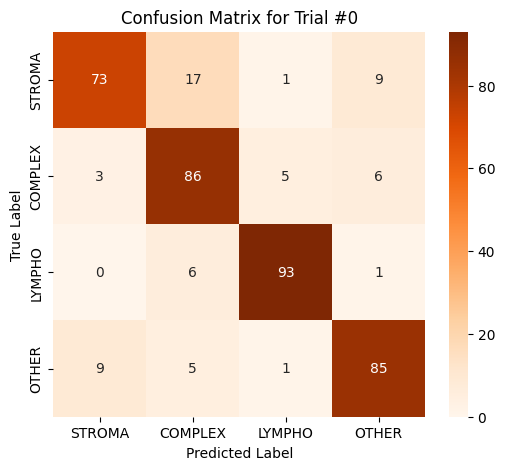

[I 2025-07-04 11:28:56,983] Trial 0 finished with value: 0.8421746628062013 and parameters: {'num_unfreeze': 10, 'num_hidden_layers': 2, 'hidden_units_1': 2560, 'dropout_1': 0.4740864814936548, 'learning_rate': 3.0010762495244367e-06, 'batch_size': 16, 'weight_for_stroma': 0.6890946627936806, 'weight_for_complex': 2.2377956977573197, 'weight_for_lympho': 1.2496772632030257, 'weight_for_other': 0.9960319917525762, 'activation': 'swish', 'rotation_limit_c2': 23, 'color_jitter_c2': 0.4295281103764372, 'elastic_p_c3': 0.7890073204312682, 'coarse_p_c3': 0.6598654930168422, 'hidden_units_2': 512, 'dropout_2': 0.4579929965432369}. Best is trial 0 with value: 0.8421746628062013.


batch/accuracy,▁▂▃▄▄▅▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇███████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▅▃▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▃▄▄▅▅▆▆▇▇▇▇▇▇▇▇▇██████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,████████████████████████████▂▂▂▂▂▂▂▂▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▁▂▂▄▄▅▅▅▅▆▆▇▇▇▇▇▇███▇█████████████████
epoch/val_loss,█▆▆▅▅▄▄▄▃▃▃▃▂▂▂▂▁▁▂▁▂▁▁▂▁▁▂▁▁▁▁▁▂▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - accuracy: 0.2263 - loss: 20.4214 - val_accuracy: 0.2734 - val_loss: 2.9780 - learning_rate: 1.6614e-06
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.2558 - loss: 7.5792 - val_accuracy: 0.3568 - val_loss: 2.2111 - learning_rate: 1.6614e-06
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.2912 - loss: 4.6769 - val_accuracy: 0.3672 - val_loss: 1.9095 - learning_rate: 1.6614e-06
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.3405 - loss: 3.4087 - val_accuracy: 0.3880 - val_loss: 1.7342 - learning_rate: 1.6614e-06
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.3694 - loss: 2.9264 - val_accuracy: 0.4245 - val_loss: 1.6387 - learning_rate: 1.6614e-06
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.3829 - loss: 2.4623 - val_accuracy: 0.4323 - val_loss: 1.5955 - learning_rate: 1.6614e-06
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accurac

<Figure size 640x480 with 0 Axes>

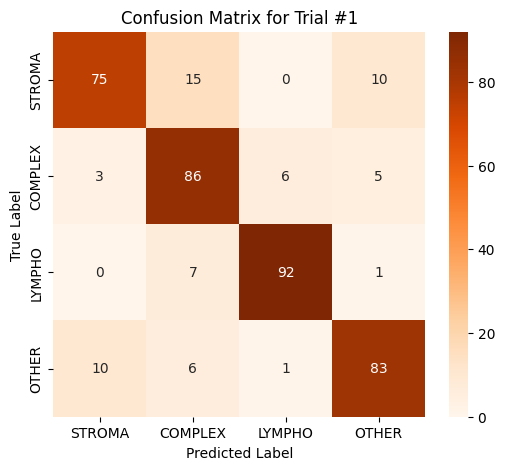

[I 2025-07-04 11:34:44,981] Trial 1 finished with value: 0.8401011570079469 and parameters: {'num_unfreeze': 12, 'num_hidden_layers': 2, 'hidden_units_1': 3200, 'dropout_1': 0.45636288687734794, 'learning_rate': 1.6614156519068729e-06, 'batch_size': 32, 'weight_for_stroma': 0.9047481438877675, 'weight_for_complex': 2.0455165974502423, 'weight_for_lympho': 1.3816989386507466, 'weight_for_other': 1.0067136029059456, 'activation': 'relu', 'rotation_limit_c2': 11, 'color_jitter_c2': 0.42034706198853156, 'elastic_p_c3': 0.7338406074229563, 'coarse_p_c3': 0.6625523890699586, 'hidden_units_2': 512, 'dropout_2': 0.5549300656565375}. Best is trial 0 with value: 0.8421746628062013.


batch/accuracy,▁▂▂▃▃▃▄▄▄▆▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇██▇██████████
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▅▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▂▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▆▇▇▇▇▇▇▇▇█████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,██████████████████████████████████████▁▁
epoch/loss,█▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▇▆▆▇▇▇▇▇█▇▇█▇█████████
epoch/val_loss,█▅▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 173ms/step - accuracy: 0.3043 - loss: 5.3467 - val_accuracy: 0.4062 - val_loss: 1.3270 - learning_rate: 5.6127e-05
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.5716 - loss: 1.0839 - val_accuracy: 0.5521 - val_loss: 0.9836 - learning_rate: 5.6127e-05
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 118ms/step - accuracy: 0.7434 - loss: 0.6591 - val_accuracy: 0.5781 - val_loss: 0.9623 - learning_rate: 5.6127e-05
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 113ms/step - accuracy: 0.7808 - loss: 0.5679 - val_accuracy: 0.7057 - val_loss: 0.7467 - learning_rate: 5.6127e-05
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.8548 - loss: 0.4035 - val_accuracy: 0.6953 - val_loss: 0.6677 - learning_rate: 5.6127e-05
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.8954 - loss: 0.3210 - val_accuracy: 0.7760 - val_loss: 0.5624 - learning_rate: 5.6127e-05
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 114ms/step - ac

<Figure size 640x480 with 0 Axes>

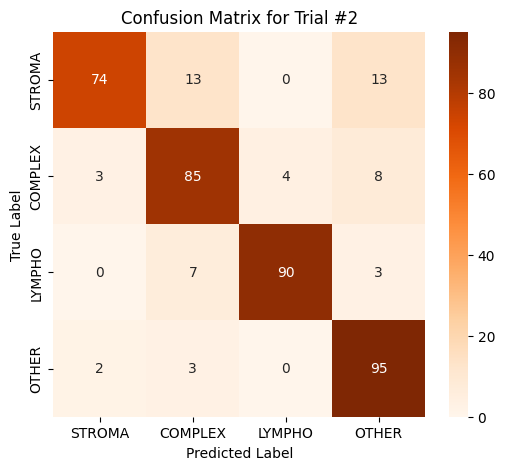

[I 2025-07-04 11:36:56,273] Trial 2 finished with value: 0.8598845737469959 and parameters: {'num_unfreeze': 8, 'num_hidden_layers': 2, 'hidden_units_1': 1536, 'dropout_1': 0.3262215560409946, 'learning_rate': 5.612650783716809e-05, 'batch_size': 64, 'weight_for_stroma': 0.6733794912874518, 'weight_for_complex': 1.586743438304161, 'weight_for_lympho': 0.9316324920259372, 'weight_for_other': 1.2129834288108257, 'activation': 'swish', 'rotation_limit_c2': 28, 'color_jitter_c2': 0.424754043134987, 'elastic_p_c3': 0.6003920072983658, 'coarse_p_c3': 0.5484570316346549, 'hidden_units_2': 512, 'dropout_2': 0.5881841372620855}. Best is trial 2 with value: 0.8598845737469959.


batch/accuracy,▁▄▅▆▇▇▇▆▇▇▇▇▇▇█▇████████████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▄▅▆▆▇▇▇▇▇▇▇▇▇▇███████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,██████████████████████████████▂▂▂▂▂▂▂▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▃▃▅▅▆▆▇▇▆▇▆▇▆▇▇▇▇▇▇▇▇█████▆██████████
epoch/val_loss,█▅▅▄▃▂▃▂▂▂▂▂▂▃▂▁▁▁▂▁▁▁▁▁▁▁▁▂▁▁▂▁▂▁▁▁▂▂
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.2701 - loss: 10.1928 - val_accuracy: 0.3073 - val_loss: 2.0193 - learning_rate: 4.0070e-06
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.3293 - loss: 3.4922 - val_accuracy: 0.3724 - val_loss: 1.6395 - learning_rate: 4.0070e-06
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.3651 - loss: 2.3178 - val_accuracy: 0.4219 - val_loss: 1.4967 - learning_rate: 4.0070e-06
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.4343 - loss: 2.0123 - val_accuracy: 0.4609 - val_loss: 1.4345 - learning_rate: 4.0070e-06
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - accuracy: 0.4999 - loss: 1.5536 - val_accuracy: 0.4766 - val_loss: 1.3894 - learning_rate: 4.0070e-06
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5236 - loss: 1.4157 - val_accuracy: 0.5000 - val_loss: 1.3358 - learning_rate: 4.0070e-06
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accurac

<Figure size 640x480 with 0 Axes>

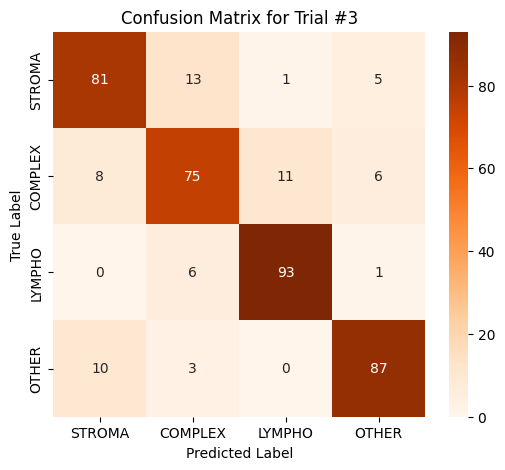

[I 2025-07-04 11:40:19,217] Trial 3 finished with value: 0.8392951510057406 and parameters: {'num_unfreeze': 10, 'num_hidden_layers': 2, 'hidden_units_1': 1536, 'dropout_1': 0.33796865664810316, 'learning_rate': 4.007001515654206e-06, 'batch_size': 32, 'weight_for_stroma': 1.0954927500349447, 'weight_for_complex': 1.3161171705580985, 'weight_for_lympho': 1.1527229038346567, 'weight_for_other': 1.256702990753957, 'activation': 'relu', 'rotation_limit_c2': 15, 'color_jitter_c2': 0.39526957839974786, 'elastic_p_c3': 0.7356462576524017, 'coarse_p_c3': 0.6176459535271148, 'hidden_units_2': 1024, 'dropout_2': 0.5268603336067001}. Best is trial 2 with value: 0.8598845737469959.


batch/accuracy,▁▂▃▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇██████████████████
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▂▃▄▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇███████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,███████████████████████████▂▂▂▂▂▂▂▂▁▁▁▁▁
epoch/loss,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▃▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇███████████████████
epoch/val_loss,█▆▆▅▅▄▄▄▄▄▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - accuracy: 0.2994 - loss: 12.3425 - val_accuracy: 0.3438 - val_loss: 2.5378 - learning_rate: 3.5843e-06
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.3488 - loss: 4.3581 - val_accuracy: 0.3854 - val_loss: 1.9284 - learning_rate: 3.5843e-06
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.3924 - loss: 2.8198 - val_accuracy: 0.4297 - val_loss: 1.7682 - learning_rate: 3.5843e-06
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.3838 - loss: 2.4007 - val_accuracy: 0.4401 - val_loss: 1.7078 - learning_rate: 3.5843e-06
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.4519 - loss: 2.0184 - val_accuracy: 0.4583 - val_loss: 1.6949 - learning_rate: 3.5843e-06
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.4332 - loss: 1.7607 - val_accuracy: 0.4714 - val_loss: 1.6805 - learning_rate: 3.5843e-06
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - accuracy

<Figure size 640x480 with 0 Axes>

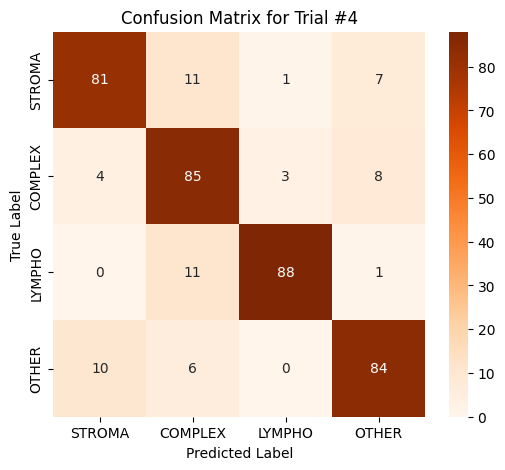

[I 2025-07-04 11:43:53,765] Trial 4 finished with value: 0.8463894907908992 and parameters: {'num_unfreeze': 9, 'num_hidden_layers': 2, 'hidden_units_1': 2560, 'dropout_1': 0.4629554442014111, 'learning_rate': 3.584295219948388e-06, 'batch_size': 32, 'weight_for_stroma': 1.0389475055955488, 'weight_for_complex': 2.224887754469839, 'weight_for_lympho': 0.9556789353524101, 'weight_for_other': 1.1893207480685448, 'activation': 'swish', 'rotation_limit_c2': 23, 'color_jitter_c2': 0.44621531242153006, 'elastic_p_c3': 0.57989345290409, 'coarse_p_c3': 0.5306924631687563, 'hidden_units_2': 2048, 'dropout_2': 0.5846662849697919}. Best is trial 2 with value: 0.8598845737469959.


batch/accuracy,▁▂▂▃▃▃▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇█▇████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▂▃▃▃▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,████████████████████████████████████▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▂▃▃▃▄▄▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████████
epoch/val_loss,█▆▅▅▅▅▄▄▄▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 80ms/step - accuracy: 0.2687 - loss: 9.4417 - val_accuracy: 0.3255 - val_loss: 2.4026 - learning_rate: 2.1656e-06
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - accuracy: 0.3333 - loss: 4.0771 - val_accuracy: 0.3724 - val_loss: 1.7657 - learning_rate: 2.1656e-06
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.3841 - loss: 2.5422 - val_accuracy: 0.4010 - val_loss: 1.5129 - learning_rate: 2.1656e-06
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - accuracy: 0.4112 - loss: 2.0394 - val_accuracy: 0.4089 - val_loss: 1.3825 - learning_rate: 2.1656e-06
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.4059 - loss: 1.7231 - val_accuracy: 0.4245 - val_loss: 1.3126 - learning_rate: 2.1656e-06
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.4479 - loss: 1.5349 - val_accuracy: 0.4401 - val_loss: 1.2634 - learning_rate: 2.1656e-06
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy:

<Figure size 640x480 with 0 Axes>

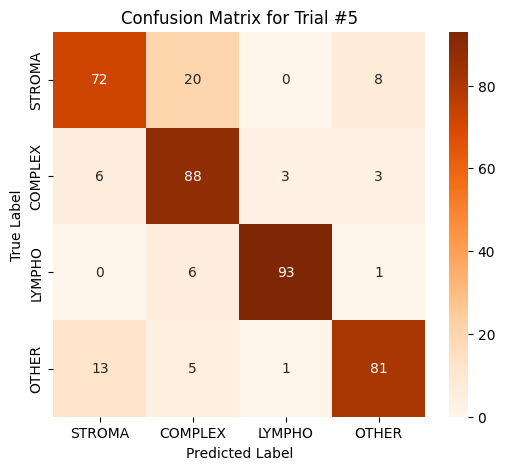

[I 2025-07-04 11:48:07,049] Trial 5 finished with value: 0.8352800861243506 and parameters: {'num_unfreeze': 12, 'num_hidden_layers': 2, 'hidden_units_1': 2560, 'dropout_1': 0.31127908472562166, 'learning_rate': 2.1656481036219824e-06, 'batch_size': 32, 'weight_for_stroma': 0.7798850535241835, 'weight_for_complex': 2.2461019799672233, 'weight_for_lympho': 0.8073248156265914, 'weight_for_other': 0.8074503851809166, 'activation': 'swish', 'rotation_limit_c2': 11, 'color_jitter_c2': 0.3939499086615894, 'elastic_p_c3': 0.6165372823582235, 'coarse_p_c3': 0.4489165909961865, 'hidden_units_2': 1536, 'dropout_2': 0.5365213773489956}. Best is trial 2 with value: 0.8598845737469959.


batch/accuracy,▁▂▂▃▃▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇█████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,████████████████████████████████████▂▂▂▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▂▃▃▃▄▄▄▅▅▅▅▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇█▇█▇██████
epoch/val_loss,█▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 41ms/step - accuracy: 0.2852 - loss: 5.4194 - val_accuracy: 0.3925 - val_loss: 1.4690 - learning_rate: 1.1015e-05
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.3826 - loss: 1.5082 - val_accuracy: 0.4650 - val_loss: 1.3978 - learning_rate: 1.1015e-05
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.4823 - loss: 1.2582 - val_accuracy: 0.5100 - val_loss: 1.2874 - learning_rate: 1.1015e-05
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.5472 - loss: 1.1187 - val_accuracy: 0.5625 - val_loss: 1.1760 - learning_rate: 1.1015e-05
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.6453 - loss: 0.9154 - val_accuracy: 0.5975 - val_loss: 1.0620 - learning_rate: 1.1015e-05
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.7166 - loss: 0.7595 - val_accuracy: 0.6675 - val_loss: 0.9579 - learning_rate: 1.1015e-05
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/st

<Figure size 640x480 with 0 Axes>

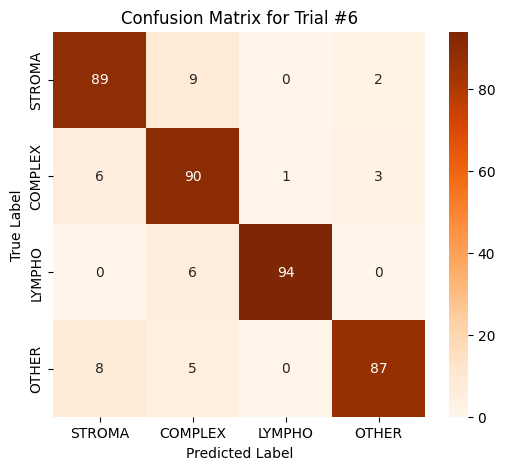

[I 2025-07-04 11:50:47,204] Trial 6 finished with value: 0.9010856779714539 and parameters: {'num_unfreeze': 8, 'num_hidden_layers': 3, 'hidden_units_1': 1536, 'dropout_1': 0.4970940799848087, 'learning_rate': 1.1014964774492182e-05, 'batch_size': 16, 'weight_for_stroma': 0.8600376891642019, 'weight_for_complex': 1.6896073046115005, 'weight_for_lympho': 0.8151945062681711, 'weight_for_other': 1.2075291628166644, 'activation': 'swish', 'rotation_limit_c2': 17, 'color_jitter_c2': 0.4499801258908117, 'elastic_p_c3': 0.6039993325497494, 'coarse_p_c3': 0.3752564313375566, 'hidden_units_2': 1024, 'dropout_2': 0.3161052134650869, 'hidden_units_3': 512, 'dropout_3': 0.3246782093264416}. Best is trial 6 with value: 0.9010856779714539.


batch/accuracy,▁▂▃▄▅▆▆▆▇▇▇▇▇▇▇▇▇███████████████████████
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▃▄▅▆▆▆▇▇▇▇▇▇▇█████████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,███████████████████████████▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▃▅▅▆▆▆▆▆▆▇▇▇▇█▇█▇▇███▇▇██████████████
epoch/val_loss,██▇▆▅▄▃▃▃▃▃▂▂▂▁▂▁▃▂▂▁▂▁▁▁▂▁▁▁▁▁▂▂▂▂▂▂▂▂▂
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 11s 122ms/step - accuracy: 0.3338 - loss: 6.0269 - val_accuracy: 0.4193 - val_loss: 1.6156 - learning_rate: 5.0306e-05
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.5325 - loss: 1.1989 - val_accuracy: 0.4948 - val_loss: 1.3913 - learning_rate: 5.0306e-05
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.6491 - loss: 0.9423 - val_accuracy: 0.6797 - val_loss: 1.0488 - learning_rate: 5.0306e-05
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.7870 - loss: 0.6513 - val_accuracy: 0.7526 - val_loss: 0.9001 - learning_rate: 5.0306e-05
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.8013 - loss: 0.5837 - val_accuracy: 0.7474 - val_loss: 0.8116 - learning_rate: 5.0306e-05
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.8475 - loss: 0.5329 - val_accuracy: 0.8073 - val_loss: 0.7523 - learning_rate: 5.0306e-05
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy

<Figure size 640x480 with 0 Axes>

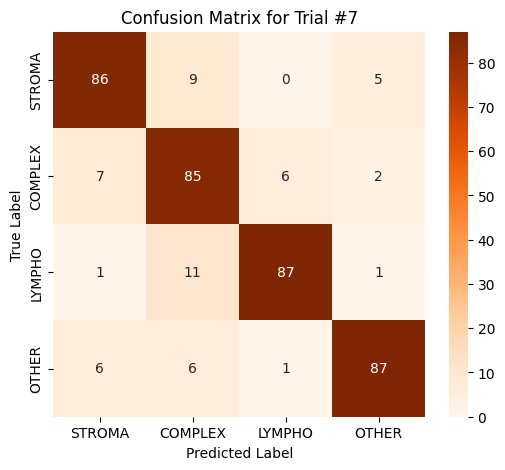

[I 2025-07-04 11:53:28,616] Trial 7 finished with value: 0.8637255281485017 and parameters: {'num_unfreeze': 7, 'num_hidden_layers': 2, 'hidden_units_1': 2048, 'dropout_1': 0.44859825625773286, 'learning_rate': 5.030598464787447e-05, 'batch_size': 32, 'weight_for_stroma': 1.047138103970143, 'weight_for_complex': 2.0350627272119217, 'weight_for_lympho': 1.2130112586254, 'weight_for_other': 0.9671940218407675, 'activation': 'relu', 'rotation_limit_c2': 13, 'color_jitter_c2': 0.364080479342304, 'elastic_p_c3': 0.725458065086778, 'coarse_p_c3': 0.5319008787649732, 'hidden_units_2': 512, 'dropout_2': 0.5099198458650701}. Best is trial 6 with value: 0.9010856779714539.


batch/accuracy,▁▃▄▆▆▆▇▇▇▇▇▇█▇▇▇▇██▇█▇██████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▃▄▆▆▆▇▇▇▇▇▇▇▇▇▇▇███████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
epoch/learning_rate,██████████████████████████▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/loss,█▃▃▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▅▆▆▇▇▆▆▇▆▆▇▆▇█▇▇▇▇▇▇▇█▇▆██████████████
epoch/val_loss,█▇▄▃▃▂▂▃▃▁▃▃▁▄▂▂▂▂▁▁▂▄▂▃▃▅▁▁▂▁▂▁▁▁▁▁▁▁▂▂
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 12s 85ms/step - accuracy: 0.2799 - loss: 13.3040 - val_accuracy: 0.2318 - val_loss: 6.2271 - learning_rate: 2.7646e-07
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step - accuracy: 0.2708 - loss: 11.7670 - val_accuracy: 0.2474 - val_loss: 5.3195 - learning_rate: 2.7646e-07
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 68ms/step - accuracy: 0.3063 - loss: 9.7912 - val_accuracy: 0.2526 - val_loss: 4.7403 - learning_rate: 2.7646e-07
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - accuracy: 0.3066 - loss: 8.6456 - val_accuracy: 0.2552 - val_loss: 4.4361 - learning_rate: 2.7646e-07
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.3105 - loss: 7.9606 - val_accuracy: 0.2891 - val_loss: 3.9222 - learning_rate: 2.7646e-07
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.3467 - loss: 6.5016 - val_accuracy: 0.3047 - val_loss: 3.4868 - learning_rate: 2.7646e-07
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - accurac

<Figure size 640x480 with 0 Axes>

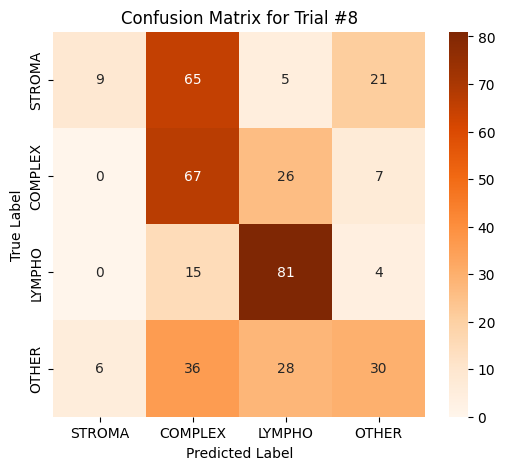

[I 2025-07-04 11:58:20,164] Trial 8 finished with value: 0.4188475856790882 and parameters: {'num_unfreeze': 11, 'num_hidden_layers': 2, 'hidden_units_1': 2048, 'dropout_1': 0.43870966169788556, 'learning_rate': 2.7645583176432817e-07, 'batch_size': 32, 'weight_for_stroma': 0.7208600798197934, 'weight_for_complex': 2.2336889910952267, 'weight_for_lympho': 1.0369842705863723, 'weight_for_other': 0.8389614097729221, 'activation': 'swish', 'rotation_limit_c2': 32, 'color_jitter_c2': 0.3904652329671144, 'elastic_p_c3': 0.711564994481607, 'coarse_p_c3': 0.6490492260536495, 'hidden_units_2': 1024, 'dropout_2': 0.40480799342203216}. Best is trial 6 with value: 0.9010856779714539.


batch/accuracy,▁▂▃▃▃▃▄▄▅▅▅▅▅▅▅▄▆▇▆▆▇▆▇▇▇▇▇▇▇▇█▇▇█▇█▇▇▇█
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▇▄▄▃▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▂▃▂▃▃▄▄▄▅▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,█████████████████████████▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁
epoch/loss,█▆▅▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▄▅▅▄▄▅▅▅▄▅▅▆▆▇▇▇▇▇▇▆▇▇▇▇▇█████▇██████
epoch/val_loss,█▆▅▄▃▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 278ms/step - accuracy: 0.2665 - loss: 18.8570 - val_accuracy: 0.2682 - val_loss: 5.4878 - learning_rate: 1.4431e-06
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - accuracy: 0.2727 - loss: 9.3272 - val_accuracy: 0.2943 - val_loss: 3.1170 - learning_rate: 1.4431e-06
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.3257 - loss: 6.2721 - val_accuracy: 0.3047 - val_loss: 2.5355 - learning_rate: 1.4431e-06
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 134ms/step - accuracy: 0.3410 - loss: 4.7680 - val_accuracy: 0.3464 - val_loss: 2.2337 - learning_rate: 1.4431e-06
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 131ms/step - accuracy: 0.3330 - loss: 4.4512 - val_accuracy: 0.3672 - val_loss: 2.0634 - learning_rate: 1.4431e-06
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - accuracy: 0.3585 - loss: 3.3573 - val_accuracy: 0.3724 - val_loss: 1.9576 - learning_rate: 1.4431e-06
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 132ms/step - a

<Figure size 640x480 with 0 Axes>

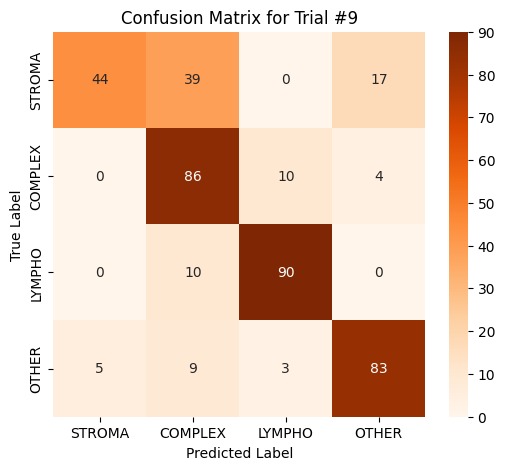

[I 2025-07-04 12:04:04,431] Trial 9 finished with value: 0.748986764304441 and parameters: {'num_unfreeze': 9, 'num_hidden_layers': 2, 'hidden_units_1': 2048, 'dropout_1': 0.43548685631873874, 'learning_rate': 1.4430990678361478e-06, 'batch_size': 64, 'weight_for_stroma': 0.7468712921217185, 'weight_for_complex': 2.160992940878881, 'weight_for_lympho': 1.206285962060968, 'weight_for_other': 0.8047207959752116, 'activation': 'relu', 'rotation_limit_c2': 11, 'color_jitter_c2': 0.36822114013870677, 'elastic_p_c3': 0.7478605770834099, 'coarse_p_c3': 0.3362427953523053, 'hidden_units_2': 512, 'dropout_2': 0.3000141642794432}. Best is trial 6 with value: 0.9010856779714539.


batch/accuracy,▁▂▂▂▄▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▆▇▇▇▇▇▇█▇█▇████
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██▇██████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██████████
epoch/val_loss,█▄▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - accuracy: 0.2466 - loss: 24.4346 - val_accuracy: 0.2526 - val_loss: 16.9261 - learning_rate: 1.4592e-07
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.2441 - loss: 22.7193 - val_accuracy: 0.2422 - val_loss: 14.8636 - learning_rate: 1.4592e-07
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 119ms/step - accuracy: 0.2439 - loss: 20.3598 - val_accuracy: 0.2448 - val_loss: 13.0882 - learning_rate: 1.4592e-07
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - accuracy: 0.2773 - loss: 17.7493 - val_accuracy: 0.2448 - val_loss: 11.5911 - learning_rate: 1.4592e-07
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 120ms/step - accuracy: 0.2564 - loss: 17.1981 - val_accuracy: 0.2422 - val_loss: 10.2698 - learning_rate: 1.4592e-07
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 122ms/step - accuracy: 0.2463 - loss: 15.8792 - val_accuracy: 0.2500 - val_loss: 9.1414 - learning_rate: 1.4592e-07
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 126m

<Figure size 640x480 with 0 Axes>

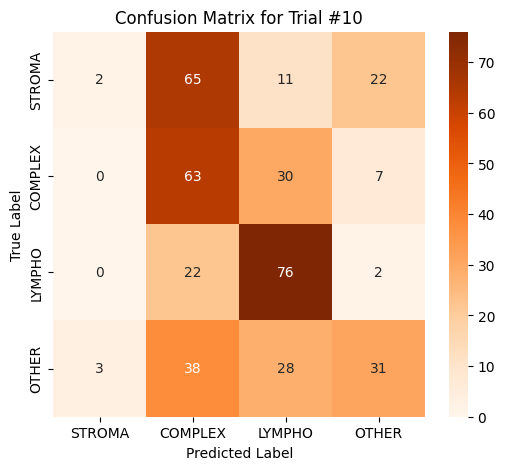

[I 2025-07-04 12:09:21,392] Trial 10 finished with value: 0.36967986268581504 and parameters: {'num_unfreeze': 8, 'num_hidden_layers': 2, 'hidden_units_1': 2048, 'dropout_1': 0.43718131954495476, 'learning_rate': 1.459193273697062e-07, 'batch_size': 64, 'weight_for_stroma': 0.5160451367163605, 'weight_for_complex': 1.5001495117096861, 'weight_for_lympho': 1.2189012238612644, 'weight_for_other': 0.8041808856833876, 'activation': 'swish', 'rotation_limit_c2': 35, 'color_jitter_c2': 0.34393956197379866, 'elastic_p_c3': 0.6598883426388243, 'coarse_p_c3': 0.3460933053308269, 'hidden_units_2': 1024, 'dropout_2': 0.36189816906389827}. Best is trial 6 with value: 0.9010856779714539.


batch/accuracy,▂▂▁▂▂▃▂▄▄▆▄▅▅▄▆▆▅▅▆▇▇▆▆▆▆▇▆▅▆▇▇▇▇▇▅▇█▇██
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▇▆▅▄▄▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▁▁▁▂▃▃▃▄▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▆▇▆▇▇▇▇▇█▇▇███
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▆▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▁▁▁▃▄▅▆▇██▇█▇▇██▇▇▇▇▇▇▇████▇█▇▇▇▇▇████
epoch/val_loss,█▆▅▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.3731 - loss: 4.1568 - val_accuracy: 0.5050 - val_loss: 1.1659 - learning_rate: 2.2970e-05
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.5804 - loss: 0.9497 - val_accuracy: 0.6600 - val_loss: 0.8646 - learning_rate: 2.2970e-05
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.7473 - loss: 0.6119 - val_accuracy: 0.7275 - val_loss: 0.7195 - learning_rate: 2.2970e-05
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.8142 - loss: 0.4544 - val_accuracy: 0.7475 - val_loss: 0.5904 - learning_rate: 2.2970e-05
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.8529 - loss: 0.4091 - val_accuracy: 0.8050 - val_loss: 0.5256 - learning_rate: 2.2970e-05
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.8579 - loss: 0.3690 - val_accuracy: 0.7950 - val_loss: 0.5801 - learning_rate: 2.2970e-05
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/st

<Figure size 640x480 with 0 Axes>

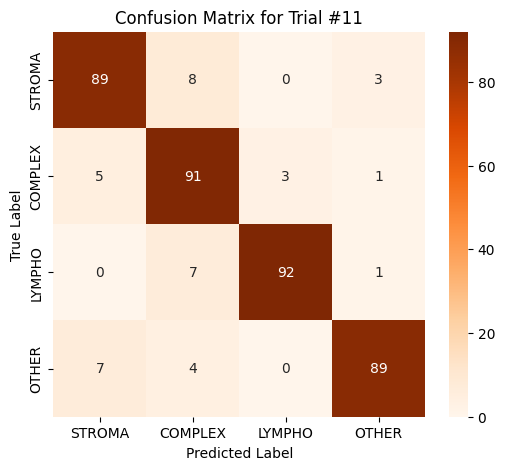

[I 2025-07-04 12:11:48,945] Trial 11 finished with value: 0.9033385806889422 and parameters: {'num_unfreeze': 10, 'num_hidden_layers': 2, 'hidden_units_1': 3200, 'dropout_1': 0.4314446351216743, 'learning_rate': 2.2970349954498297e-05, 'batch_size': 16, 'weight_for_stroma': 0.7974968777162752, 'weight_for_complex': 1.4216639994046436, 'weight_for_lympho': 0.9545173233096198, 'weight_for_other': 0.9466636127949508, 'activation': 'relu', 'rotation_limit_c2': 30, 'color_jitter_c2': 0.4383214084459963, 'elastic_p_c3': 0.4487755691296045, 'coarse_p_c3': 0.3990153687955775, 'hidden_units_2': 2048, 'dropout_2': 0.5303162044429142}. Best is trial 11 with value: 0.9033385806889422.


batch/accuracy,▁▄▆▆▆▇▇▇▇▇▇▇████████████████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▃▅▆▆▇▇▇▇▇▇▇▇███████████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,█████████████████████████▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▄▅▅▆▆▇▇▆▆▆▆▆▇▇▆█▇▇▇▇▆▇▇▇███████████████
epoch/val_loss,█▆▄▃▃▃▂▃▃▅▃▄▃▂▂▄▂▃▁▃▃▄▃▃▂▁▂▁▁▁▁▁▁▂▂▂▂▂▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 16s 149ms/step - accuracy: 0.2568 - loss: 15.8435 - val_accuracy: 0.3125 - val_loss: 3.1246 - learning_rate: 1.2590e-06
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.2957 - loss: 7.1617 - val_accuracy: 0.3698 - val_loss: 2.0683 - learning_rate: 1.2590e-06
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.2858 - loss: 4.6100 - val_accuracy: 0.3594 - val_loss: 1.9043 - learning_rate: 1.2590e-06
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.3160 - loss: 3.6988 - val_accuracy: 0.3594 - val_loss: 1.8715 - learning_rate: 1.2590e-06
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - accuracy: 0.3250 - loss: 3.0860 - val_accuracy: 0.3516 - val_loss: 1.8350 - learning_rate: 1.2590e-06
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step - accuracy: 0.3498 - loss: 2.6230 - val_accuracy: 0.3672 - val_loss: 1.7923 - learning_rate: 1.2590e-06
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accurac

<Figure size 640x480 with 0 Axes>

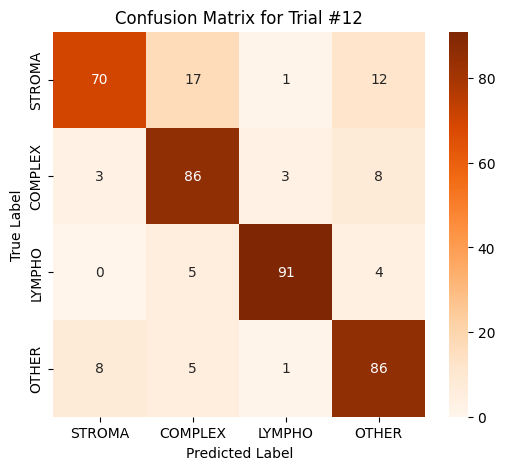

[I 2025-07-04 12:17:14,226] Trial 12 finished with value: 0.8321528619229186 and parameters: {'num_unfreeze': 12, 'num_hidden_layers': 3, 'hidden_units_1': 2048, 'dropout_1': 0.3154523163061867, 'learning_rate': 1.2590135870018012e-06, 'batch_size': 32, 'weight_for_stroma': 0.9349536813370167, 'weight_for_complex': 2.2366476028838593, 'weight_for_lympho': 1.213888391658354, 'weight_for_other': 1.2692802939560632, 'activation': 'relu', 'rotation_limit_c2': 35, 'color_jitter_c2': 0.34256442117372704, 'elastic_p_c3': 0.6538686232299605, 'coarse_p_c3': 0.39295167951918847, 'hidden_units_2': 1536, 'dropout_2': 0.41803516691769704, 'hidden_units_3': 768, 'dropout_3': 0.34084932074594415}. Best is trial 11 with value: 0.9033385806889422.


batch/accuracy,▁▁▂▁▂▂▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇█▇████▇███
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▅▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▁▂▂▂▂▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇█████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/loss,█▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇█████
epoch/val_loss,█▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 226ms/step - accuracy: 0.2932 - loss: 7.7873 - val_accuracy: 0.3594 - val_loss: 2.1449 - learning_rate: 4.7761e-06
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - accuracy: 0.4488 - loss: 2.8080 - val_accuracy: 0.4167 - val_loss: 1.5423 - learning_rate: 4.7761e-06
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - accuracy: 0.4961 - loss: 1.7785 - val_accuracy: 0.4583 - val_loss: 1.3185 - learning_rate: 4.7761e-06
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 99ms/step - accuracy: 0.5776 - loss: 1.3682 - val_accuracy: 0.5026 - val_loss: 1.2077 - learning_rate: 4.7761e-06
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - accuracy: 0.5942 - loss: 1.0899 - val_accuracy: 0.5391 - val_loss: 1.1560 - learning_rate: 4.7761e-06
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 86ms/step - accuracy: 0.6154 - loss: 1.0543 - val_accuracy: 0.5469 - val_loss: 1.1152 - learning_rate: 4.7761e-06
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - accuracy

<Figure size 640x480 with 0 Axes>

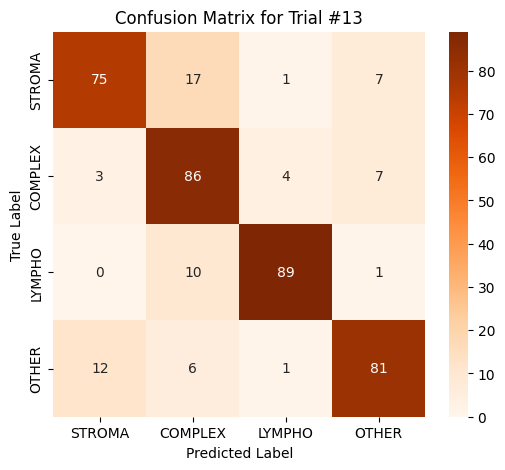

[I 2025-07-04 12:20:26,899] Trial 13 finished with value: 0.8285532342824545 and parameters: {'num_unfreeze': 9, 'num_hidden_layers': 2, 'hidden_units_1': 2560, 'dropout_1': 0.3327971270093568, 'learning_rate': 4.776136582886896e-06, 'batch_size': 64, 'weight_for_stroma': 0.8476771270043653, 'weight_for_complex': 1.6937046059959826, 'weight_for_lympho': 0.8721865307815251, 'weight_for_other': 0.8394755236563581, 'activation': 'relu', 'rotation_limit_c2': 26, 'color_jitter_c2': 0.3270899969407877, 'elastic_p_c3': 0.40243813458982736, 'coarse_p_c3': 0.6346118775794132, 'hidden_units_2': 1536, 'dropout_2': 0.3048922990334824}. Best is trial 11 with value: 0.9033385806889422.


batch/accuracy,▁▃▄▄▅▅▆▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇████████████████
batch/batch_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▄▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,████████████████████████████████████▂▂▂▁
epoch/loss,█▄▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▃▄▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████████
epoch/val_loss,█▅▄▄▃▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 18s 314ms/step - accuracy: 0.2777 - loss: 7.1826 - val_accuracy: 0.3229 - val_loss: 1.4577 - learning_rate: 1.0993e-05
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - accuracy: 0.3340 - loss: 1.7622 - val_accuracy: 0.3646 - val_loss: 1.3783 - learning_rate: 1.0993e-05
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 136ms/step - accuracy: 0.4087 - loss: 1.4380 - val_accuracy: 0.3854 - val_loss: 1.3157 - learning_rate: 1.0993e-05
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.4731 - loss: 1.2298 - val_accuracy: 0.4167 - val_loss: 1.2372 - learning_rate: 1.0993e-05
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 142ms/step - accuracy: 0.5599 - loss: 1.0636 - val_accuracy: 0.4583 - val_loss: 1.1637 - learning_rate: 1.0993e-05
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 143ms/step - accuracy: 0.5964 - loss: 0.9224 - val_accuracy: 0.5339 - val_loss: 1.0760 - learning_rate: 1.0993e-05
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - ac

<Figure size 640x480 with 0 Axes>

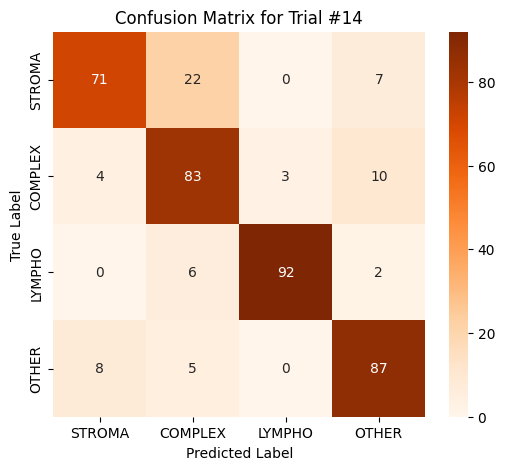

[I 2025-07-04 12:23:25,085] Trial 14 finished with value: 0.8331811851090063 and parameters: {'num_unfreeze': 12, 'num_hidden_layers': 3, 'hidden_units_1': 2048, 'dropout_1': 0.30891499254408844, 'learning_rate': 1.0993022319095636e-05, 'batch_size': 64, 'weight_for_stroma': 0.7093816395590767, 'weight_for_complex': 1.384583003153591, 'weight_for_lympho': 1.2351498926884006, 'weight_for_other': 1.0275878121697248, 'activation': 'relu', 'rotation_limit_c2': 27, 'color_jitter_c2': 0.357127207394831, 'elastic_p_c3': 0.7788201489684285, 'coarse_p_c3': 0.49657793517160453, 'hidden_units_2': 1536, 'dropout_2': 0.4068750749601041, 'hidden_units_3': 256, 'dropout_3': 0.390042269266314}. Best is trial 11 with value: 0.9033385806889422.


batch/accuracy,▁▁▂▃▄▄▅▅▅▆▆▆▇▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▁▂▃▄▄▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇███████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,█████████████████████████████████▂▂▂▂▂▂▁
epoch/loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▂▂▃▄▄▄▄▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇███▇▇▇██████████
epoch/val_loss,█▇▇▇▆▅▅▅▄▄▃▃▂▂▂▂▂▂▂▃▁▁▂▂▂▂▁▂▂▁▁▂▁▁▁▁▁▁▂▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - accuracy: 0.3150 - loss: 5.0148 - val_accuracy: 0.3825 - val_loss: 1.3147 - learning_rate: 1.4416e-05
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.4228 - loss: 1.1946 - val_accuracy: 0.5250 - val_loss: 1.1482 - learning_rate: 1.4416e-05
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.5195 - loss: 1.0168 - val_accuracy: 0.5700 - val_loss: 0.9689 - learning_rate: 1.4416e-05
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.6305 - loss: 0.8021 - val_accuracy: 0.6425 - val_loss: 0.7944 - learning_rate: 1.4416e-05
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.7373 - loss: 0.6645 - val_accuracy: 0.6950 - val_loss: 0.6954 - learning_rate: 1.4416e-05
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.7855 - loss: 0.4973 - val_accuracy: 0.7000 - val_loss: 0.6525 - learning_rate: 1.4416e-05
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/st

<Figure size 640x480 with 0 Axes>

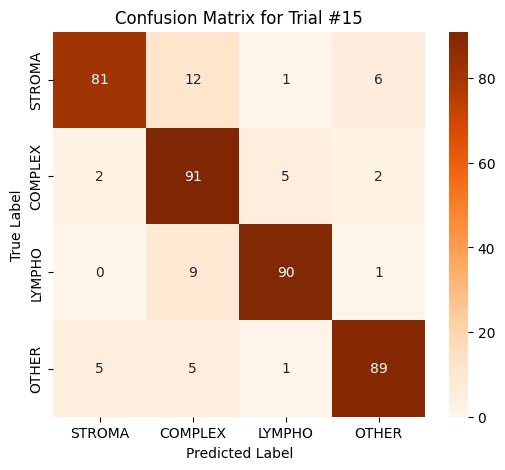

[I 2025-07-04 12:25:18,877] Trial 15 finished with value: 0.8782768219562933 and parameters: {'num_unfreeze': 7, 'num_hidden_layers': 3, 'hidden_units_1': 3200, 'dropout_1': 0.4998985869368637, 'learning_rate': 1.4415686561011549e-05, 'batch_size': 16, 'weight_for_stroma': 0.5684682482664398, 'weight_for_complex': 1.7604132975208773, 'weight_for_lympho': 0.7042527331269098, 'weight_for_other': 1.1088529558092342, 'activation': 'swish', 'rotation_limit_c2': 18, 'color_jitter_c2': 0.4433063129075816, 'elastic_p_c3': 0.5014354921645449, 'coarse_p_c3': 0.41050848476502305, 'hidden_units_2': 2048, 'dropout_2': 0.49097361767357106, 'hidden_units_3': 512, 'dropout_3': 0.3071416769519238}. Best is trial 11 with value: 0.9033385806889422.


batch/accuracy,▁▁▂▄▅▆▆▆▇▇▇▇▇█▇▇████▇███████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▅▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▄▅▅▆▆▆▇▇▇▇▇▇▇███▇█████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
epoch/learning_rate,████████████████████▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
epoch/loss,█▄▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▃▄▅▅▅▆▇▇▇▇▇▇▇▇██▆██████████████████
epoch/val_loss,█▇▅▄▃▃▃▂▂▂▂▂▁▂▂▁▂▅▂▁▁▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - accuracy: 0.3021 - loss: 4.8497 - val_accuracy: 0.4275 - val_loss: 1.4884 - learning_rate: 2.0494e-05
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 30ms/step - accuracy: 0.4244 - loss: 1.4325 - val_accuracy: 0.5150 - val_loss: 1.3205 - learning_rate: 2.0494e-05
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.5811 - loss: 1.1272 - val_accuracy: 0.6150 - val_loss: 1.1453 - learning_rate: 2.0494e-05
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.6902 - loss: 0.8779 - val_accuracy: 0.7100 - val_loss: 0.8750 - learning_rate: 2.0494e-05
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.7965 - loss: 0.6704 - val_accuracy: 0.7450 - val_loss: 0.8358 - learning_rate: 2.0494e-05
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.8607 - loss: 0.4695 - val_accuracy: 0.8100 - val_loss: 0.5929 - learning_rate: 2.0494e-05
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/st

<Figure size 640x480 with 0 Axes>

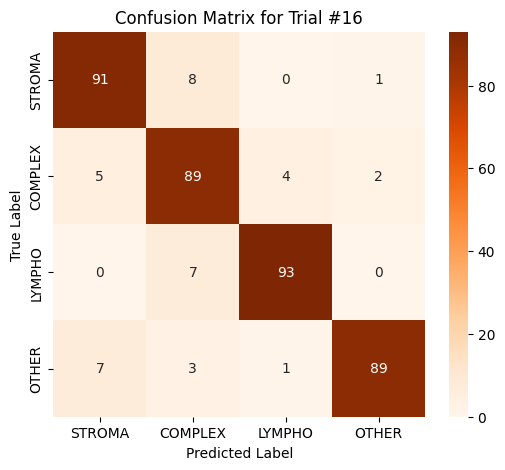

[I 2025-07-04 12:27:57,486] Trial 16 finished with value: 0.905733094626929 and parameters: {'num_unfreeze': 8, 'num_hidden_layers': 3, 'hidden_units_1': 3200, 'dropout_1': 0.4000973973760002, 'learning_rate': 2.0493718278480675e-05, 'batch_size': 16, 'weight_for_stroma': 1.1901369342624246, 'weight_for_complex': 1.9097730713407781, 'weight_for_lympho': 0.7998337134021891, 'weight_for_other': 1.0974428189919923, 'activation': 'relu', 'rotation_limit_c2': 19, 'color_jitter_c2': 0.4062930724663016, 'elastic_p_c3': 0.4988643676433927, 'coarse_p_c3': 0.30654165881495754, 'hidden_units_2': 2048, 'dropout_2': 0.35014001381002385, 'hidden_units_3': 512, 'dropout_3': 0.4934041727594036}. Best is trial 16 with value: 0.905733094626929.


batch/accuracy,▁▂▅▆▇▇▇▇▇▇▇█████████████████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
batch/loss,█▄▃▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▄▆▇▇▇▇▇▇█▇█▇██████████████████████████
epoch/epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,████████████████████▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
epoch/loss,█▄▄▃▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▂▄▆▆▆▇▇▆▇▇▇▇▇▇▇▇▇▇▇███▇████████████████
epoch/val_loss,█▇▆▄▂▂▂▂▂▁▂▂▁▁▂▂▂▁▂▃▂▁▁▁▁▁▂▂▁▁▁▂▂▂▁▁▂▂▁▁
val_f1_macro,▁
val_precision,▁


Epoch 1/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 13s 55ms/step - accuracy: 0.2634 - loss: 5.9530 - val_accuracy: 0.2650 - val_loss: 1.4605 - learning_rate: 2.2686e-05
Epoch 2/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.3816 - loss: 1.3516 - val_accuracy: 0.2750 - val_loss: 1.3441 - learning_rate: 2.2686e-05
Epoch 3/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.4358 - loss: 1.1558 - val_accuracy: 0.4075 - val_loss: 1.2264 - learning_rate: 2.2686e-05
Epoch 4/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.5415 - loss: 1.0349 - val_accuracy: 0.5125 - val_loss: 1.1397 - learning_rate: 2.2686e-05
Epoch 5/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.5792 - loss: 0.9498 - val_accuracy: 0.7275 - val_loss: 0.9934 - learning_rate: 2.2686e-05
Epoch 6/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.7440 - loss: 0.7567 - val_accuracy: 0.6175 - val_loss: 1.0888 - learning_rate: 2.2686e-05
Epoch 7/100
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/st

<Figure size 640x480 with 0 Axes>

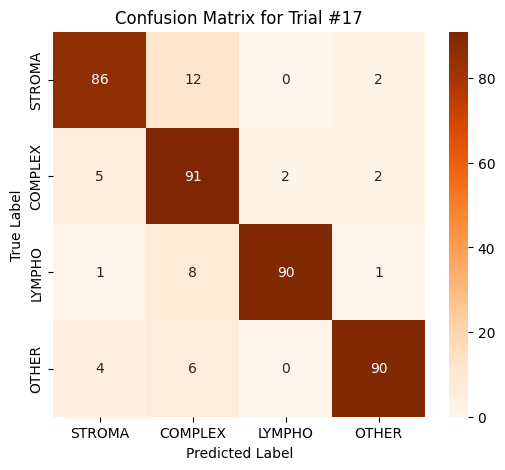

[I 2025-07-04 12:30:08,905] Trial 17 finished with value: 0.8942094052261103 and parameters: {'num_unfreeze': 10, 'num_hidden_layers': 3, 'hidden_units_1': 3200, 'dropout_1': 0.39420107599179743, 'learning_rate': 2.268560481533337e-05, 'batch_size': 16, 'weight_for_stroma': 1.183766623659171, 'weight_for_complex': 1.8643525894361073, 'weight_for_lympho': 0.7416494980110443, 'weight_for_other': 0.9167148100385574, 'activation': 'relu', 'rotation_limit_c2': 19, 'color_jitter_c2': 0.41059114102190375, 'elastic_p_c3': 0.46035040549851786, 'coarse_p_c3': 0.30420262735964326, 'hidden_units_2': 2048, 'dropout_2': 0.46611281594141285, 'hidden_units_3': 1024, 'dropout_3': 0.4992578595237609}. Best is trial 16 with value: 0.905733094626929.


batch/accuracy,▁▂▂▄▄▅▆▆▆▇▇▇▇▇▇▇▇█▇█▇███████████████████
batch/batch_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
batch/loss,█▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/accuracy,▁▂▃▄▄▅▆▆▆▇▇▇▇▇▇▇▇█▇█████████████████████
epoch/epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
epoch/learning_rate,█████████████████████▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
epoch/loss,█▄▄▃▃▃▃▂▃▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch/val_accuracy,▁▁▃▄▆▅▆▇▆▇▇▇▇▇▇███▇█▇███████████████████
epoch/val_loss,█▇▆▆▅▅▅▅▅▃▃▃▂▃▂▂▃▃▂▂▄▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_f1_macro,▁
val_precision,▁


In [ ]:
os.makedirs("optuna_logs", exist_ok=True)

study_name = "Specialist_Model_Optimization_v25"
storage_path = "sqlite:////content/specialist_optuna.db"

wandb.login()

study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_path,
    sampler=optuna.samplers.TPESampler(n_startup_trials=15),
    load_if_exists=True
)

study.optimize(objective_specialist, n_trials=50)

print("\nOptimization Finished!")
print("Best trial's Validation F1 Score:", study.best_value)
best_params = study.best_trial.params
print("\nBest Hyperparameters Found:")
print(best_params)

# Further Fine Tuning

More fine tuning to the best model of the specialist optuna run. We've adjusted the hyperparameters here a lot and gave them lots of runs until we got the final result below.

In [ ]:
idx_stroma = np.where(le.classes_ == '02_STROMA')[0][0]
idx_complex = np.where(le.classes_ == '03_COMPLEX')[0][0]
idx_lympho = np.where(le.classes_ == '04_LYMPHO')[0][0]
specialist_positive_classes = [idx_stroma, idx_complex, idx_lympho]

idx_tumor = np.where(le.classes_ == '01_TUMOR')[0][0]
idx_debris = np.where(le.classes_ == '05_DEBRIS')[0][0]
hard_negative_indices = [idx_tumor, idx_debris]

is_positive_mask = np.isin(y_train_enc, specialist_positive_classes)
X_specialist_positives = X_train_img_uint8[is_positive_mask]
y_specialist_positives = y_train_enc[is_positive_mask]

is_hard_negative_mask = np.isin(y_train_enc, hard_negative_indices)
X_hard_negatives = X_train_img_uint8[is_hard_negative_mask]

num_samples_to_add = len(y_specialist_positives) // 2
random_negative_indices = np.random.choice(np.arange(len(X_hard_negatives)), size=num_samples_to_add, replace=False)
X_other = X_hard_negatives[random_negative_indices]

X_specialist_train = np.concatenate([X_specialist_positives, X_other], axis=0)
y_remap = {idx_stroma: 0, idx_complex: 1, idx_lympho: 2}
y_specialist_train_int = np.concatenate([
    [y_remap[y] for y in y_specialist_positives],
    np.full(num_samples_to_add, 3)
])

print(f"Created specialist training set with {len(X_specialist_train)} images.")

Created specialist training set with 2250 images.


--- Preparing to run the trial ---
Parameters:
  num_unfreeze: 8
  num_hidden_layers: 2
  hidden_units_1: 1024
  dropout_1: 0.6
  learning_rate: 1.5e-05
  batch_size: 32
  weight_for_stroma: 1.2
  weight_for_complex: 1.5
  weight_for_lympho: 1.2920100606544196
  weight_for_other: 0.9
  activation: swish
  rotation_limit_c2: 25
  color_jitter_c2: 0.3702349392857647
  elastic_p_c3: 0.9
  coarse_p_c3: 0.5
  hidden_units_2: 512
  dropout_2: 0.6


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/usr/local/lib/python3.11/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_25      │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv1        │ (None, 150, 150,  │      1,792 │ input_layer_25[0… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_conv2        │ (None, 150, 150,  │     36,928 │ block1_conv1[0][… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1_pool         │ (None, 75, 75,    │          0 │ block1_conv2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv1        │ (None, 75, 75,    │     73,856 │ block1_pool[0][0] │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_conv2        │ (None, 75, 75,    │    147,584 │ block2_conv1[0][… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2_pool         │ (None, 37, 37,    │          0 │ block2_conv2[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv1        │ (None, 37, 37,    │    295,168 │ block2_pool[0][0] │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv2        │ (None, 37, 37,    │    590,080 │ block3_conv1[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_conv3        │ (None, 37, 37,    │    590,080 │ block3_conv2[0][… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block3_pool         │ (None, 18, 18,    │          0 │ block3_conv3[0][… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv1        │ (None, 18, 18,    │  1,180,160 │ block3_pool[0][0] │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv2        │ (None, 18, 18,    │  2,359,808 │ block4_conv1[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_conv3        │ (None, 18, 18,    │  2,359,808 │ block4_conv2[0][… │
│ (Conv2D)            │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block4_pool         │ (None, 9, 9, 512) │          0 │ block4_conv3[0][… │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv1        │ (None, 9, 9, 512) │  2,359,808 │ block4_pool[0][0] │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block5_conv2        │ (None, 9, 9, 512) │  2,359,808 │ block5_conv1[0][

 Total params: 57,743,204 (220.27 MB)

 Trainable params: 56,007,716 (213.65 MB)

 Non-trainable params: 1,735,488 (6.62 MB)


--- Starting Training ---
Epoch 1/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 12s 99ms/step - accuracy: 0.3030 - loss: 3.7448 - val_accuracy: 0.4375 - val_loss: 1.4863 - learning_rate: 1.5000e-05
Epoch 2/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.4719 - loss: 1.4700 - val_accuracy: 0.5201 - val_loss: 1.2397 - learning_rate: 1.5000e-05
Epoch 3/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6038 - loss: 1.2007 - val_accuracy: 0.6741 - val_loss: 1.0600 - learning_rate: 1.5000e-05
Epoch 4/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 71ms/step - accuracy: 0.7648 - loss: 0.9638 - val_accuracy: 0.7388 - val_loss: 0.9573 - learning_rate: 1.5000e-05
Epoch 5/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7997 - loss: 0.8906 - val_accuracy: 0.7634 - val_loss: 0.9011 - learning_rate: 1.5000e-05
Epoch 6/200
56/56 ━━━━━━━━━━━━━━━━━━━━ 4s 72ms/step - accuracy: 0.8638 - loss: 0.7732 - val_accuracy: 0.7902 - val_loss: 0.8384 - learning_rate: 1.5000e-05
Epoch 7/200
56/56 ━━━━━━━━━━━━━━━━━━

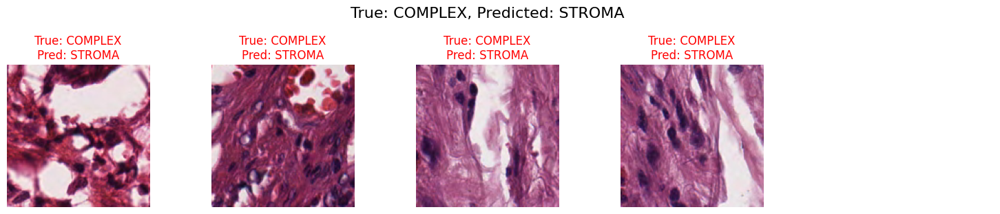

Displaying 6 images for: True: STROMA, Predicted: COMPLEX


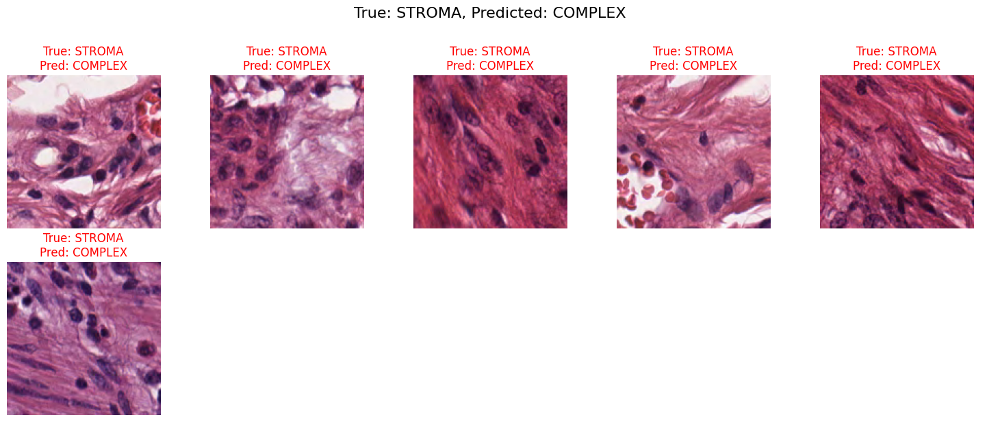


Final Macro F1 Score: 0.9295

Final Classification Report:
              precision    recall  f1-score   support

      STROMA       0.91      0.91      0.91       100
     COMPLEX       0.88      0.91      0.89       100
      LYMPHO       0.96      0.94      0.95       100
       OTHER       0.97      0.96      0.97       150

    accuracy                           0.93       450
   macro avg       0.93      0.93      0.93       450
weighted avg       0.93      0.93      0.93       450


Final Confusion Matrix:


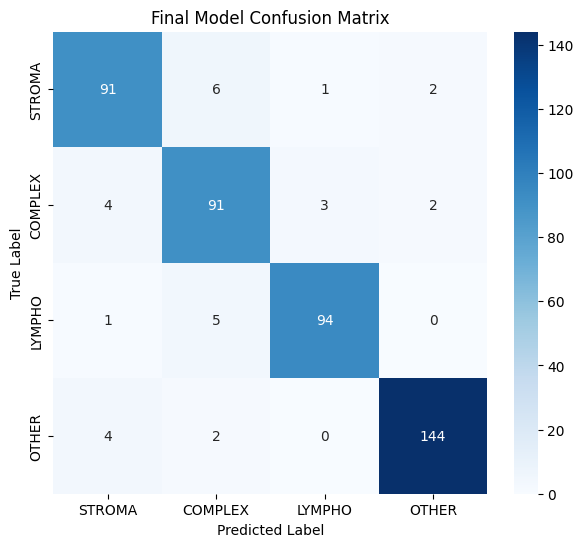

In [ ]:
def create_specialist_generator_with_weights(X_data, y_data_int, sample_weights, batch_size, num_classes, is_training=True, aug_pipelines=None):
    indices = np.arange(len(X_data))
    idx_stroma_specialist, idx_complex_specialist = 0, 1
    while True:
        if is_training:
            np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_idx = indices[i:i+batch_size]
            if len(batch_idx) != batch_size: continue

            batch_x, batch_y, batch_sw = [], [], []

            for idx in batch_idx:
                image, label_int = X_data[idx], y_data_int[idx]
                if is_training:
                    if label_int == idx_stroma_specialist: aug_pipeline = aug_pipelines['class_2']
                    elif label_int == idx_complex_specialist: aug_pipeline = aug_pipelines['class_3']
                    else: aug_pipeline = aug_pipelines['regular']

                    augmented = aug_pipeline(image=image.astype(np.uint8))
                    batch_x.append(augmented['image'])
                else:
                    batch_x.append(image)

                batch_y.append(label_int)
                batch_sw.append(sample_weights[idx])

            y_one_hot = tf.keras.utils.to_categorical(batch_y, num_classes=num_classes)

            yield preprocess_input(np.array(batch_x, dtype=np.float32)), y_one_hot, np.array(batch_sw)

def se_block(input_tensor, ratio=16):
    num_channels = input_tensor.shape[-1]
    x = GlobalAveragePooling2D()(input_tensor)
    x = Reshape((1, 1, num_channels))(x)
    x = Dense(num_channels // ratio, activation='relu')(x)
    x = Dense(num_channels, activation='sigmoid')(x)
    return multiply([input_tensor, x])

def build_model_with_attention(params, input_shape, num_classes):
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False
    for layer in base_model.layers[-params['num_unfreeze']:]:
        layer.trainable = True
    attention_output = se_block(base_model.get_layer('block5_conv3').output)
    x = Flatten()(attention_output)
    for i in range(1, params['num_hidden_layers'] + 1):
        x = Dense(params[f'hidden_units_{i}'], activation=params['activation'])(x)
        x = Dropout(params[f'dropout_{i}'])(x)
    predictions = Dense(num_classes, activation='softmax', dtype='float32')(x)
    return Model(inputs=base_model.input, outputs=predictions)

best_params = {
    'num_unfreeze': 8,
    'num_hidden_layers': 2,
    'hidden_units_1': 1024,
    'dropout_1': 0.6,
    'learning_rate': 1.5e-05,
    'batch_size': 32,
    'weight_for_stroma': 1.2,
    'weight_for_complex': 1.5,
    'weight_for_lympho': 1.2920100606544196,
    'weight_for_other': 0.9,
    'activation': 'swish',
    'rotation_limit_c2': 25,
    'color_jitter_c2': 0.3702349392857647,
    'elastic_p_c3': 0.9,
    'coarse_p_c3': 0.5,
    'hidden_units_2': 512,
    'dropout_2': 0.6
}

print("--- Preparing to run the trial ---")
print("Parameters:")
for key, value in best_params.items():
    print(f"  {key}: {value}")

is_positive_mask = np.isin(y_train_enc, specialist_positive_classes)
X_specialist_positives = X_train_img_uint8[is_positive_mask]
y_specialist_positives = y_train_enc[is_positive_mask]
X_specialist_train_full = np.concatenate([X_specialist_positives, X_other], axis=0)

X_spec_train, X_spec_val, y_spec_train, y_spec_val = train_test_split(
    X_specialist_train_full, y_specialist_train_int, test_size=0.2, random_state=42, stratify=y_specialist_train_int
)

bbox_params = A.BboxParams(format='pascal_voc', label_fields=[])
class_2_augs = A.Compose([A.Rotate(limit=best_params['rotation_limit_c2']), A.ColorJitter(brightness=best_params['color_jitter_c2'], contrast=best_params['color_jitter_c2'])], bbox_params=bbox_params)
class_3_augs = A.Compose([A.ElasticTransform(p=best_params['elastic_p_c3']), A.CoarseDropout(p=best_params['coarse_p_c3'])], bbox_params=bbox_params)
regular_augs = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.2),
], bbox_params=bbox_params)
pipelines = {'class_2': class_2_augs, 'class_3': class_3_augs, 'regular': regular_augs}

specialist_class_weights = {0: best_params['weight_for_stroma'], 1: best_params['weight_for_complex'], 2: best_params['weight_for_lympho'], 3: best_params['weight_for_other']}
sample_weights_train = np.array([specialist_class_weights.get(label, 1.0) for label in y_spec_train])
sample_weights_val = np.array([specialist_class_weights.get(label, 1.0) for label in y_spec_val])

train_generator_spec = create_specialist_generator_with_weights(X_spec_train, y_spec_train, sample_weights_train, best_params['batch_size'], num_classes=4, is_training=True, aug_pipelines=pipelines)
val_generator_spec = create_specialist_generator_with_weights(X_spec_val, y_spec_val, sample_weights_val, best_params['batch_size'], num_classes=4, is_training=False, aug_pipelines={'class_2': A.Compose([], bbox_params=bbox_params), 'class_3': A.Compose([], bbox_params=bbox_params), 'regular': A.Compose([], bbox_params=bbox_params)})

model = build_model_with_attention(best_params, input_shape=(150, 150, 3), num_classes=4)
model.compile(optimizer=AdamW(learning_rate=best_params['learning_rate'], weight_decay=1e-4),
              loss=CategoricalCrossentropy(label_smoothing=0.1),
              metrics=['accuracy'])
model.summary()

print("\n--- Starting Training ---")
history = model.fit(
    train_generator_spec,
    steps_per_epoch=len(X_spec_train) // best_params['batch_size'],
    epochs=200,
    validation_data=val_generator_spec,
    validation_steps=len(X_spec_val) // best_params['batch_size'],
    callbacks=[
        EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=12)
    ],
    verbose=1
)

print("\n--- Evaluating Final Model ---")
y_pred_probs = model.predict(preprocess_input(X_spec_val.copy()))
y_pred = np.argmax(y_pred_probs, axis=1)

stroma_label = 0
complex_label = 1
class_names = ['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER']

misclassified_c_as_s_indices = np.where((y_spec_val == complex_label) & (y_pred == stroma_label))[0]
misclassified_s_as_c_indices = np.where((y_spec_val == stroma_label) & (y_pred == complex_label))[0]

def plot_misclassified_images(indices, title, X_data, y_true, y_predicted):
    if len(indices) == 0:
        print(f"No Pictures Found For: {title}")
        return

    print(f"Displaying {len(indices)} images for: {title}")

    n_cols = 5
    n_rows = int(np.ceil(len(indices) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))
    axes = axes.flatten()

    for i, idx in enumerate(indices):
        ax = axes[i]
        ax.imshow(X_data[idx].astype('uint8'))
        true_label_name = class_names[y_true[idx]]
        pred_label_name = class_names[y_predicted[idx]]
        ax.set_title(f"True: {true_label_name}\nPred: {pred_label_name}", color='red')
        ax.axis('off')

    for i in range(len(indices), len(axes)):
        axes[i].axis('off')

    fig.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

plot_misclassified_images(
    misclassified_c_as_s_indices,
    "True: COMPLEX, Predicted: STROMA",
    X_spec_val, y_spec_val, y_pred
)

plot_misclassified_images(
    misclassified_s_as_c_indices,
    "True: STROMA, Predicted: COMPLEX",
    X_spec_val, y_spec_val, y_pred
)

f1_macro = f1_score(y_spec_val, y_pred, average='macro')
print(f"\nFinal Macro F1 Score: {f1_macro:.4f}")

print("\nFinal Classification Report:")
print(classification_report(y_spec_val, y_pred, target_names=['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER']))

print("\nFinal Confusion Matrix:")
cm = confusion_matrix(y_spec_val, y_pred)
plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER'], yticklabels=['STROMA', 'COMPLEX', 'LYMPHO', 'OTHER'])
plt.title('Final Model Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'
model_path = os.path.join(ensemble_dir, f"best_specialized_model_new.keras")
model.save(model_path)

# Retrain Best Model and Hierarchy Prediction with Sub Classifier

Training the best performing model from the first optuna trial for 200 epochs with much more patience to try and squeeze every bit of ability out of it. Then applying the Sub Classifier expert we just fine-tuned.

In [ ]:
ensemble_recipes = [
    {'name': 'Model_1_Run1_Best', 'params': {'num_unfreeze_layers': 7, 'num_hidden_layers': 1, 'hidden_units_1': 1024, 'activation': 'relu', 'dropout_rate_1': 0.538519750977465, 'optimizer': 'AdamW', 'learning_rate': 5.47e-05, 'batch_size': 32, 'beta_1': 0.9, 'beta_2': 0.999}, 'augmentation_type': 'simple'},
]



========================= Training Model: =========================
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Using 'simple' augmentation (Keras ImageDataGenerator)
Epoch 1/200
125/125 ━━━━━━━━━━━━━━━━━━━━ 31s 185ms/step - accuracy: 0.2897 - loss: 3.5830 - val_accuracy: 0.6310 - val_loss: 0.9626 - learning_rate: 5.4700e-05
Epoch 2/200
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - accuracy: 0.6596 - loss: 0.9536 - val_accuracy: 0.8080 - val_loss: 0.5579 - learning_rate: 5.4700e-05
Epoch 3/200
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - accuracy: 0.7914 - loss: 0.6102 - val_accuracy: 0.8520 - val_loss: 0.5264 - learning_rate: 5.4700e-05
Epoch 4/200
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - accuracy: 0.8470 - loss: 0.4444 - val_accuracy: 0.8890 - val_loss: 0.3399 - learning_rate: 5.4700e-05
Epoch 5/200
125/125 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - accuracy: 0.8877 - loss: 0.3474 - val_accuracy: 0.8960 - val_loss: 0.3772 - learning_rate: 5.4700e-05
Epoch 6/200
125/125 ━━━━

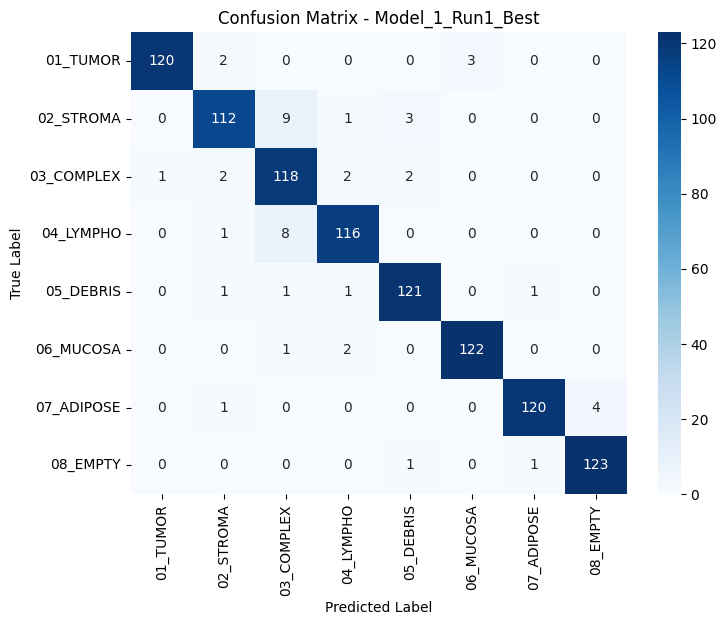

Model saved to: /content/drive/MyDrive/Ensemble_Models_Final/new_model_best.keras


In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'

y_train_one_hot = to_categorical(y_train_enc, num_classes=num_classes)
y_test_one_hot = to_categorical(y_test_enc, num_classes=num_classes)

all_histories = {}

for i, recipe in enumerate(ensemble_recipes):
    print(f"\n\n{'='*25} Training Model: {'='*25}")

    params = recipe['params']

    tf.keras.utils.set_random_seed(42 + i)
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
    base_model.trainable = False
    if params.get('num_unfreeze_layers', 0) > 0:
        for layer in base_model.layers[-params['num_unfreeze_layers']:]:
            layer.trainable = True

    x = base_model.output
    x = Flatten()(x)
    x = Dense(params['hidden_units_1'], activation=params['activation'])(x)
    x = Dropout(params['dropout_rate_1'])(x)
    if params.get('num_hidden_layers', 1) == 2:
        x = Dense(params['hidden_units_2'], activation='relu')(x)
        x = Dropout(params.get('dropout_rate_2', 0.5))(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    if params.get('optimizer') == 'Adam':
        optimizer = Adam(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))
    else:
        optimizer = AdamW(learning_rate=params['learning_rate'], beta_1=params.get('beta_1', 0.9), beta_2=params.get('beta_2', 0.999))

    early_stopping = EarlyStopping(monitor='val_loss', patience=40, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=15, min_lr=1e-7)

    keras_simple_datagen = ImageDataGenerator(
            rotation_range=20, width_shift_range=0.2, height_shift_range=0.2,
            shear_range=0.2, zoom_range=0.2, horizontal_flip=True, fill_mode='nearest',
            preprocessing_function=preprocess_input
        )

    if recipe['augmentation_type'] == 'simple':
        print("Using 'simple' augmentation (Keras ImageDataGenerator)")
        model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        train_generator = keras_simple_datagen.flow(X_train_img_uint8, y_train_enc, batch_size=params['batch_size'])
        validation_data = (preprocess_input(X_test_img_uint8.copy()), y_test_enc)

    steps_per_epoch = len(X_train_img_uint8) // params['batch_size']
    history = model.fit(
        train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=200,
        validation_data=validation_data,
        callbacks=[early_stopping, lr_scheduler],
        verbose=1
    )

    all_histories[recipe['name']] = history

    print(f"\n--- PERFORMANCE REPORT FOR: {recipe['name']} ---")
    y_pred_probs = model.predict(preprocess_input(X_test_img_uint8.copy()))
    y_pred_labels = np.argmax(y_pred_probs, axis=1)

    macro_f1 = f1_score(y_test_enc, y_pred_labels, average='macro')
    print(f"\nMacro F1 Score: {macro_f1:.4f}")

    print("\nClassification Report:")
    print(classification_report(y_test_enc, y_pred_labels, target_names=le.classes_))

    print("\nConfusion Matrix:")
    cm = confusion_matrix(y_test_enc, y_pred_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_, yticklabels=le.classes_)
    plt.title(f'Confusion Matrix - {recipe["name"]}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    model.save(os.path.join(ensemble_dir, "new_model_best.keras"))
    print(f"Model saved to: {os.path.join(ensemble_dir, 'new_model_best.keras')}")


Loading general model from: /content/drive/MyDrive/Ensemble_Models_Final/new_model_best.keras
General model loaded successfully.

Loading specialist model from: /content/drive/MyDrive/Ensemble_Models_Final/best_specialized_model_new.keras
Specialist model loaded successfully.

Testing hierarchical model with general model: new_model_best.keras
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step

Reviewing 378 uncertain predictions with the specialist...

→ Specialist made 23 changes to the predictions.
Specialist truly CORRECTED 17 predictions (from wrong to right).
Specialist WORSENED 5 predictions (from right to wrong).
Avg. confidence of main model in the corrected predictions: 80.23%

PERFORMANCE REPORT

PERFORMANCE REPORT
Original F1 (no specialist): 0.9522
Final F1 (with specialist):   0.9640

--- Classification Report ---
              precision    recall  f1-score   support

    01_TUMOR       0.99      0.96      0.98       125
   02_STROMA       0.95      0.93      0.94       125
  03_COM

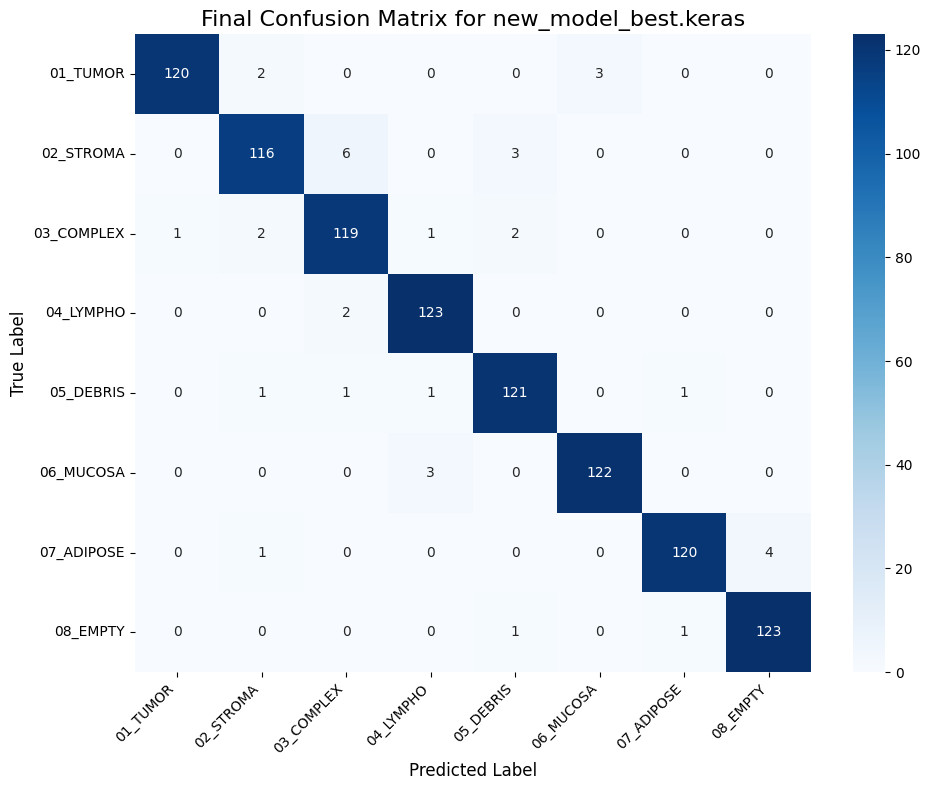


IMAGES CORRECTED BY SPECIALIST (Wrong -> Right)


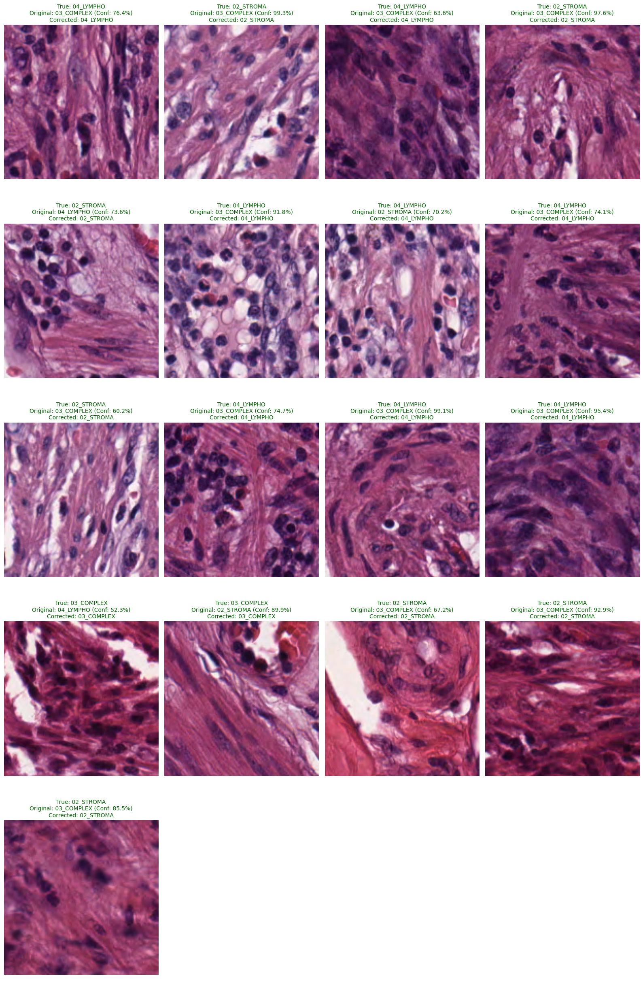


IMAGES WORSENED BY SPECIALIST (Right -> Wrong)


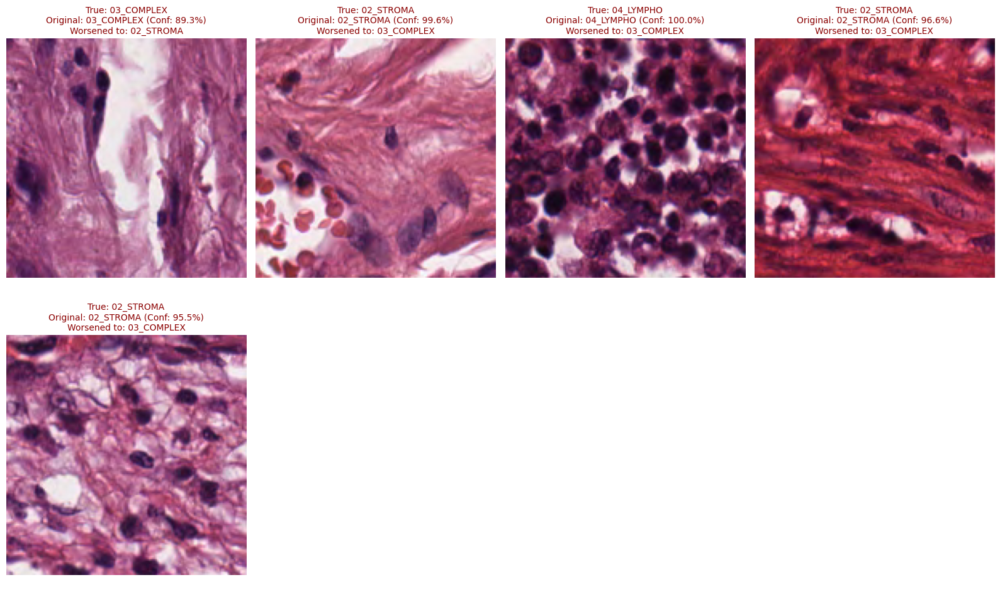

In [ ]:
ensemble_dir = '/content/drive/MyDrive/Ensemble_Models_Final'
general_model_name = 'new_model_best.keras'
specialist_model_name = 'best_specialized_model_new.keras'

general_model_path = os.path.join(ensemble_dir, general_model_name)
specialist_model_path = os.path.join(ensemble_dir, specialist_model_name)

print(f"Loading general model from: {general_model_path}")
try:
    general_model = load_model(general_model_path)
    print("General model loaded successfully.")
except Exception as e:
    raise IOError(f"Could not load the general model. Error: {e}")

print(f"\nLoading specialist model from: {specialist_model_path}")
try:
    specialist_model = load_model(specialist_model_path)
    print("Specialist model loaded successfully.")
except Exception as e:
    raise IOError(f"Could not load the specialist model. Error: {e}")

print("\n" + "="*50)
print(f"Testing hierarchical model with general model: {general_model_name}")
print("="*50)

processed_images = preprocess_input(X_test_img_uint8.copy())
general_preds_probs = general_model.predict(processed_images, verbose=1)
general_preds_indices = np.argmax(general_preds_probs, axis=1)
general_preds_max_probs = np.max(general_preds_probs, axis=1)

final_predictions = general_preds_indices.copy()

trigger_classes = [np.where(le.classes_ == c)[0][0] for c in ['02_STROMA', '03_COMPLEX', '04_LYMPHO']]
specialist_to_general_map = {
    0: np.where(le.classes_ == '02_STROMA')[0][0],
    1: np.where(le.classes_ == '03_COMPLEX')[0][0],
    2: np.where(le.classes_ == '04_LYMPHO')[0][0]
}
confidence_threshold = 1.0

mask_is_trigger_class = np.isin(general_preds_indices, trigger_classes)
mask_is_uncertain = general_preds_max_probs <= confidence_threshold
indices_to_reclassify = np.where(mask_is_trigger_class & mask_is_uncertain)[0]

truly_corrected_info = []
worsened_info = []

if len(indices_to_reclassify) > 0:
    print(f"\nReviewing {len(indices_to_reclassify)} uncertain predictions with the specialist...")
    images_to_resubmit = X_test_img_uint8[indices_to_reclassify]
    specialist_preds_probs = specialist_model.predict(preprocess_input(images_to_resubmit.copy()), verbose=0)
    specialist_preds_indices = np.argmax(specialist_preds_probs, axis=1)

    num_changes, num_truly_corrected, num_worsened = 0, 0, 0
    confidences_of_corrected = []

    for i, original_index in enumerate(indices_to_reclassify):
        specialist_decision = specialist_preds_indices[i]

        if specialist_decision in specialist_to_general_map:
            new_prediction = specialist_to_general_map[specialist_decision]
            original_prediction = final_predictions[original_index]
            true_label = y_test_enc[original_index]

            if original_prediction != new_prediction:
                num_changes += 1

                if original_prediction != true_label and new_prediction == true_label:
                    num_truly_corrected += 1
                    original_confidence = general_preds_max_probs[original_index]
                    confidences_of_corrected.append(original_confidence)
                    truly_corrected_info.append({
                        'img_index': original_index,
                        'original_pred_label': original_prediction,
                        'new_pred_label': new_prediction,
                        'true_label': true_label,
                        'confidence': original_confidence
                    })

                elif original_prediction == true_label and new_prediction != true_label:
                    num_worsened += 1
                    original_confidence = general_preds_max_probs[original_index]
                    worsened_info.append({
                        'img_index': original_index,
                        'original_pred_label': original_prediction,
                        'new_pred_label': new_prediction,
                        'true_label': true_label,
                        'confidence': original_confidence
                    })

            final_predictions[original_index] = new_prediction

    print(f"\n→ Specialist made {num_changes} changes to the predictions.")
    print(f"Specialist truly CORRECTED {num_truly_corrected} predictions (from wrong to right).")
    print(f"Specialist WORSENED {num_worsened} predictions (from right to wrong).")

    if num_truly_corrected > 0:
        avg_confidence = np.mean(confidences_of_corrected)
        print(f"Avg. confidence of main model in the corrected predictions: {avg_confidence:.2%}")
else:
    print("\nNo predictions met the criteria for specialist review.")

print("\n" + "="*50)
print("PERFORMANCE REPORT")

original_f1 = f1_score(y_test_enc, general_preds_indices, average='macro')
final_f1 = f1_score(y_test_enc, final_predictions, average='macro')

print("\n" + "="*50)
print("PERFORMANCE REPORT")
print("="*50)
print(f"Original F1 (no specialist): {original_f1:.4f}")
print(f"Final F1 (with specialist):   {final_f1:.4f}\n")

print("--- Classification Report ---")
print(classification_report(y_test_enc, final_predictions, target_names=le.classes_))

print("\n--- Confusion Matrix ---")
cm = confusion_matrix(y_test_enc, final_predictions)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title(f'Final Confusion Matrix for {general_model_name}', fontsize=16)
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

if len(truly_corrected_info) > 0:
    print("\n" + "="*50)
    print("IMAGES CORRECTED BY SPECIALIST (Wrong -> Right)")
    print("="*50)

    n_cols = 4
    n_rows = int(np.ceil(len(truly_corrected_info) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 5))
    axes = axes.flatten()

    for i, info in enumerate(truly_corrected_info):
        ax = axes[i]
        true_name = le.classes_[info['true_label']]
        original_name = le.classes_[info['original_pred_label']]
        new_name = le.classes_[info['new_pred_label']]
        title = (
            f"True: {true_name}\n"
            f"Original: {original_name} (Conf: {info['confidence']:.1%})\n"
            f"Corrected: {new_name}"
        )
        ax.imshow(X_test_img_uint8[info['img_index']].astype('uint8'))
        ax.set_title(title, fontsize=10, color='darkgreen')
        ax.axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

if len(worsened_info) > 0:
    print("\n" + "="*50)
    print("IMAGES WORSENED BY SPECIALIST (Right -> Wrong)")
    print("="*50)

    n_cols = 4
    n_rows = int(np.ceil(len(worsened_info) / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 5))
    axes = axes.flatten()

    for i, info in enumerate(worsened_info):
        ax = axes[i]
        true_name = le.classes_[info['true_label']]
        original_name = le.classes_[info['original_pred_label']]
        new_name = le.classes_[info['new_pred_label']]
        title = (
            f"True: {true_name}\n"
            f"Original: {original_name} (Conf: {info['confidence']:.1%})\n"
            f"Worsened to: {new_name}"
        )
        ax.imshow(X_test_img_uint8[info['img_index']].astype('uint8'))
        ax.set_title(title, fontsize=10, color='darkred')
        ax.axis('off')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    plt.tight_layout()
    plt.show()

del general_model
del specialist_model
tf.keras.backend.clear_session()